## Import all the necessary libraries and packages


In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.preprocessing import StandardScaler
import seaborn as sns
import scipy
import random

In [3]:
data_train_clean_onset = pd.read_csv('data_train_clean_onset.csv')

# Try to see if regression works

## Define the helper functions for random forest regression

In [4]:
data_train = data_train_clean_onset.dropna()

In [4]:

def train_test_split_sbjs(mydata_no_nan, test_size = 0.2, random_seed = 42):
 
    # assert that the data has no NaNs
    assert mydata_no_nan.isnull().sum().sum() == 0, 'There are NaNs in the data'
    
    # get the unique subjects
    unique_subjects = mydata_no_nan['Sbj_ID'].unique()

    # define the train size
    train_size = 1 - test_size

    # define the number of subjects in the test set

    test_size_subjects = int(test_size * len(unique_subjects))

    # Select the unique subjects for the test set

    test_subjects = random.sample(list(unique_subjects), test_size_subjects)

    # Select the unique subjects for the training set
    train_subjects = [x for x in unique_subjects if x not in test_subjects]

    # Create the test and training sets
    test_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(test_subjects)]
    train_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(train_subjects)]

    # Create X and y from dataframes to use in scikit-learn (drop Label, SleepStage, Sbj_ID and ifCleanOnset columns)

    X_train = train_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_train = train_set['Label']
    X_test = test_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_test = test_set['Label']


    # Create list of sbj_IDs for each sample in the training and test sets
    sbj_train_set = train_set['Sbj_ID'].copy()
    sbj_test_set = test_set['Sbj_ID'].copy()

    # Turn the sbj_IDs into a list
    sbj_train_set = sbj_train_set.tolist()
    sbj_test_set = sbj_test_set.tolist()
    


    return X_train, y_train, X_test, y_test, sbj_train_set, sbj_test_set

In [40]:
def evaluate_regression(predictions, y_test, ifsave = False, savepath = None, ifplot = False, iftest = False):

    # check if the predictions are in the correct format
   
    predictions = np.array(predictions)

    # check if the y_test is in the correct format
    
    y_test = np.array(y_test)

    errors = abs(y_test - predictions)
    mape = np.where(y_test != 0, 100 * (errors / y_test), 0)
    accuracy = 100 - np.mean(mape)
    mse = sklearn.metrics.mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)
    r2 = sklearn.metrics.r2_score(y_test, predictions)


    print('Mean Absolute Error:', round(np.mean(errors), 2))
    print('Accuracy:', round(accuracy, 2), '%.')
    print('Mean Squared Error:', round(mse, 2))
    print('Root Mean Squared Error:', round(rmse, 2))
    print('R2:', round(r2, 2))
    


    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
    plt.scatter(y_test, predictions, alpha=0.2)
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Predicted time to sleep onset')
    plt.title('Actual vs Predicted time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_actual_vs_predicted.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_actual_vs_predicted.png'))
    if ifplot:
        plt.show()
    plt.close()

    residuals = y_test - predictions
    plt.scatter(y_test, residuals, alpha=0.2)
    plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1)
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Residuals')
    plt.title('Actual vs Residuals for predicted time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_actual_vs_residuals.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_actual_vs_residuals.png'))
    if ifplot:
        plt.show()
    plt.close()

    plt.hist(residuals)
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.title('Residuals distribution')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_residuals_distribution.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_residuals_distribution.png'))
    if ifplot:
        plt.show()
    plt.close()

    # for each actual, plot the mean residual 
    # round y_test to 0.1 decimal place
    y_test = np.round(y_test, 1)

    predictions_residuals_dict = {}
    for i in range(len(y_test)):
        if y_test[i] not in predictions_residuals_dict:
            predictions_residuals_dict[y_test[i]] = []
        predictions_residuals_dict[y_test[i]].append(residuals[i])
    
    # sort it in ascending order of keys
    predictions_residuals_dict = dict(sorted(predictions_residuals_dict.items()))


    actual_predictions_dict = {}
    for i in range(len(y_test)):
        if y_test[i] not in actual_predictions_dict:
            actual_predictions_dict[y_test[i]] = []
        actual_predictions_dict[y_test[i]].append(predictions[i])
    
    # sort it in ascending order of keys
    actual_predictions_dict = dict(sorted(actual_predictions_dict.items()))

    
    predictions_residuals_mean_dict = {}
    for key in predictions_residuals_dict:
        predictions_residuals_mean_dict[key] = np.mean(predictions_residuals_dict[key])
    
    # sort it in ascending order of keys
    predictions_residuals_mean_dict = dict(sorted(predictions_residuals_mean_dict.items()))


    residuals_std_dict = {}
    for key in predictions_residuals_dict:
        residuals_std_dict[key] = np.std(predictions_residuals_dict[key])
    # sort it in ascending order of keys
    residuals_std_dict = dict(sorted(residuals_std_dict.items()))

    
    actuals_predictions_mean_dict = {}
    for key in actual_predictions_dict:
        actuals_predictions_mean_dict[key] = np.mean(actual_predictions_dict[key])
    
    # sort it in ascending order of keys
    actuals_predictions_mean_dict = dict(sorted(actuals_predictions_mean_dict.items()))

    predictions_std_dict = {}
    for key in actual_predictions_dict:
        predictions_std_dict[key] = np.std(actual_predictions_dict[key])
    # sort it in ascending order of keys
    predictions_std_dict = dict(sorted(predictions_std_dict.items()))

    plt.plot(list(predictions_residuals_mean_dict.keys()), list(predictions_residuals_mean_dict.values()))
    # create std shading
    plt.fill_between(list(predictions_residuals_mean_dict.keys()),
                        np.array(list(predictions_residuals_mean_dict.values())) - np.array(list(residuals_std_dict.values())),
                        np.array(list(predictions_residuals_mean_dict.values())) + np.array(list(residuals_std_dict.values())),
                        alpha=0.2)
    # plot ideal line (x = 0)
    plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
    plt.legend(['Mean of residuals', 'STD of residuals', 'Ideal residuals line'])
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Residuals for this actual')
    plt.title('Mean residual of predictions for each actual time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_mean_residuals_across_time.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_mean_residuals_across_time.png'))
    if ifplot:
        plt.show()
    plt.close()

    plt.plot(list(actuals_predictions_mean_dict.keys()), list(actuals_predictions_mean_dict.values()))
    # create std shading
    plt.fill_between(list(actuals_predictions_mean_dict.keys()),
                        np.array(list(actuals_predictions_mean_dict.values())) - np.array(list(predictions_std_dict.values())),
                        np.array(list(actuals_predictions_mean_dict.values())) + np.array(list(predictions_std_dict.values())),
                        alpha=0.2)
    # plot ideal line (x = y)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')
    plt.legend(['Mean of predictions', 'STD of predictions', 'Ideal actual = prediction line (x = y)'])
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Mean prediction for this actual')
    plt.title('Mean prediction for each actual time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_mean_predictions_across_time.png'))
        else:
             plt.savefig(os.path.join(savepath, 'crossval_mean_predictions_across_time.png'))
    if ifplot:
        plt.show()
    plt.close()

    return predictions, errors, mape, accuracy, residuals

In [54]:
import matplotlib.pyplot as plt

# Create a function for plotting the sorted feature importances in a long horizontal bar chart and increased font size

def plot_feature_importances(model, X, ifsave = False, savepath = None, ifplot = True):
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    names = [X.columns[i] for i in indices]
    fig, ax = plt.subplots(figsize=(16, 24), dpi=200)
    ax.barh(range(X.shape[1]), importances[indices], align = 'center')
    #increase the font size
    ax.tick_params(axis='both', which='major', labelsize=16)
    ax.tick_params(axis='both', which='minor', labelsize=16)
    
    # increase the size of the axis labels
    ax.xaxis.label.set_size(20)
    ax.yaxis.label.set_size(20)

    ax.set_yticks(range(X.shape[1]))
    ax.set_yticklabels(names, fontsize=16)
    ax.set_xlabel('Importance', fontsize=20)
    ax.set_ylabel('Feature', fontsize=20)
    ax.set_title('Feature importances', fontsize=20)

    if ifsave:
        plt.savefig(os.path.join(savepath, 'tfeature_importances.png'), dpi=200, bbox_inches='tight', pad_inches=0.1)
    if ifplot:
        plt.show()
    plt.close()

    return importances, indices, names

# Create a funciton for evaluating the performance of the model on the test data

def evaluate_performance_test(model, X_test, y_test, ifplot = True, ifsave = False, savepath = None):

    

    predictions = model.predict(X_test)

    predictions, errors, mape, accuracy, residuals = evaluate_regression(predictions, y_test, ifsave = ifsave, 
                                                                         savepath = savepath, ifplot = ifplot, iftest = True)

    return predictions, errors, mape, accuracy, residuals

# Create a function for evaluating the performance of the model on the training data given the predictions it produced

def evaluate_performance_train(y_train, predictions, ifplot = True, ifsave = False, savepath = None, iftest = False):
    predictions, errors, mape, accuracy, residuals = evaluate_regression(predictions, y_train,ifsave = ifsave, 
                                                                         savepath = savepath, ifplot = ifplot, iftest = iftest)
    return errors, mape, accuracy, residuals 

In [10]:
# Create test and training sets
X_train, y_train, X_test, y_test, sbj_train_set, sbj_test_set = train_test_split_sbjs(data_train, test_size = 0.1, random_seed = 42)

In [11]:

import pandas as pd
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict

In [13]:

# Create a random forest Regressor
rf = RandomForestRegressor(n_estimators = 300)

# Perform cross-validation
predictions_cv = cross_val_predict(rf, X_train, y_train, cv=5)



In [23]:
import os
folder_name = 'RF_regressor_clean_onset_data_300_estimators'
path = os.path.join(os.getcwd(), folder_name)
if not os.path.exists(path):
    os.mkdir(path)

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:12: RuntimeWarning: divide by zero encountered in divide
  mape = np.where(y_test != 0, 100 * (errors / y_test), 0)


Mean Absolute Error: 6.48
Accuracy: -67.82 %.
Mean Squared Error: 61.01
Root Mean Squared Error: 7.81
R2: 0.2


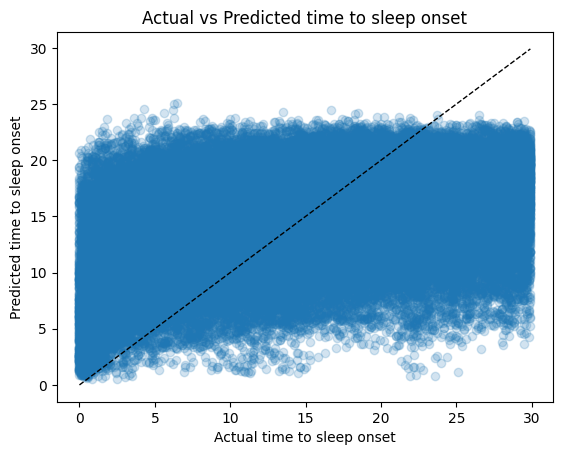

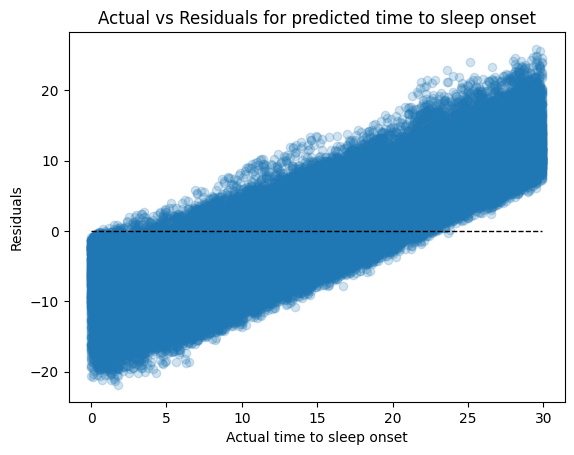

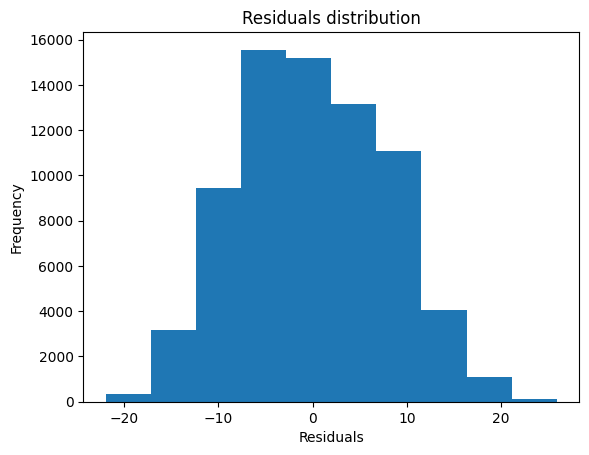

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:128: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


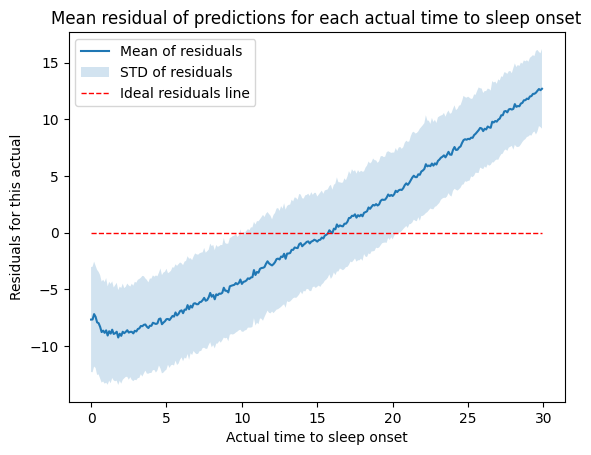

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:149: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


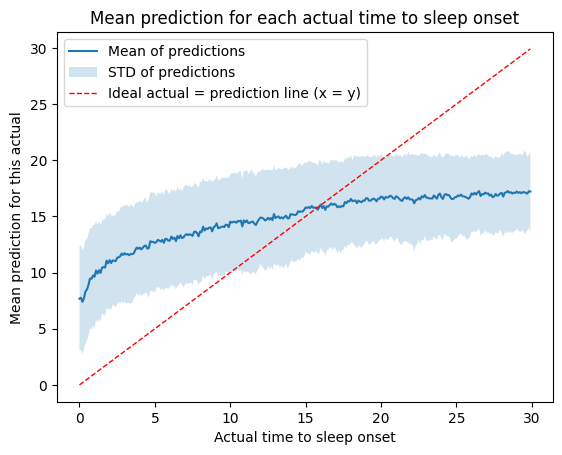

In [36]:


# Evaluate the predictions made during cross-validation
errors, mape, accuracy, residuals = evaluate_performance_train(y_train, predictions_cv, ifplot = True, savepath = path, ifsave = True)

In [38]:

rf.fit(X_train, y_train)
# Predict the labels for the test set
predictions = rf.predict(X_test)

# evaluate the predictions made during cross-validation






Mean Absolute Error: 6.05
Accuracy: -54.24 %.
Mean Squared Error: 54.2
Root Mean Squared Error: 7.36
R2: 0.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:12: RuntimeWarning: divide by zero encountered in divide
  mape = np.where(y_test != 0, 100 * (errors / y_test), 0)


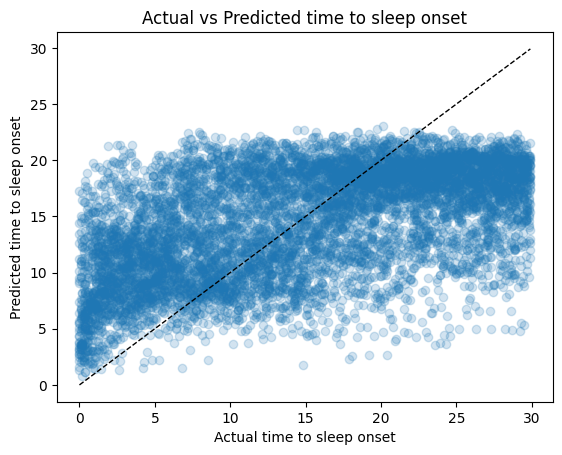

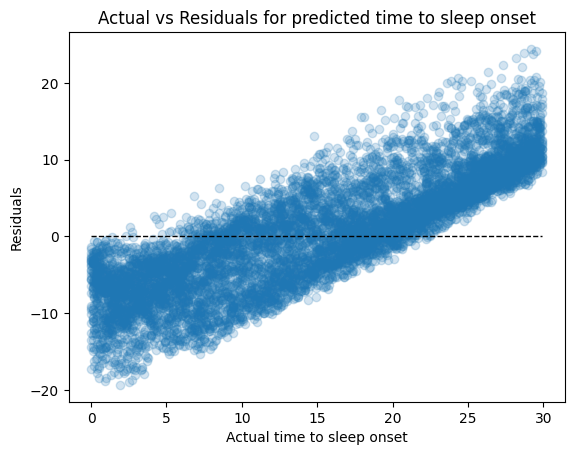

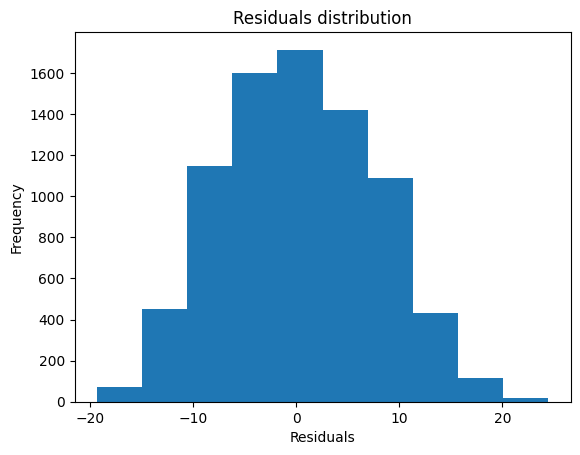

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:128: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


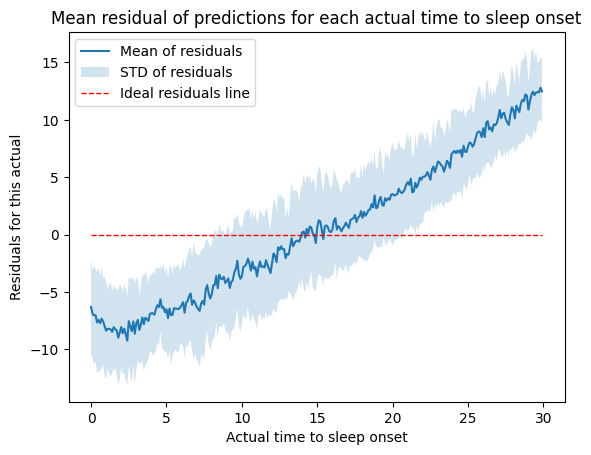

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:149: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


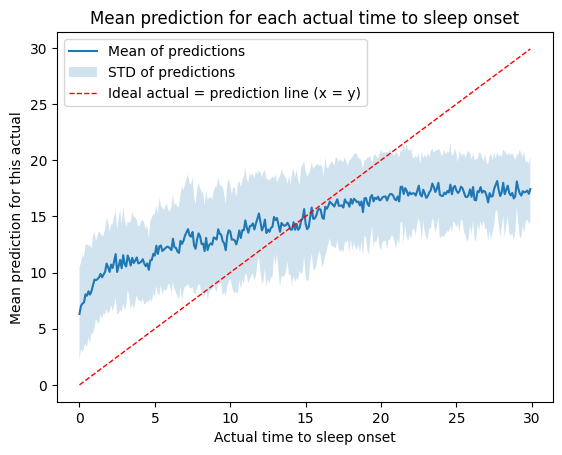

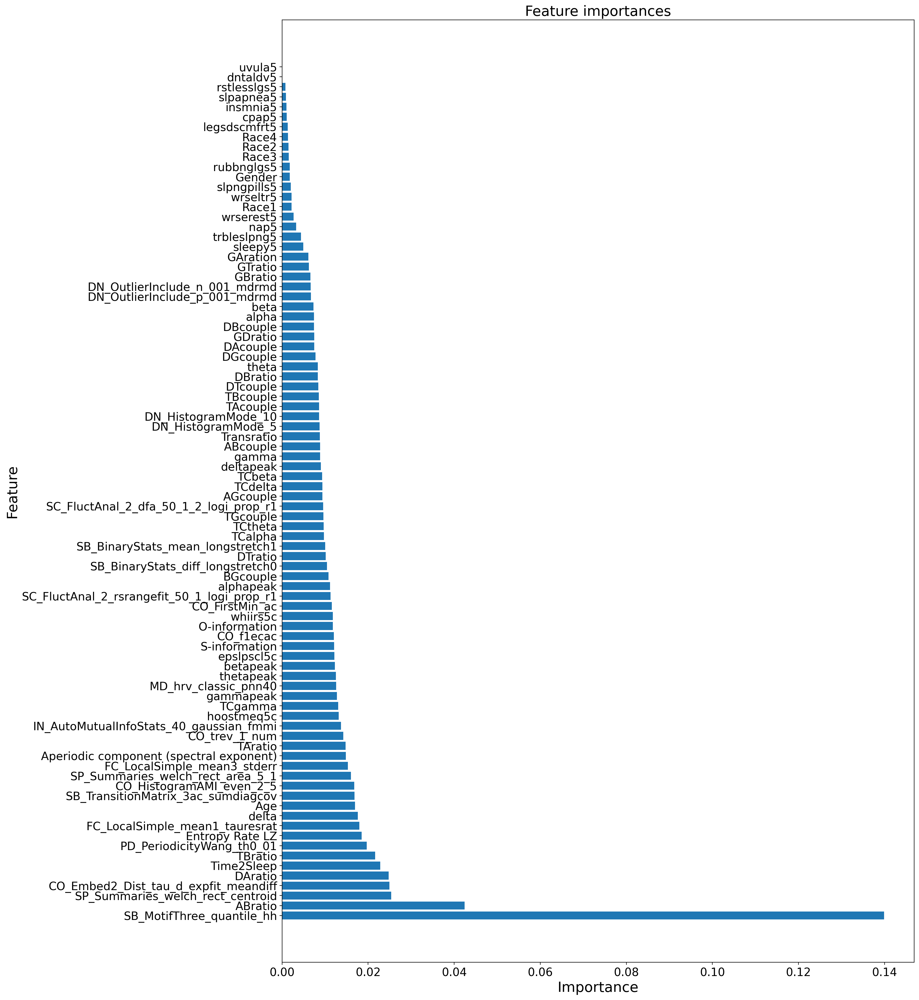

In [55]:
errors, mape, accuracy, residuals= evaluate_performance_train(y_test, predictions, ifplot = True, savepath = path, ifsave = True, iftest=True)

importances, indices, names = plot_feature_importances(rf, X_train, ifplot = True, savepath = path, ifsave = True)

## 150 estimators

In [56]:
#Try rf with 150 estimators
rf_150 = RandomForestRegressor(n_estimators = 150)
predictions_cv_150 = cross_val_predict(rf_150, X_train, y_train, cv=10)




In [57]:
import os
folder_name = 'RF_regressor_clean_onset_data_150_estimators'
path = os.path.join(os.getcwd(), folder_name)
if not os.path.exists(path):
    os.mkdir(path)

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:12: RuntimeWarning: divide by zero encountered in divide
  mape = np.where(y_test != 0, 100 * (errors / y_test), 0)


Mean Absolute Error: 6.48
Accuracy: -67.82 %.
Mean Squared Error: 61.01
Root Mean Squared Error: 7.81
R2: 0.2


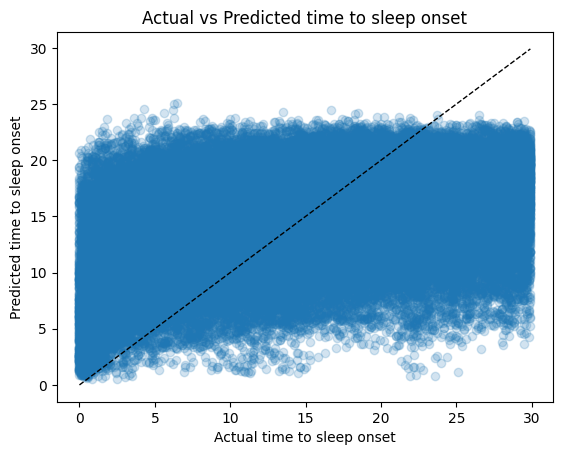

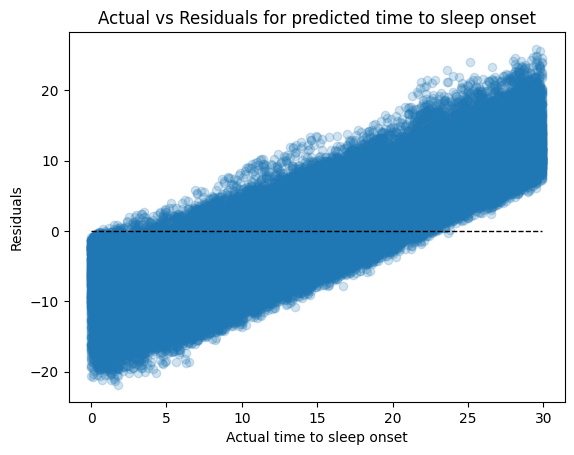

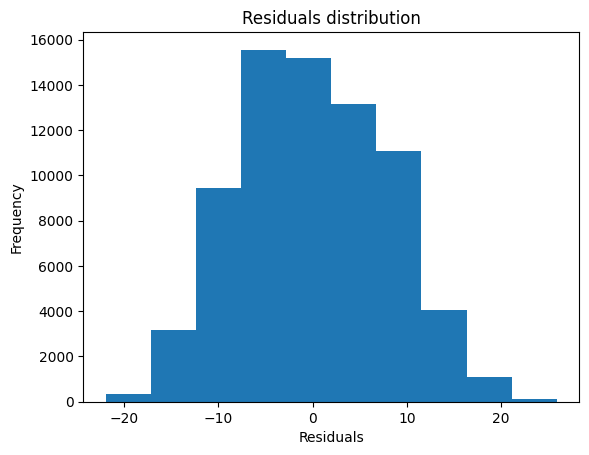

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:128: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


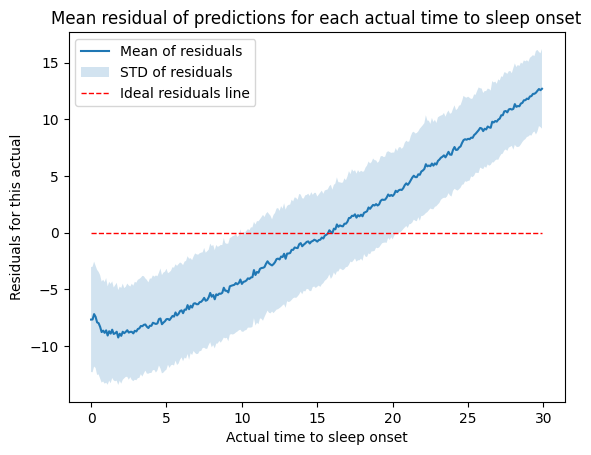

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:149: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


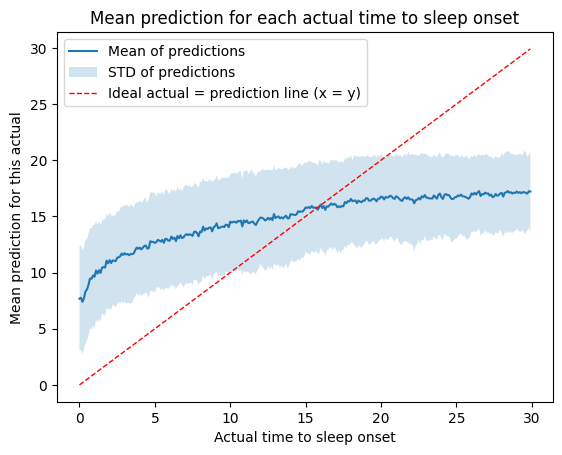

In [58]:


# Evaluate the predictions made during cross-validation
errors, mape, accuracy, residuals = evaluate_performance_train(y_train, predictions_cv, ifplot = True, savepath = path, ifsave = True)


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:12: RuntimeWarning: divide by zero encountered in divide
  mape = np.where(y_test != 0, 100 * (errors / y_test), 0)


Mean Absolute Error: 6.09
Accuracy: -55.44 %.
Mean Squared Error: 54.81
Root Mean Squared Error: 7.4
R2: 0.28


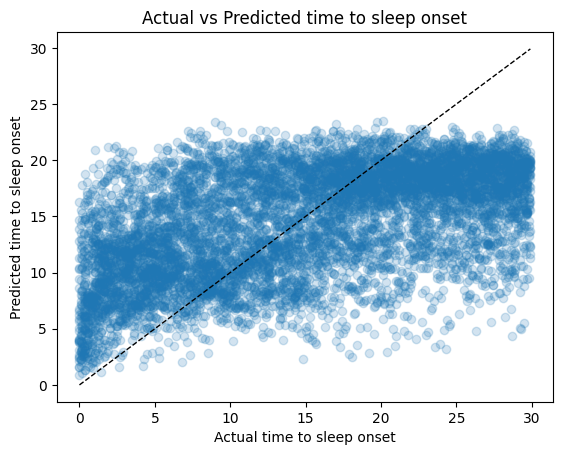

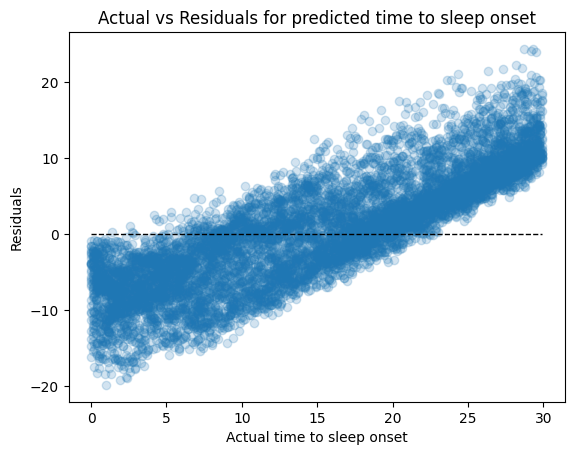

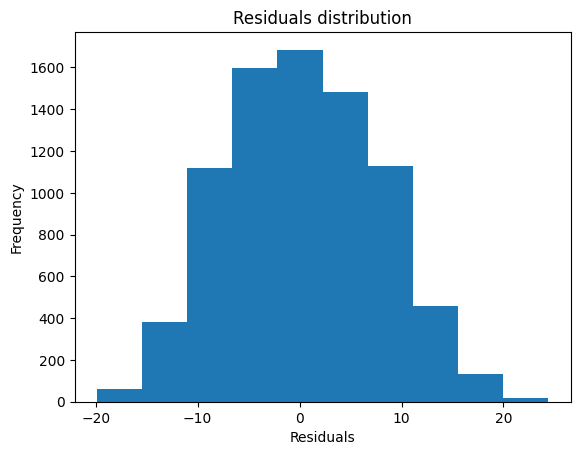

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:128: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


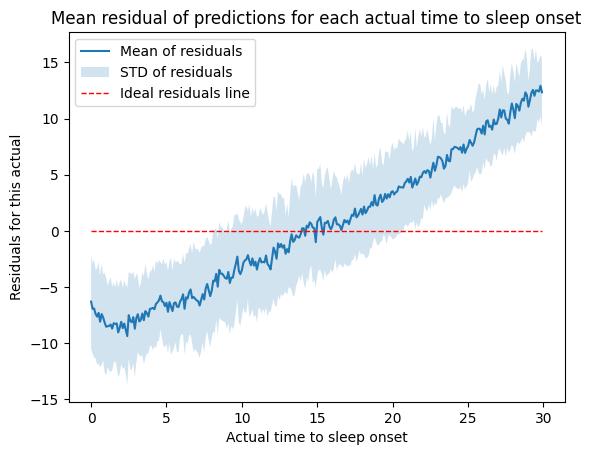

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_57127/2041704885.py:149: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


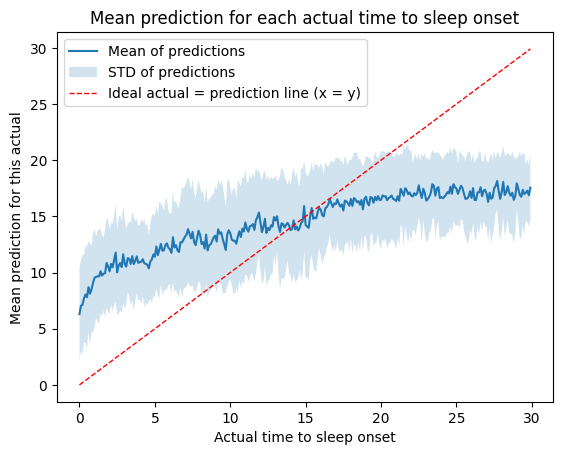

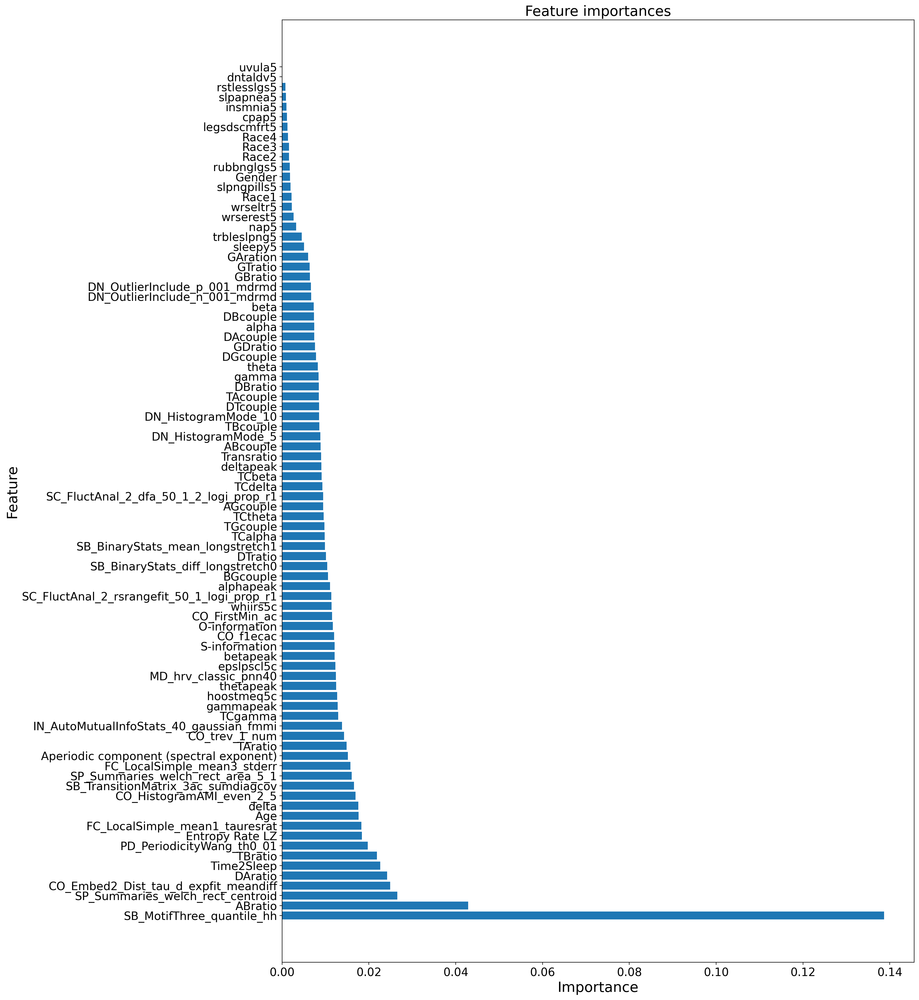

In [59]:
# Fit the model to the training data
rf_150.fit(X_train, y_train)

# Predict the labels for the test set
predictions_150 = rf_150.predict(X_test)

# Evaluate the predictions made during cross-validation
errors, mape, accuracy, residuals = evaluate_performance_train(y_test, predictions_150, ifplot = True, savepath = path, ifsave = True, iftest=True)

importances, indices, names = plot_feature_importances(rf_150, X_train, ifplot = True, savepath = path, ifsave = True)

# Try Random forest in classification. 

## Prepare helper functions for imbalanced data

In [37]:
!pip install imblearn

In [71]:
# import RandomForestClassifier
from sklearn.ensemble import RandomForestClassifier

# import scores
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import confusion_matrix, classification_report



In [72]:
from sklearn.model_selection import GroupKFold

def cross_validation_group(X_train, y_train, groups, model, n_splits=5, ifresample=True, ifvocal = False):
    # Assuming X_train and y_train are your features and target variable

    ros = RandomOverSampler()
    gkf = GroupKFold(n_splits=n_splits)

    predictions = [] # list of predictions 
    actual = [] # list of actual values
    num_fold = 0 # fold number
    for train_index, test_index in gkf.split(X_train, y_train, groups): # groups -> Sbj_ID column
        num_fold += 1
        if ifvocal: 
            print('-------------- Fold number %s/%s --------------'%(num_fold, n_splits))
        
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        
        if ifresample:
            X_train_fold_res, y_train_fold_res = ros.fit_resample(X_train_fold, y_train_fold)
            model.fit(X_train_fold_res, y_train_fold_res)
        else:
            model.fit(X_train_fold, y_train_fold)
    
        y_pred = model.predict(X_test_fold)
        
        predictions.append(y_pred)
        actual.append(y_test_fold)
        if ifvocal:
            print('Accuracy of fold %s: '%num_fold, accuracy_score(y_test_fold, y_pred))
            print('Overall f1-score of fold %s: '%num_fold, f1_score(y_test_fold, y_pred, average='weighted'))
            print(classification_report(y_test_fold, y_pred))

    #predictions = [item for sublist in predictions for item in sublist]
    predictions = np.concatenate(predictions)
    actual = np.concatenate(actual)
      
    return predictions, actual

In [91]:
def evaluate_classification (true_labels, predictions, index = ['10 minutes before sleep', 'Awake'], columns = ['10 minutes before sleep', 'Awake'], 
                             ifsave = False, savepath = None, ifplot = False, iftest = False):
    # evaluate the perfromance of the model

    accuracy = accuracy_score(true_labels, predictions)
    

    if ifplot:
        print(f'Accuracy: {accuracy}')
        print(classification_report(true_labels, predictions))
    
    if ifsave:  
        report = classification_report(true_labels, predictions, output_dict=True)
        df = pd.DataFrame(report).transpose()
        if iftest:
            savedir = os.path.join(savepath, 'test_classification_report.csv')
        else:
            savedir = os.path.join(savepath, 'crossval_classification_report.csv')
        df.to_csv(savedir)


    # plot the confusion matrix

    # include the names of the classes in the confusion matrix

    # create a normalised confusion matrix where the values in each row sum to 1

    cm = confusion_matrix(true_labels, predictions, normalize='true', labels = index)
    # normalise the confusion matrix
    #cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
    cm = pd.DataFrame(cm,
                            index = index,
                            columns = columns)
    plt.figure(figsize=(5.5,4))
    #fig, ax = plt.subplots(figsize=(10,10))
    
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues')


    #cm = confusion_matrix(true_labels, predictions)

    #cm_df = pd.DataFrame(cm,
                            #index = index,
                            #columns = columns)
    #
                    
    #sns.heatmap(cm_df, annot=True, cmap='Blues', fmt='g')

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    if ifplot:
        plt.show()
    if ifsave:
        if iftest:
            savepath = os.path.join(savepath, 'test_confusion_matrix.png')
        else:
            savepath = os.path.join(savepath, 'crossval_confusion_matrix.png')
        plt.savefig(savepath)
    
    plt.close()

## Compare different upsampling and downsampling methods (SMOTE, ADASYN, etc.)

In [78]:
# import smote 
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler, BorderlineSMOTE, SVMSMOTE, SMOTENC
from imblearn.under_sampling import RandomUnderSampler, TomekLinks, ClusterCentroids, NearMiss, EditedNearestNeighbours, RepeatedEditedNearestNeighbours, AllKNN, InstanceHardnessThreshold, CondensedNearestNeighbour, OneSidedSelection, NeighbourhoodCleaningRule
from sklearn.model_selection import GroupKFold

categorical_columns = ['nap5', 'trbleslpng5', 'slpngpills5', 'sleepy5', 'legsdscmfrt5', 'rubbnglgs5', 
                        'wrserest5', 'wrseltr5', 'slpapnea5', 'cpap5', 'dntaldv5', 'uvula5', 'insmnia5', 
                        'rstlesslgs5', 'whiirs5c', 'epslpscl5c', 'hoostmeq5c']

def resample_data(X_train, y_train, imbalance_method='oversampling'):
    # Assuming X_train and y_train are your features and target variable
    if imbalance_method == 'Random Oversampling':
        # Define the oversampling method
        resampler = RandomOverSampler()
    elif imbalance_method == 'Random Undersampling':
        # Define the undersampling method
        resampler = RandomUnderSampler()
    elif imbalance_method == 'SMOTE':
        # Define the undersampling method
        resampler = SMOTE()
    elif imbalance_method == 'ADASYN':
        resampler = ADASYN()
    elif imbalance_method == 'BorderlineSMOTE':
        resampler = BorderlineSMOTE()
    elif imbalance_method == 'SVMSMOTE':
        resampler = SVMSMOTE()
    elif imbalance_method == 'SMOTENC':
        resampler = SMOTENC(categorical_features=categorical_columns)
    elif imbalance_method == 'TomekLinks':
        resampler = TomekLinks()
    elif imbalance_method == 'ClusterCentroids':
        resampler = ClusterCentroids()
    elif imbalance_method == 'NearMiss':
        resampler = NearMiss()
    elif imbalance_method == 'EditedNearestNeighbours':
        resampler = EditedNearestNeighbours()
    elif imbalance_method == 'RepeatedEditedNearestNeighbours':
        resampler = RepeatedEditedNearestNeighbours()
    elif imbalance_method == 'AllKNN':
        resampler = AllKNN()
    elif imbalance_method == 'InstanceHardnessThreshold':
        resampler = InstanceHardnessThreshold()
    elif imbalance_method == 'CondensedNearestNeighbour':
        resampler = CondensedNearestNeighbour()
    elif imbalance_method == 'OneSidedSelection':
        resampler = OneSidedSelection()
    elif imbalance_method == 'NeighbourhoodCleaningRule':
        resampler = NeighbourhoodCleaningRule()
    
    X_train_res, y_train_res = resampler.fit_resample(X_train, y_train)
    
    return X_train_res, y_train_res

def cross_validation_group_imbalance(X_train, y_train, groups, model, labels, n_splits=5, imbalance_method='oversampling', ifvocal = False):

    gkf = GroupKFold(n_splits=n_splits)

    predictions = [] # list of predictions 
    actual = [] # list of actual values
    num_fold = 0 # fold number
    for train_index, test_index in gkf.split(X_train, y_train, groups): # groups -> Sbj_ID column
        num_fold += 1
        if ifvocal:
            print('-------------- Fold number %s/%s --------------'%(num_fold, n_splits))
      
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        
        
        X_train_fold_res, y_train_fold_res = resample_data(X_train_fold, y_train_fold, imbalance_method=imbalance_method)
       
        model.fit(X_train_fold_res, y_train_fold_res)
    
        y_pred = model.predict(X_test_fold)
        
        predictions.append(y_pred)
        actual.append(y_test_fold)
        
        if ifvocal:
            print('Accuracy of fold %s: '%num_fold, accuracy_score(y_test_fold, y_pred))
            print('Overall f1-score of fold %s: '%num_fold, f1_score(y_test_fold, y_pred, average='weighted'))
        f1_scores = f1_score(y_test_fold, y_pred, labels = labels, average=None)
        if ifvocal:
            print('F1-score of {} class {}: '.format(labels[0], f1_scores[0]))
            print('F1-score of {} class {}: '.format(labels[1], f1_scores[1]))
        
        
        if ifvocal:
            print(classification_report(y_test_fold, y_pred))

    #predictions = [item for sublist in predictions for item in sublist]
    predictions = np.concatenate(predictions)
    actual = np.concatenate(actual)
      
    return predictions, actual



## Hyperparameter tune on the best resampling method

In [98]:
import os
import json
# Create a list of all resampling methods to test on Random Forest
# Create a list of all resampling methods to test on Random Forest
resampling_methods = ['Random Oversampling', 'Random Undersampling', 'SMOTE', 'ADASYN', 
                        'BorderlineSMOTE', 'TomekLinks',  'NearMiss',  'AllKNN', 
                        'OneSidedSelection']



# Create a dataset 

def try_resampling_methods(resampling_methods, dataset, pre_onset_times = [5], awake_times = [10], model_type = 'Random Forest', test_size = 0, n_splits=5, random_seed = 42, ifvocal = False): 

    experiment_dir = "RF_resampling_experiments"
    if not os.path.exists(experiment_dir):
        os.mkdir(experiment_dir)

    # dataframes to store the results
    master_results = pd.DataFrame(columns = ['pre_sleep_time', 'awake_time', 'resampling_method', 
                                             'crossval_f1_weighted', 'crossval_f1_macro', 
                                                     'crossval_awake_class_f1', 'crossval_pre_onset_class_f1',
                                                     'testall_f1_weighted', 'testall_f1_macro', 
                                                     'testall_awake_class_f1', 'testall_pre_onset_class_f1'])

    

    for pre_onset_time in pre_onset_times:

        dataset_all_labels = dataset.copy()
        dataset_all_labels['Old_label'] = dataset_all_labels['Label'].copy()

        dataset_all_labels['Label'] = np.where(dataset_all_labels['Label'] <= pre_onset_time, f'{pre_onset_time} minutes before sleep', 'Awake')
        
        for awake_time in awake_times:
            if pre_onset_time > awake_time:
                continue
            print(f"Processing for pre_onset_time: {pre_onset_time} and awake_time: {awake_time}")
            
            sub_dir = os.path.join(experiment_dir, f"pre_onset_{pre_onset_time}_awake_{awake_time}")
            if not os.path.exists(sub_dir):
                os.mkdir(sub_dir)

            # Try classification on 5 minutes before sleep and 20+ minutes before sleep
            dataset_refined = dataset[(dataset['Label'] <= pre_onset_time) | (dataset['Label'] >= awake_time)].copy()

            # Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '20+ minutes before sleep' in the other case
            dataset_refined['Label'] = np.where(dataset_refined['Label'] <= pre_onset_time, f'{pre_onset_time} minutes before sleep', 'Awake')

            # Create X_train, y_train, X_test, y_test
            X_train, y_train, _, _, sbj_train_set, sbj_test_set= train_test_split_sbjs(dataset_refined, test_size = 0.1, random_seed = random_seed)

            dataset_test = dataset_all_labels[dataset_all_labels['Sbj_ID'].isin(sbj_test_set)].copy()
            dataset_test.drop(columns = ['Old_label'], inplace = True)

            X_test, y_test, _, _, _, _ = train_test_split_sbjs(dataset_test, test_size = 0, random_seed = random_seed)

            # Create a dictionary to store the results
            method_results = {}

            for resampling_method in resampling_methods:
                sub_sub_dir = os.path.join(sub_dir, resampling_method)
                if not os.path.exists(sub_sub_dir):
                    os.mkdir(sub_sub_dir)

                # Create a model
                if model_type == 'Random Forest':
                    model = RandomForestClassifier(n_estimators=150, random_state=random_seed)
                

                print ('------------------ %s ------------------'%resampling_method)
                print('\n')
                
                if ifvocal:
                    

                    print('CROSS-VALIDATION')
                    print('\n')

                # Perform cross-validation
                try:
                    
                    predictions_cv_class, actuals_cv_class = cross_validation_group_imbalance(X_train, y_train, sbj_train_set, model, 
                                                                                            labels=[f'{pre_onset_time} minutes before sleep', 'Awake'], n_splits=n_splits, 
                                                                                            imbalance_method=resampling_method, ifvocal=ifvocal)
                    model.fit(X_train, y_train)
                    predictions_test_class = model.predict(X_test)
                    
        
                except ValueError as e:
                    if "No samples will be generated with the provided ratio settings" in str(e):
                        print("Error encountered: No samples were generated with the provided ratio settings. Skipping this iteration.")
                        # Maybe return some default/fallback values or simply continue with the next iteration
                        continue
                    else:
                        # Raising the exception if it's not the one we're expecting
                        raise e


                
                # Evaluate the predictions made during cross-validation
                evaluate_classification(actuals_cv_class, predictions_cv_class, index = [f'{pre_onset_time} minutes before sleep', 'Awake'],
                                         columns = [f'{pre_onset_time} minutes before sleep', 'Awake'], ifplot= False, ifsave = True, 
                                            savepath = sub_sub_dir)
                evaluate_classification(y_test, predictions_test_class, index = [f'{pre_onset_time} minutes before sleep', 'Awake'],
                                            columns = [f'{pre_onset_time} minutes before sleep', 'Awake'], ifplot= False, ifsave = True, 
                                                savepath = sub_sub_dir, iftest = True)
                print('-'*100)
                print('CROSS-VALIDATION RESULTS')
                print('-'*100)
                labels = [f'{pre_onset_time} minutes before sleep', 'Awake']
                f1_weighted= f1_score(actuals_cv_class, predictions_cv_class, average='weighted')
                f1_macro = f1_score(actuals_cv_class, predictions_cv_class, average='macro')
                f1_scores = f1_score(actuals_cv_class, predictions_cv_class, labels = labels, average=None)
                print('F1-score of {} class {}: '.format(labels[0], f1_scores[0]))
                print('F1-score of {} class {}: '.format(labels[1], f1_scores[1]))
                print(f"F1_weighted: {f1_weighted}")
                
                print('-'*100)
                print('TEST RESULTS')
                print('-'*100)

                test_f1_weighted= f1_score(y_test, predictions_test_class, average='weighted')
                test_f1_macro = f1_score(y_test, predictions_test_class, average='macro')
                test_f1_scores = f1_score(y_test, predictions_test_class, labels = labels, average=None)

                print('F1-score of {} class {}: '.format(labels[0], test_f1_scores[0]))
                print('F1-score of {} class {}: '.format(labels[1], test_f1_scores[1]))
                print(f"F1_weighted: {test_f1_weighted}")
            
                # Store the results
                method_results[resampling_method] = {'pre_sleep_time': pre_onset_time, 'awake_time': awake_time, 
                                                     'resampling_method': resampling_method,
                                                     'crossval_f1_weighted': f1_weighted, 'crossval_f1_macro': f1_macro, 
                                                     'crossval_awake_class_f1': f1_scores[1], 'crossval_pre_onset_class_f1': f1_scores[0],
                                                     'testall_f1_weighted': test_f1_weighted, 'testall_f1_macro': test_f1_macro, 
                                                     'testall_awake_class_f1': test_f1_scores[1], 'testall_pre_onset_class_f1': test_f1_scores[0]}

                # resample the xtrain and ytrain
                X_train_res, y_train_res = resample_data(X_train, y_train, imbalance_method=resampling_method)

                # Fit the model on the resampled data
                model.fit(X_train_res, y_train_res)

                importances, indices, names = plot_feature_importances(model, X_train_res, ifsave = True, ifplot = False, savepath= sub_sub_dir)
            
            # Save the f1 results for this pre_onset and awake_time combination to a table (CSV)
            df = pd.DataFrame.from_dict(method_results, orient='index')
            df.to_csv(os.path.join(sub_dir, 'f1_results.csv'))

            # Append the results to the master results
            master_results = pd.concat([master_results, df], axis=0)
            
    #save the master results as a csv
    master_results.to_csv(os.path.join(experiment_dir, 'master_results.csv'))
    

  

### Pre sleep onset window -> 5, Awake window -> 20

In [100]:

pre_onset_windows = [2.5, 5, 10, 15]
awake_windows = [2.5, 5, 10, 15, 20, 25]



results = try_resampling_methods(resampling_methods, data_train, pre_onset_times = pre_onset_windows, awake_times = awake_windows , model_type = 'Random Forest', test_size = 0.2, n_splits=5, random_seed = 42)


Processing for pre_onset_time: 2.5 and awake_time: 2.5
------------------ Random Oversampling ------------------


----------------------------------------------------------------------------------------------------
CROSS-VALIDATION RESULTS
----------------------------------------------------------------------------------------------------
F1-score of 2.5 minutes before sleep class 0.33624898291293737: 
F1-score of Awake class 0.9523545301890924: 
F1_weighted: 0.8935147339137578
----------------------------------------------------------------------------------------------------
TEST RESULTS
----------------------------------------------------------------------------------------------------
F1-score of 2.5 minutes before sleep class 0.3519706691109074: 
F1-score of Awake class 0.9518818484992853: 
F1_weighted: 0.8943384168220169
------------------ Random Undersampling ------------------


---------------------------------------------------------------------------------------------------

OSError: [Errno 28] No space left on device: 'RF_resampling_experiments/pre_onset_2.5_awake_2.5/TomekLinks/crossval_classification_report.csv'

# 5 minutes prior to sleep onset and 10-30 first minute before sleep

## Try Balanced Random Forest Classifier

In [52]:
# import balanced random forest classifier
from imblearn.ensemble import BalancedRandomForestClassifier


In [53]:
mydata_normalised_preprocessed_one_hot = data_train.copy()

In [54]:

# Try classification on 5 minutes before sleep and 20+ minutes before sleep
mydata_normalised_preprocessed_one_hot_5_10 = mydata_normalised_preprocessed_one_hot[(mydata_normalised_preprocessed_one_hot['Label'] <= 5) | (mydata_normalised_preprocessed_one_hot['Label'] >= 10)].copy()

# Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '20+ minutes before sleep' in the other case

mydata_normalised_preprocessed_one_hot_5_10['Label'] = np.where(mydata_normalised_preprocessed_one_hot_5_10['Label'] <= 5, '5 minutes before sleep', 'Awake')


CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.723629292354392
Overall f1-score of fold 1:  0.7477068543716417
                        precision    recall  f1-score   support

5 minutes before sleep       0.40      0.73      0.52      4284
                 Awake       0.91      0.72      0.81     16800

              accuracy                           0.72     21084
             macro avg       0.66      0.73      0.66     21084
          weighted avg       0.81      0.72      0.75     21084

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7032821096566116
Overall f1-score of fold 2:  0.7313739698949587
                        precision    recall  f1-score   support

5 minutes before sleep       0.39      0.79      0.52      4284
                 Awake       0.93      0.68      0.79     16800

              accuracy                           0.70     21084
             macro avg       0.66      0.74      0.65     21084
       

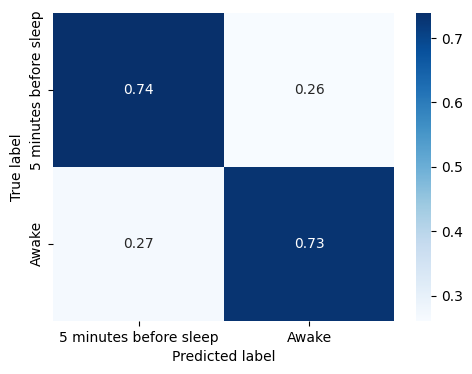

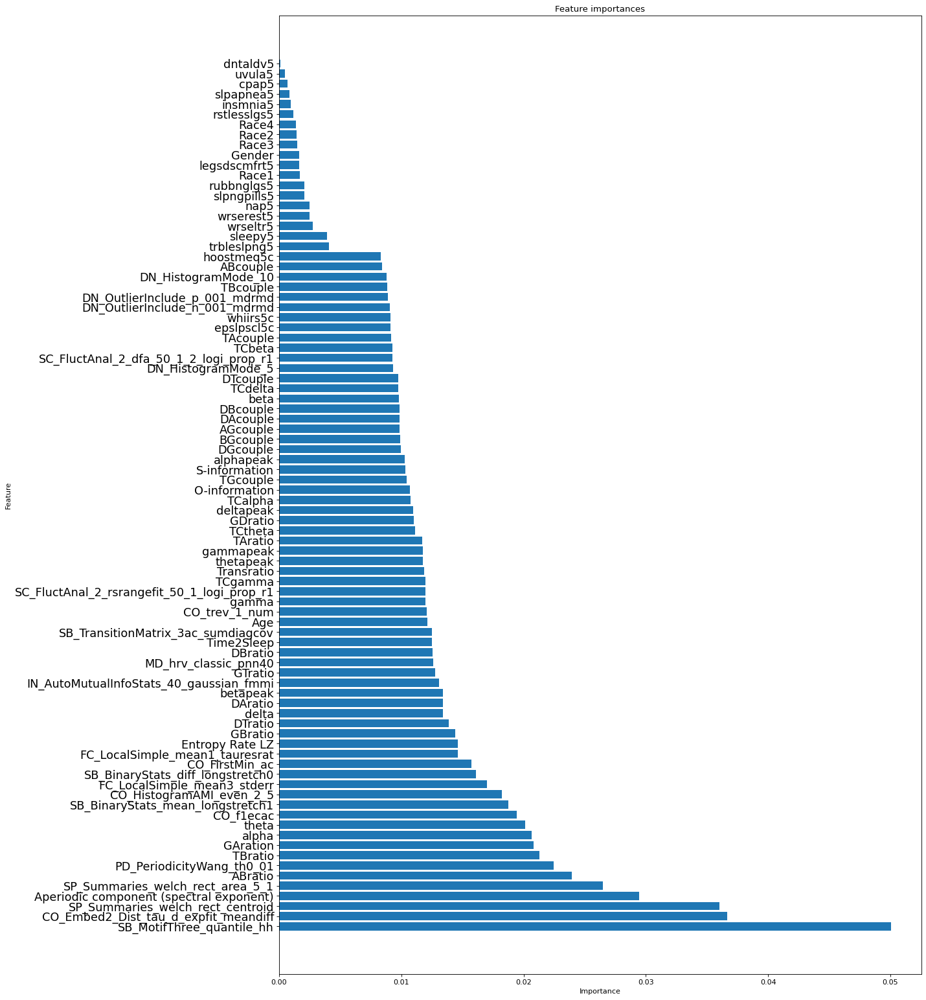

In [55]:
# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
brfc = BalancedRandomForestClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, brfc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


brfc.fit(X_train_5, y_train_5)

importances, indices, names = plot_feature_importances(brfc, X_train_5)


In [331]:
!pip install graphviz
!conda install graphviz -y

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 23.5.0
  latest version: 23.5.2

Please update conda by running

    $ conda update -n base -c conda-forge conda

Or to minimize the number of packages updated during conda update use

     conda install conda=23.5.2



## Package Plan ##

  environment location: /usr/local/Caskroom/miniforge/base/envs/myenv

  added / updated specs:
    - graphviz


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    boost-cpp-1.73.0           |      h1a28f6b_12          17 KB
    c-ares-1.19.0              |       h80987f9_0         104 KB
    cairo-1.16.0               |       h302bd0f_5         1.0 MB
    expat-2.4.9                |       hc377ac9_0         127 KB
    font-ttf-dejavu-sans-mono-2.37|       hd3eb1b0_0         335 KB
    font-ttf-inconsolata-2.001 |       hcb22688_0          83 KB
    font-ttf-

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.038355 to fit


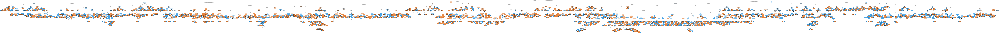

In [332]:
# look at the decision tree 
from sklearn.tree import export_graphviz



# Export as dot file
export_graphviz(brfc.estimators_[0], out_file='tree.dot',
                feature_names = names,
                class_names = ['5 minutes before sleep', 'Awake'],
                rounded = True, proportion = False,
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')



TEST SET
Accuracy: 0.6665993129925237
                        precision    recall  f1-score   support

5 minutes before sleep       0.51      0.65      0.58      1713
                 Awake       0.79      0.67      0.73      3236

              accuracy                           0.67      4949
             macro avg       0.65      0.66      0.65      4949
          weighted avg       0.69      0.67      0.67      4949



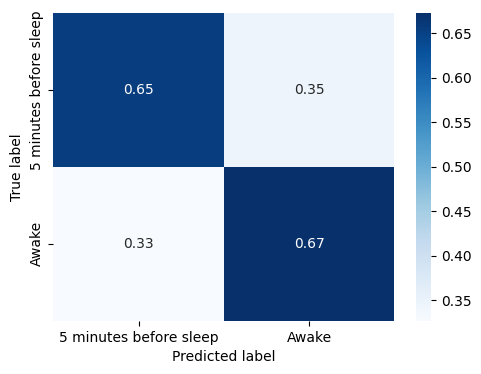

In [ ]:

print('TEST SET')

# Predict the labels for the test set
predictions_class_5_10= brfc.predict(X_test_5)

# Evaluate the predictions made during cross-validation
evaluate_classification(y_test_5, predictions_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


## Try Balanced Bagging Classifier

CROSS-VALIDATION
-------------- Fold number 1/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 1:  0.754600645038892
Overall f1-score of fold 1:  0.7702447499378228
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.63      0.51      4284
                 Awake       0.89      0.79      0.84     16800

              accuracy                           0.75     21084
             macro avg       0.66      0.71      0.67     21084
          weighted avg       0.80      0.75      0.77     21084

-------------- Fold number 2/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 2:  0.7454467842914058
Overall f1-score of fold 2:  0.7594201511698593
                        precision    recall  f1-score   support

5 minutes before sleep       0.41      0.57      0.47      4284
                 Awake       0.88      0.79      0.83     16800

              accuracy                           0.75     21084
             macro avg       0.64      0.68      0.65     21084
          weighted avg       0.78      0.75      0.76     21084

-------------- Fold number 3/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 3:  0.7431227471068108
Overall f1-score of fold 3:  0.7619262672484524
                        precision    recall  f1-score   support

5 minutes before sleep       0.42      0.66      0.51      4284
                 Awake       0.90      0.76      0.83     16800

              accuracy                           0.74     21084
             macro avg       0.66      0.71      0.67     21084
          weighted avg       0.80      0.74      0.76     21084

-------------- Fold number 4/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 4:  0.7631379244925062
Overall f1-score of fold 4:  0.7786534501351206
                        precision    recall  f1-score   support

5 minutes before sleep       0.44      0.66      0.53      4284
                 Awake       0.90      0.79      0.84     16800

              accuracy                           0.76     21084
             macro avg       0.67      0.73      0.69     21084
          weighted avg       0.81      0.76      0.78     21084

-------------- Fold number 5/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 5:  0.7662362597801565
Overall f1-score of fold 5:  0.7812199196483596
                        precision    recall  f1-score   support

5 minutes before sleep       0.45      0.66      0.54      4233
                 Awake       0.90      0.79      0.84     16600

              accuracy                           0.77     20833
             macro avg       0.68      0.73      0.69     20833
          weighted avg       0.81      0.77      0.78     20833

Accuracy: 0.7544808831499776
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.64      0.51     21369
                 Awake       0.89      0.78      0.84     83800

              accuracy                           0.75    105169
             macro avg       0.66      0.71      0.67    105169
          weighted avg       0.80      0.75      0.77    105169



/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


AttributeError: 'BalancedBaggingClassifier' object has no attribute 'feature_importances_'

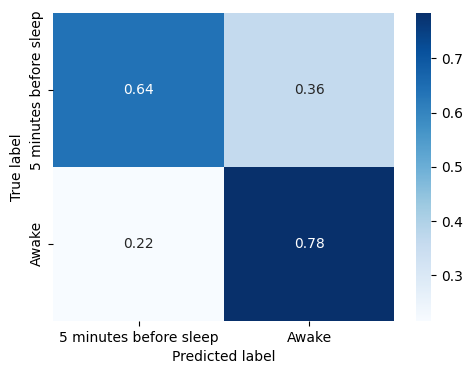

In [56]:
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create a balanced bagging classifier
bbc = BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, bbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])

bbc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(bbc, X_train_5)



## Try Easy Ensemble Classifier

CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.7357237715803453
Overall f1-score of fold 1:  0.7592705377397604
                        precision    recall  f1-score   support

5 minutes before sleep       0.42      0.78      0.55      4284
                 Awake       0.93      0.72      0.81     16800

              accuracy                           0.74     21084
             macro avg       0.67      0.75      0.68     21084
          weighted avg       0.83      0.74      0.76     21084

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7499051413394043
Overall f1-score of fold 2:  0.7699004383818284
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.73      0.54      4284
                 Awake       0.92      0.76      0.83     16800

              accuracy                           0.75     21084
             macro avg       0.67      0.74      0.69     21084
      

EasyEnsembleClassifier(n_estimators=30, random_state=42,
                       sampling_strategy='all')

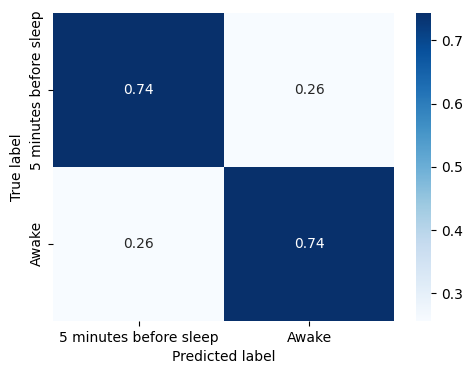

In [57]:
from imblearn.ensemble import EasyEnsembleClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create an easy ensemble  classifier
esc = EasyEnsembleClassifier(n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, esc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


esc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(esc, X_train_5)

## Try RUSBoost Classifier




CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.47917852399924116
Overall f1-score of fold 1:  0.5058928288207002
                        precision    recall  f1-score   support

5 minutes before sleep       0.27      0.92      0.42      4284
                 Awake       0.95      0.37      0.53     16800

              accuracy                           0.48     21084
             macro avg       0.61      0.65      0.47     21084
          weighted avg       0.81      0.48      0.51     21084

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7482451147789794
Overall f1-score of fold 2:  0.7691852845115592
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.75      0.55      4284
                 Awake       0.92      0.75      0.83     16800

              accuracy                           0.75     21084
             macro avg       0.68      0.75      0.69     21084
     

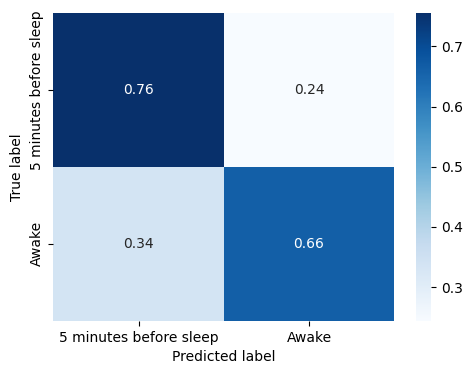

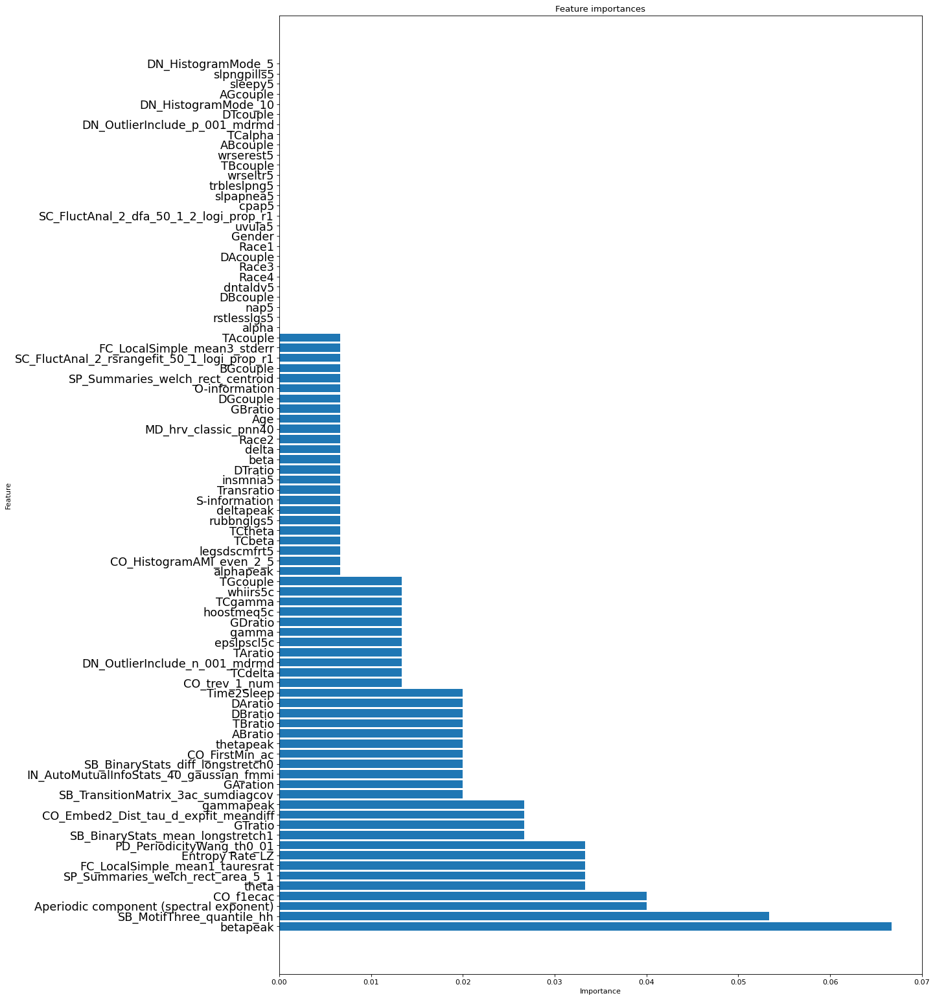

In [58]:
from imblearn.ensemble import RUSBoostClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
rusbc = RUSBoostClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, rusbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


rusbc.fit(X_train_5, y_train_5)

importances, indices, names = plot_feature_importances(rusbc, X_train_5)

# Do it for 5 minutes prior to sleep and 15-30 minutes prior to sleep onset 

In [59]:

# Try classification on 5 minutes before sleep and 20+ minutes before sleep
mydata_normalised_preprocessed_one_hot_5_15 = mydata_normalised_preprocessed_one_hot[(mydata_normalised_preprocessed_one_hot['Label'] <= 5) | (mydata_normalised_preprocessed_one_hot['Label'] >= 15)].copy()

# Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '20+ minutes before sleep' in the other case

mydata_normalised_preprocessed_one_hot_5_15['Label'] = np.where(mydata_normalised_preprocessed_one_hot_5_15['Label'] <= 5, '5 minutes before sleep', 'Awake')


CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.7862473347547975
Overall f1-score of fold 1:  0.7964095127484535
                        precision    recall  f1-score   support

5 minutes before sleep       0.56      0.78      0.65      4284
                 Awake       0.91      0.79      0.85     12600

              accuracy                           0.79     16884
             macro avg       0.74      0.79      0.75     16884
          weighted avg       0.82      0.79      0.80     16884

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7631485429992892
Overall f1-score of fold 2:  0.7758934307481586
                        precision    recall  f1-score   support

5 minutes before sleep       0.52      0.79      0.63      4284
                 Awake       0.91      0.76      0.83     12600

              accuracy                           0.76     16884
             macro avg       0.72      0.77      0.73     16884
      

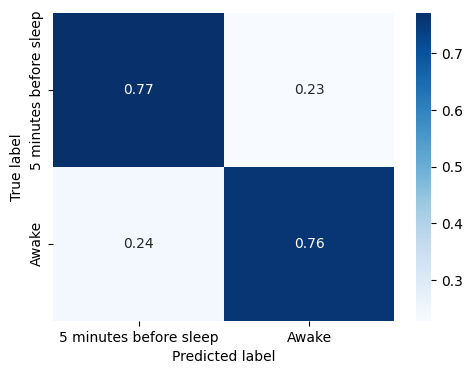

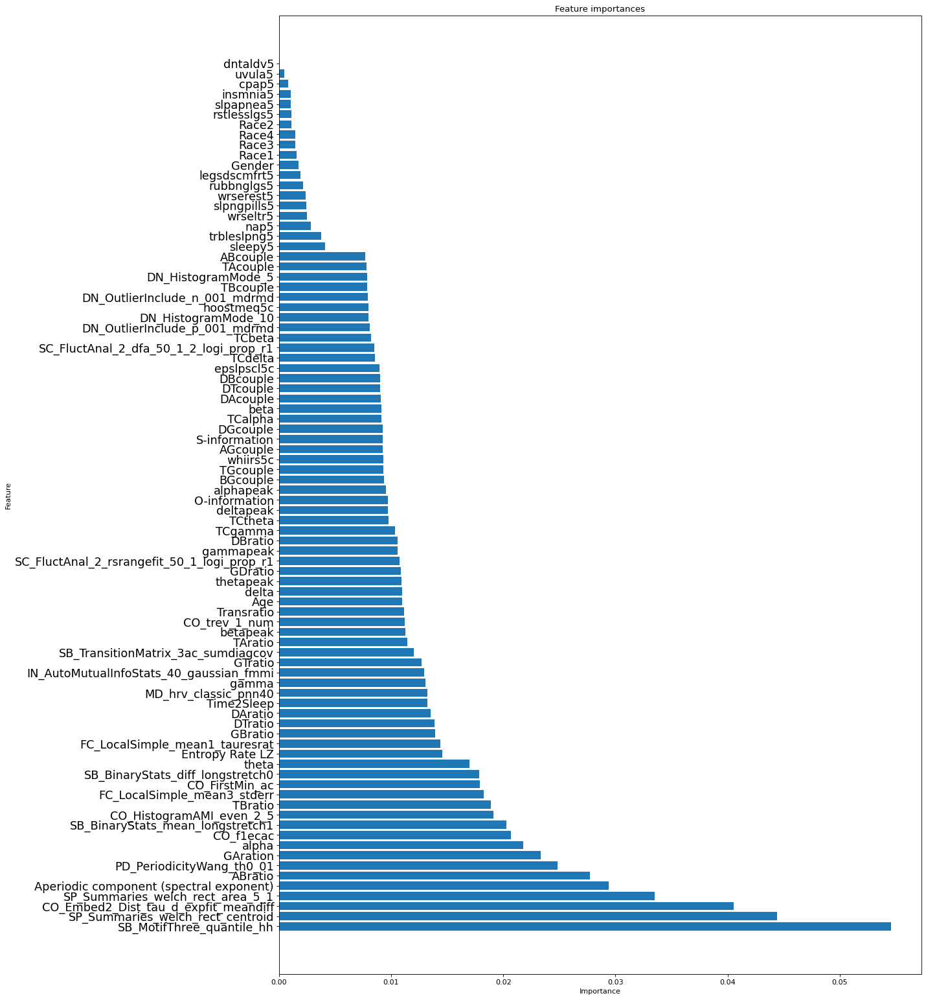

In [60]:
# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_15, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
brfc = BalancedRandomForestClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, brfc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


brfc.fit(X_train_5, y_train_5)

importances, indices, names = plot_feature_importances(brfc, X_train_5)

CROSS-VALIDATION
-------------- Fold number 1/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 1:  0.756260671599317
Overall f1-score of fold 1:  0.7723015969972129
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.65      0.52      4284
                 Awake       0.90      0.78      0.84     16800

              accuracy                           0.76     21084
             macro avg       0.67      0.72      0.68     21084
          weighted avg       0.80      0.76      0.77     21084

-------------- Fold number 2/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 2:  0.7511857332574464
Overall f1-score of fold 2:  0.7690734377689757
                        precision    recall  f1-score   support

5 minutes before sleep       0.43      0.67      0.52      4284
                 Awake       0.90      0.77      0.83     16800

              accuracy                           0.75     21084
             macro avg       0.67      0.72      0.68     21084
          weighted avg       0.81      0.75      0.77     21084

-------------- Fold number 3/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 3:  0.7502845759817871
Overall f1-score of fold 3:  0.7655358194656499
                        precision    recall  f1-score   support

5 minutes before sleep       0.42      0.61      0.50      4284
                 Awake       0.89      0.79      0.83     16800

              accuracy                           0.75     21084
             macro avg       0.65      0.70      0.67     21084
          weighted avg       0.79      0.75      0.77     21084

-------------- Fold number 4/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 4:  0.7732878011762474
Overall f1-score of fold 4:  0.7854686502823397
                        precision    recall  f1-score   support

5 minutes before sleep       0.46      0.63      0.53      4284
                 Awake       0.90      0.81      0.85     16800

              accuracy                           0.77     21084
             macro avg       0.68      0.72      0.69     21084
          weighted avg       0.81      0.77      0.79     21084

-------------- Fold number 5/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 5:  0.7607641722267556
Overall f1-score of fold 5:  0.7779684411172212
                        precision    recall  f1-score   support

5 minutes before sleep       0.44      0.70      0.54      4233
                 Awake       0.91      0.78      0.84     16600

              accuracy                           0.76     20833
             macro avg       0.68      0.74      0.69     20833
          weighted avg       0.81      0.76      0.78     20833

Accuracy: 0.758350844830701
                        precision    recall  f1-score   support

5 minutes before sleep       0.44      0.65      0.52     21369
                 Awake       0.90      0.79      0.84     83800

              accuracy                           0.76    105169
             macro avg       0.67      0.72      0.68    105169
          weighted avg       0.80      0.76      0.77    105169



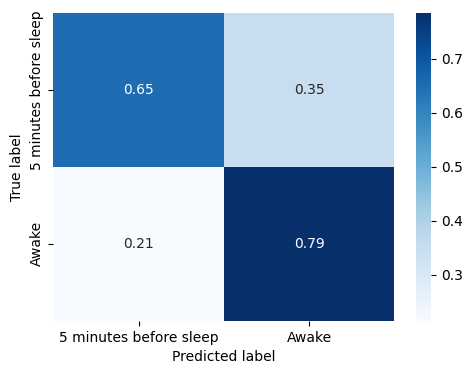

In [61]:
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create a balanced bagging classifier
bbc = BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, bbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])

#bbc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(bbc, X_train_5)

CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.7418895845190666
Overall f1-score of fold 1:  0.7635412752935334
                        precision    recall  f1-score   support

5 minutes before sleep       0.42      0.74      0.54      4284
                 Awake       0.92      0.74      0.82     16800

              accuracy                           0.74     21084
             macro avg       0.67      0.74      0.68     21084
          weighted avg       0.82      0.74      0.76     21084

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7618099032441662
Overall f1-score of fold 2:  0.7800096407318353
                        precision    recall  f1-score   support

5 minutes before sleep       0.45      0.73      0.56      4284
                 Awake       0.92      0.77      0.84     16800

              accuracy                           0.76     21084
             macro avg       0.68      0.75      0.70     21084
      

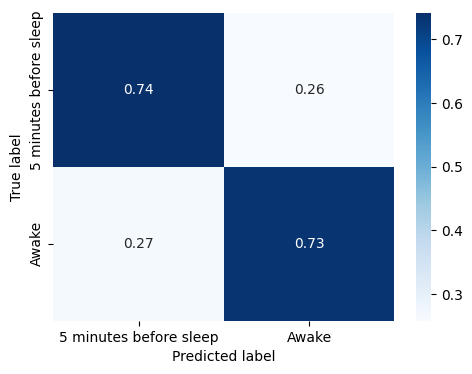

In [62]:
from imblearn.ensemble import EasyEnsembleClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create an easy ensemble  classifier
esc = EasyEnsembleClassifier(n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, esc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


#esc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(esc, X_train_5)

CROSS-VALIDATION
-------------- Fold number 1/5 --------------


Accuracy of fold 1:  0.7202143805729463
Overall f1-score of fold 1:  0.7444062068781989
                        precision    recall  f1-score   support

5 minutes before sleep       0.40      0.72      0.51      4284
                 Awake       0.91      0.72      0.80     16800

              accuracy                           0.72     21084
             macro avg       0.65      0.72      0.66     21084
          weighted avg       0.80      0.72      0.74     21084

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.7208783911971163
Overall f1-score of fold 2:  0.7449504973704903
                        precision    recall  f1-score   support

5 minutes before sleep       0.40      0.71      0.51      4284
                 Awake       0.91      0.72      0.80     16800

              accuracy                           0.72     21084
             macro avg       0.65      0.72      0.66     21084
          weighted avg       0.80      0.72      0.74     21084

----

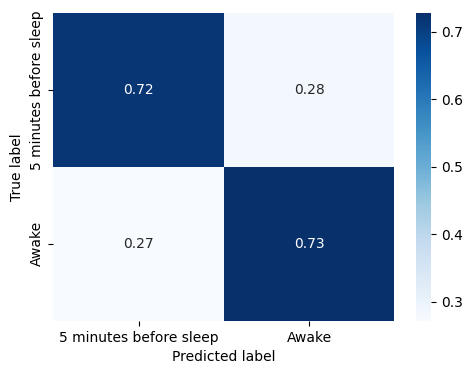

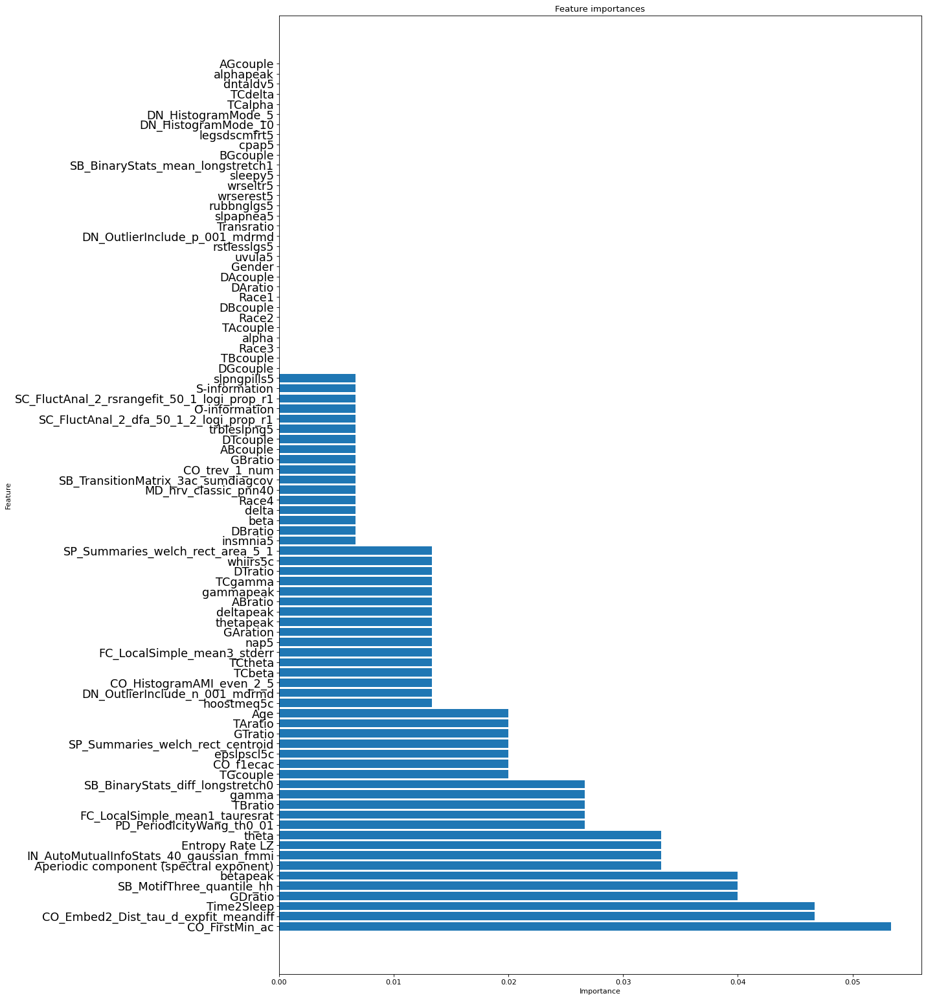

In [63]:
from imblearn.ensemble import RUSBoostClassifier

# Split test,  and training sets
X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
rusbc = RUSBoostClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_5_10, actuals_cv_class_5_10 = cross_validation_group(X_train_5, y_train_5, sbj_train_set_5, rusbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_5_10, predictions_cv_class_5_10, index = ['5 minutes before sleep', 'Awake'], columns = ['5 minutes before sleep', 'Awake'])


#rusbc.fit(X_train_5, y_train_5)

importances, indices, names = plot_feature_importances(rusbc, X_train_5)

# Try it on 10 minutes prior to sleep onset and 10-30 minutes prior to sleep onset

In [64]:

# Try classification on 5 minutes before sleep and 20+ minutes before sleep
mydata_normalised_preprocessed_one_hot_10_10 = mydata_normalised_preprocessed_one_hot[(mydata_normalised_preprocessed_one_hot['Label'] < 10) | (mydata_normalised_preprocessed_one_hot['Label'] >= 10)].copy()

# Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '20+ minutes before sleep' in the other case

mydata_normalised_preprocessed_one_hot_10_10['Label'] = np.where(mydata_normalised_preprocessed_one_hot_10_10['Label'] < 10, '10 minutes before sleep', 'Awake')


## Balanced Random Forest Classifier

CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.6942857142857143
Overall f1-score of fold 1:  0.701894493895175
                         precision    recall  f1-score   support

10 minutes before sleep       0.53      0.69      0.60      8400
                  Awake       0.82      0.69      0.75     16800

               accuracy                           0.69     25200
              macro avg       0.68      0.69      0.68     25200
           weighted avg       0.72      0.69      0.70     25200

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.6938095238095238
Overall f1-score of fold 2:  0.7009444560604918
                         precision    recall  f1-score   support

10 minutes before sleep       0.53      0.68      0.60      8400
                  Awake       0.81      0.70      0.75     16800

               accuracy                           0.69     25200
              macro avg       0.67      0.69      0.67     25

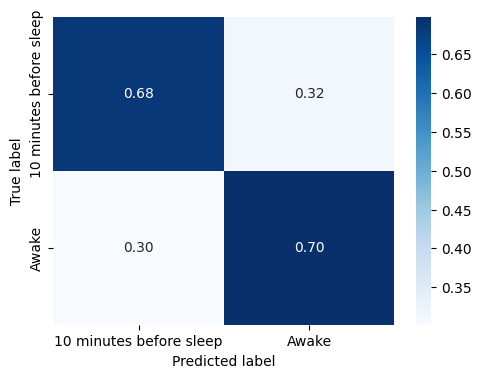

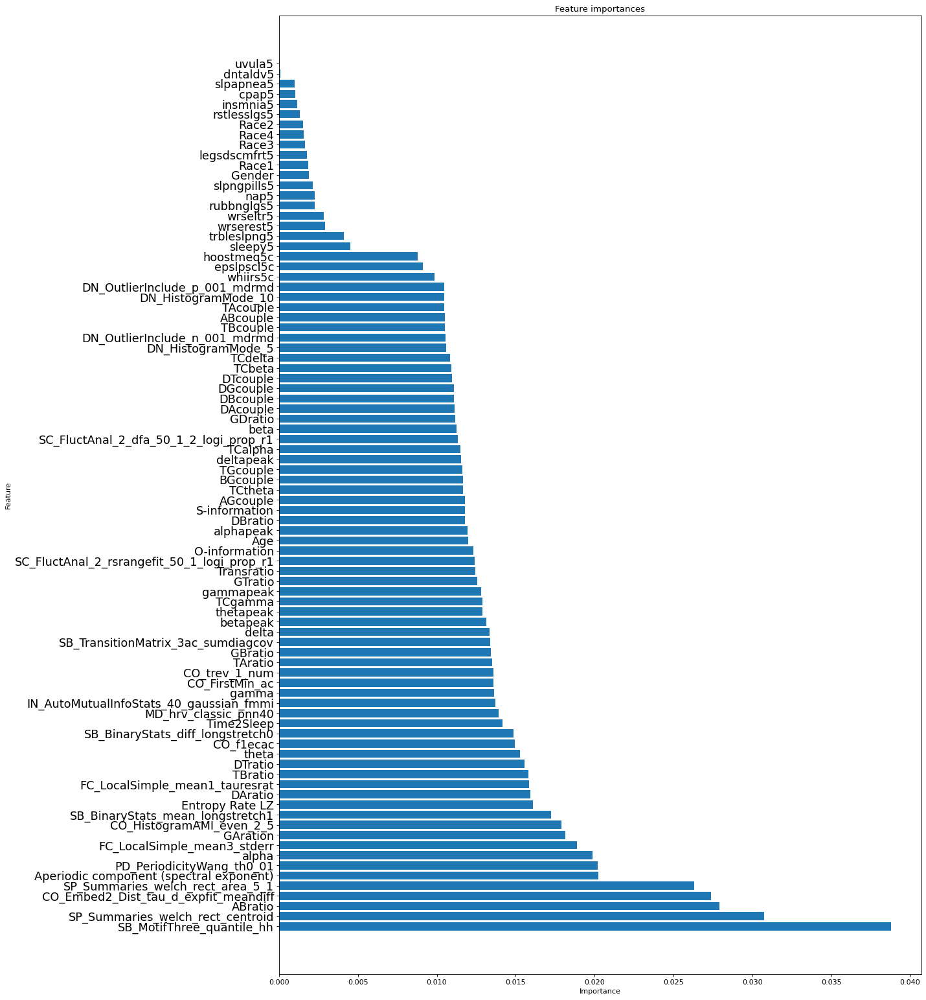

In [65]:
# # Split test,  and training sets
X_train_10, y_train_10, X_test_10, y_test_10, sbj_train_set_10, sbj_test_set_10 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_10_10, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
brfc = BalancedRandomForestClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_10_10, actuals_cv_class_10_10 = cross_validation_group(X_train_10, y_train_10, sbj_train_set_10, brfc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_10_10, predictions_cv_class_10_10, index = ['10 minutes before sleep', 'Awake'], columns = ['10 minutes before sleep', 'Awake'])


brfc.fit(X_train_10, y_train_10)

importances, indices, names = plot_feature_importances(brfc, X_train_10)

## Balanced Bagging Classifier

CROSS-VALIDATION
-------------- Fold number 1/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 1:  0.6545238095238095
Overall f1-score of fold 1:  0.6628740152561414
                         precision    recall  f1-score   support

10 minutes before sleep       0.49      0.63      0.55      8400
                  Awake       0.78      0.67      0.72     16800

               accuracy                           0.65     25200
              macro avg       0.63      0.65      0.63     25200
           weighted avg       0.68      0.65      0.66     25200

-------------- Fold number 2/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 2:  0.6909126984126984
Overall f1-score of fold 2:  0.6962683704478106
                         precision    recall  f1-score   support

10 minutes before sleep       0.53      0.62      0.57      8400
                  Awake       0.79      0.72      0.76     16800

               accuracy                           0.69     25200
              macro avg       0.66      0.67      0.67     25200
           weighted avg       0.71      0.69      0.70     25200

-------------- Fold number 3/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 3:  0.6839285714285714
Overall f1-score of fold 3:  0.687290151014834
                         precision    recall  f1-score   support

10 minutes before sleep       0.52      0.57      0.55      8400
                  Awake       0.78      0.74      0.76     16800

               accuracy                           0.68     25200
              macro avg       0.65      0.66      0.65     25200
           weighted avg       0.69      0.68      0.69     25200

-------------- Fold number 4/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 4:  0.7042063492063492
Overall f1-score of fold 4:  0.7079911024354796
                         precision    recall  f1-score   support

10 minutes before sleep       0.55      0.62      0.58      8400
                  Awake       0.80      0.75      0.77     16800

               accuracy                           0.70     25200
              macro avg       0.67      0.68      0.68     25200
           weighted avg       0.71      0.70      0.71     25200

-------------- Fold number 5/5 --------------


/usr/local/Caskroom/miniforge/base/envs/myenv/lib/python3.11/site-packages/imblearn/ensemble/_bagging.py:362: FutureWarning: `base_estimator` was renamed to `estimator` in version 0.10 and will be removed in 0.12.
  warnings.warn(


Accuracy of fold 5:  0.685863453815261
Overall f1-score of fold 5:  0.6889857519608911
                         precision    recall  f1-score   support

10 minutes before sleep       0.53      0.57      0.55      8300
                  Awake       0.78      0.74      0.76     16600

               accuracy                           0.69     24900
              macro avg       0.65      0.66      0.65     24900
           weighted avg       0.69      0.69      0.69     24900

Accuracy: 0.6838822593476531
                         precision    recall  f1-score   support

10 minutes before sleep       0.52      0.60      0.56     41900
                  Awake       0.78      0.72      0.75     83800

               accuracy                           0.68    125700
              macro avg       0.65      0.66      0.66    125700
           weighted avg       0.70      0.68      0.69    125700



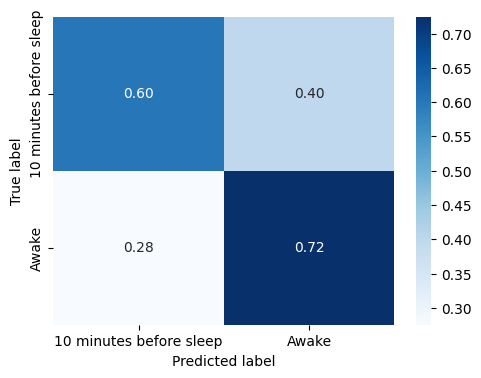

In [66]:
from imblearn.ensemble import BalancedBaggingClassifier
from sklearn.tree import DecisionTreeClassifier

# Split test,  and training sets
X_train_10, y_train_10, X_test_10, y_test_10, sbj_train_set_10, sbj_test_set_10 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_10_10, test_size = 0.2, random_seed = 42)

# Create a balanced bagging classifier
bbc = BalancedBaggingClassifier(base_estimator=DecisionTreeClassifier(), n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_10_10, actuals_cv_class_10_10 = cross_validation_group(X_train_10, y_train_10, sbj_train_set_10, bbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_10_10, predictions_cv_class_10_10, index = ['10 minutes before sleep', 'Awake'], columns = ['10 minutes before sleep', 'Awake'])

#bbc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(bbc, X_train_5)

## Easy Ensemble Classifier

In [67]:
from imblearn.ensemble import EasyEnsembleClassifier

# Split test,  and training sets
#X_train_5, y_train_5, X_test_5, y_test_5, sbj_train_set_5, sbj_test_set_5 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_5_10, test_size = 0.2, random_seed = 42)

# Create an easy ensemble  classifier
esc = EasyEnsembleClassifier(n_estimators=30, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_10_10, actuals_cv_class_10_10 = cross_validation_group(X_train_10, y_train_10, sbj_train_set_10, esc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_10_10, predictions_cv_class_10_10, index = ['10 minutes before sleep', 'Awake'], columns = ['10 minutes before sleep', 'Awake'])


#esc.fit(X_train_5, y_train_5)

#importances, indices, names = plot_feature_importances(esc, X_train_5)

CROSS-VALIDATION
-------------- Fold number 1/5 --------------


Accuracy of fold 1:  0.661547619047619
Overall f1-score of fold 1:  0.6711444934831929
                         precision    recall  f1-score   support

10 minutes before sleep       0.49      0.71      0.58      8400
                  Awake       0.82      0.64      0.71     16800

               accuracy                           0.66     25200
              macro avg       0.66      0.67      0.65     25200
           weighted avg       0.71      0.66      0.67     25200

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.6892063492063492
Overall f1-score of fold 2:  0.6966531911282524
                         precision    recall  f1-score   support

10 minutes before sleep       0.53      0.68      0.59      8400
                  Awake       0.81      0.70      0.75     16800

               accuracy                           0.69     25200
              macro avg       0.67      0.69      0.67     25200
           weighted avg       0.72      0.69      0.70     

## RUSBoost Classifier


CROSS-VALIDATION
-------------- Fold number 1/5 --------------
Accuracy of fold 1:  0.6064607882974401
Overall f1-score of fold 1:  0.6061587478915301
                         precision    recall  f1-score   support

10 minutes before sleep       0.62      0.58      0.60      2497
                  Awake       0.59      0.64      0.61      2425

               accuracy                           0.61      4922
              macro avg       0.61      0.61      0.61      4922
           weighted avg       0.61      0.61      0.61      4922

-------------- Fold number 2/5 --------------
Accuracy of fold 2:  0.6066639577407558
Overall f1-score of fold 2:  0.6068134545883739
                         precision    recall  f1-score   support

10 minutes before sleep       0.63      0.62      0.63      2613
                  Awake       0.58      0.59      0.58      2309

               accuracy                           0.61      4922
              macro avg       0.61      0.61      0.61      

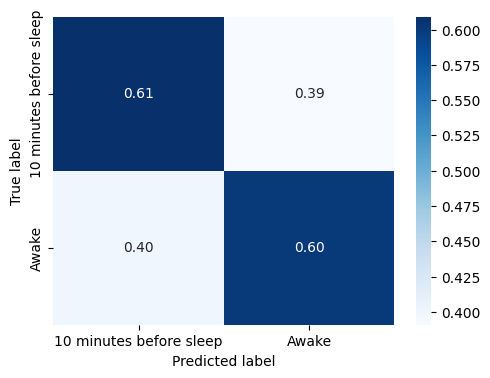

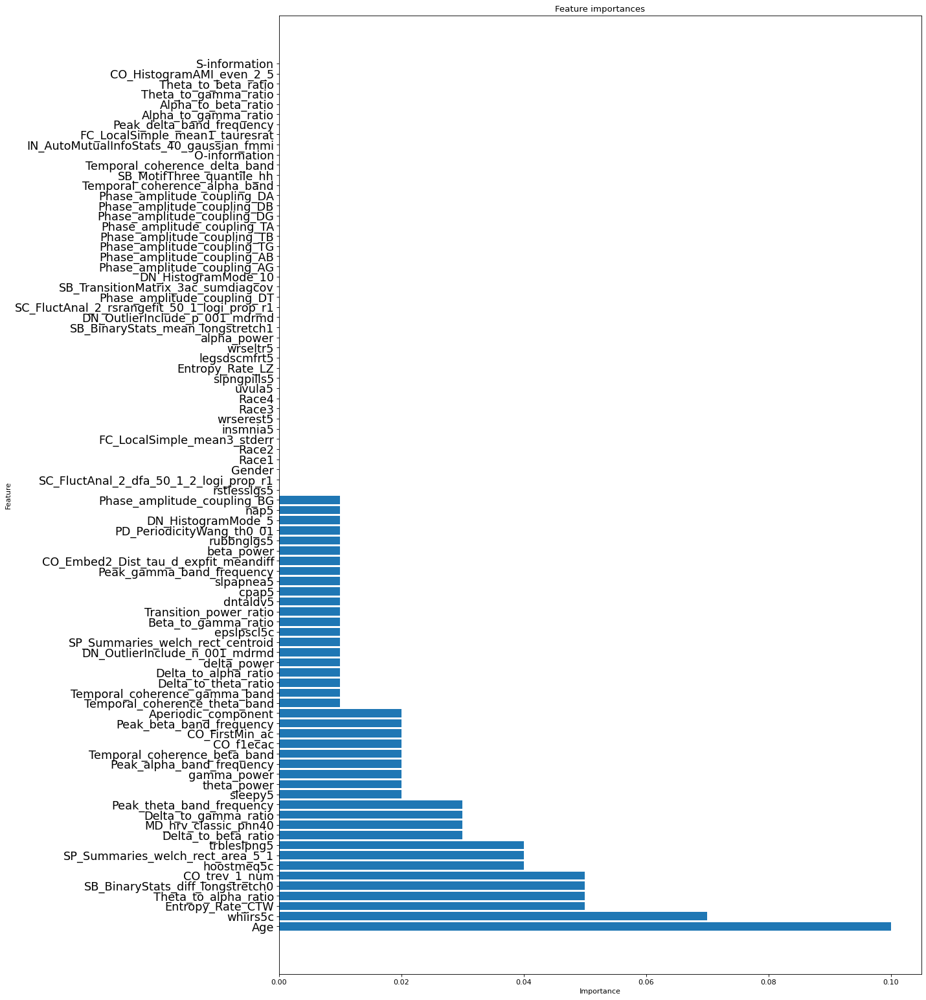

In [ ]:
from imblearn.ensemble import RUSBoostClassifier

# Split test,  and training sets
X_train_10, y_train_10, X_test_10, y_test_10, sbj_train_set_10, sbj_test_set_10 = train_test_split_sbjs(mydata_normalised_preprocessed_one_hot_10_10, test_size = 0.2, random_seed = 42)

# Create a random forest classifier
rusbc = RUSBoostClassifier(n_estimators=100, random_state=42, sampling_strategy='all', replacement=False)

print('CROSS-VALIDATION')

# Perform cross-validation
predictions_cv_class_10_10, actuals_cv_class_10_10 = cross_validation_group(X_train_10, y_train_10, sbj_train_set_10, rusbc, n_splits=5, ifresample = False)

# Evaluate the predictions made during cross-validation
evaluate_classification(actuals_cv_class_10_10, predictions_cv_class_10_10, index = ['10 minutes before sleep', 'Awake'], columns = ['10 minutes before sleep', 'Awake'])


#rusbc.fit(X_train_5, y_train_5)

importances, indices, names = plot_feature_importances(rusbc, X_train_10)

# Test the most optimal model -> Balanced Random Forest Classifier


## Define the helper functions

In [5]:

def get_timeline(mydata_no_nan):
 
    # assert that the data has no NaNs
    assert mydata_no_nan.isnull().sum().sum() == 0, 'There are NaNs in the data'
    

    # Create X and y from dataframes to use in scikit-learn (drop Label, SleepStage, Sbj_ID and ifCleanOnset columns)
    X_all = mydata_no_nan.drop(['Label', 'Old_label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_all = mydata_no_nan['Label']
    y_old_all = mydata_no_nan['Old_label']
    y_sleepstage_all = mydata_no_nan['SleepStage']

    

    return X_all, y_all, y_old_all, y_sleepstage_all

In [7]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import pandas as pd
import os
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix, 
                             roc_curve, roc_auc_score, auc)
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import f1_score

def evaluate_classification(true_labels, predictions, prediction_probabilities,
                            index=['10 minutes before sleep', 'Awake'], 
                            columns=['10 minutes before sleep', 'Awake'], 
                            save_path='confusion_matrix.png', ifsaveplots = False, 
                            output_path=None, iftest = False, ifplot = True, classes = None, ifvocal = True):
    
    # Evaluate the performance of the model
    accuracy = accuracy_score(true_labels, predictions)
    if iftest:
        if ifvocal:
            print(f'Accuracy: {accuracy}')

    # Classification report 
    report = classification_report(true_labels, predictions)
    if iftest:
        if ifvocal:
            print(report)
    
    # Decide on the filename based on iftest
    report_filename = 'test_classification_report.txt' if iftest else 'crossval_classification_report.txt'
    
    # Dictionary to store all metrics
    metrics_dict = {}
    metrics_dict['accuracy'] = accuracy
    # Classification report 
    true_labels_report = true_labels != 'Awake'
    true_labels_report = true_labels_report.astype(int)

    predictions_report = predictions != 'Awake'
    predictions_report = predictions_report.astype(int)

    precision, recall, _, _ = precision_recall_fscore_support(true_labels_report, predictions_report, average='binary')
    f1_weighted = f1_score(true_labels_report, predictions_report, average='weighted')
    f1_macro = f1_score(true_labels_report, predictions_report, average='macro')
    f1_pre_sleep = f1_score(true_labels_report, predictions_report, average=None)[0]
    f1_awake = f1_score(true_labels_report, predictions_report, average=None)[1]
    
    metrics_dict['precision'] = precision
    metrics_dict['recall'] = recall
    metrics_dict['f1_weighted'] = f1_weighted
    metrics_dict['f1_macro'] = f1_macro
    metrics_dict['f1_pre_sleep'] = f1_pre_sleep
    metrics_dict['f1_awake'] = f1_awake

    if iftest:
        if ifvocal:
            print('F1 pre-sleep: ', f1_pre_sleep)
            print('F1 awake: ', f1_awake)
    


    # Save classification report to a .txt file
    if ifsaveplots:
        if output_path:
            report_filename = os.path.join(output_path, report_filename)
        with open(report_filename, 'w') as f:
            f.write(report)
    # Plot the confusion matrix

    # Include the names of the classes in the confusion matrix
    cm = confusion_matrix(true_labels, predictions, normalize='true', labels=index)
    cm = pd.DataFrame(cm, index=index, columns=columns)

    # Rename the columns and rows to the names of the classes
    cm.index = columns
    plt.figure(figsize=(5.5, 4))
    sns.heatmap(cm, annot=True, fmt='.2f', cmap='Blues')

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.title('Confusion Matrix for times before sleep')
    
    if iftest:
        saving_prefix = 'test'
    else: 
        saving_prefix = 'crossval'

    save_path = f'{saving_prefix}_{save_path}'

    if ifsaveplots:
        if output_path:
            save_path = os.path.join(output_path, save_path)
        # Save the confusion matrix to a file
        plt.savefig(save_path)
    
    # Display the confusion matrix
    if ifplot:
        plt.show()
    plt.close()

    roc_path = f'{saving_prefix}_roc_curve.png'
    
    # ROC and AUC

    # if array is 2D
    if len(prediction_probabilities.shape) == 2:
        class_idx = np.where(classes != 'Awake')[0][0]
        prediction_probabilities = prediction_probabilities[:,class_idx]
    else:
        prediction_probabilities = prediction_probabilities.ravel()

    
    fpr, tpr, _ = roc_curve(true_labels_report, prediction_probabilities.ravel())
    roc_auc = auc(fpr, tpr)
    #metrics_dict['roc_curve'] = (fpr, tpr)
    metrics_dict['auc'] = roc_auc

    plt.figure(figsize=(7, 7))
    plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
    plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC)')
    plt.legend(loc="lower right")
    

    if ifsaveplots:
        if output_path:
            roc_path = os.path.join(output_path, roc_path)
        plt.savefig(roc_path)
    
    if ifplot:
        plt.show()
    plt.close()
    
    return metrics_dict
    

In [8]:
import numpy as np
import matplotlib.pyplot as plt
import os

def preprocess_data(y_pred, y_true, timeline, sleep_stage):
    y_pred = np.array(y_pred)
    y_true = np.array(y_true)
    timeline = np.array(timeline)
    sleep_stage = np.array(sleep_stage)
    timeline = np.round(timeline, 1)
    return y_pred, y_true, timeline, sleep_stage

def get_indices_for_unique_values(timeline):
    unique_values = np.unique(timeline)
    unique_values_sorted = np.sort(unique_values)
    indices = {}
    for value in unique_values:
        indices[value] = np.where(timeline == value)[0]
    return dict(sorted(indices.items())), unique_values_sorted

def update_indices_with_missing_values(indices, rnn_window):
    timegrid = np.arange(0, 30.1 - rnn_window, 0.1)
    timegrid = np.round(timegrid, 1)
    missing_values = np.setdiff1d(timegrid, list(indices.keys()))
    for value in missing_values:
        indices[value] = np.nan
    return dict(sorted(indices.items())), timegrid

def sort_predictions_by_time(y_pred, indices, timegrid):
    y_pred_sorted = [np.mean(y_pred[indices[value]]) if not np.isnan(indices[value]).any() else np.nan for value in timegrid]
    y_pred_std = [np.std(y_pred[indices[value]]) if not np.isnan(indices[value]).any() else np.nan for value in timegrid]
    return y_pred_sorted, y_pred_std

def downsample_data(data, window_for_averaging):
    return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]

def plot_data(y_pred_mean, y_pred_std, 
             sleep_stage_mean, sleep_stage_std,
              timegrid, window_for_averaging, 
              rnn_window, pre_sleep_window=None, 
              awake_window=None, ifsaveplots=False,
              output_path=None, ifplot = False,
              ifsubjecttest = False):
    
    # convert to numpy arrays to avoid errors
    y_pred_mean = np.array(y_pred_mean)
    y_pred_std = np.array(y_pred_std)
    sleep_stage_mean = np.array(sleep_stage_mean)
    sleep_stage_std = np.array(sleep_stage_std)


    if ifsubjecttest:
        label_sleep_st ='Sleep Stages'
        label_proba = 'Predicted probability of pre-sleep onset'
    else:
        label_sleep_st  = 'Mean of Sleep Stages'
        label_proba = 'Mean of predicted probability of pre-sleep onset'


    filename=f"sleep_probabilities_averaged_over_{window_for_averaging}.jpg"
    plt.figure(figsize=(20,10))
    plt.xlabel('Minutes', fontsize=14)
    xticks = np.arange(0, len(y_pred_mean), 10//window_for_averaging)
    plt.xticks(xticks, timegrid[xticks*window_for_averaging], fontsize=12)
    plt.yticks(fontsize=12)

    

    # plot the mean predictions              
    plt.plot(y_pred_mean, label=label_proba, color='blue')
    # plot the average sleep stage
    plt.plot(sleep_stage_mean, label=label_sleep_st, color='purple', linestyle='--')
    plt.hlines(0.5, linestyle='--', color='r', label='Threshold for classifying as pre-sleep onset', xmin=0, xmax=len(y_pred_mean))
    
    if awake_window is not None:
        awake_window_probas = int((awake_window - rnn_window)* 10//window_for_averaging) 
        plt.axvspan(awake_window_probas, len(y_pred_mean), facecolor='g', alpha=0.2, label='Awake window')
        
    if pre_sleep_window is not None:
        pre_sleep_window_probas = int((pre_sleep_window - rnn_window) * 10//window_for_averaging) 
        plt.axvspan(pre_sleep_window_probas, 0, facecolor='r', alpha=0.2, label='Pre-sleep window')
        
    plt.ylim(-0.1, 1.1)
    plt.legend(loc='upper right', fontsize=12)
    if ifsaveplots:
        if output_path:
            filename = os.path.join(output_path, filename)
        plt.savefig(filename, format='jpg', dpi=300)
    if ifplot:
        plt.show()
    plt.close()


    filename=f"with_std_sleep_probabilities_averaged_over_{window_for_averaging}.jpg"
    plt.figure(figsize=(20,10))
    plt.xlabel('Minutes', fontsize=14)
    xticks = np.arange(0, len(y_pred_mean), 10//window_for_averaging)
    plt.xticks(xticks, timegrid[xticks*window_for_averaging], fontsize=12)
    plt.yticks(fontsize=12)

    # plot the mean predictions              
    plt.plot(y_pred_mean, label= label_proba, color='blue')
    # plot the standard deviation of predictions as a shaded area
    plt.fill_between(np.arange(len(y_pred_mean)), y_pred_mean - y_pred_std, y_pred_mean + y_pred_std, alpha=0.1, color='blue')
    # plot the average sleep stage
   
    plt.plot(sleep_stage_mean, label = label_sleep_st, color='purple', linestyle='--')
    # plot the standard deviation of sleep stage as a shaded area
    plt.fill_between(np.arange(len(sleep_stage_mean)), sleep_stage_mean - sleep_stage_std, sleep_stage_mean + sleep_stage_std, alpha=0.1, color='purple')
    plt.hlines(0.5, linestyle='--', color='r', label='Threshold for classifying as pre-sleep onset', xmin=0, xmax=len(y_pred_mean))
    
    if awake_window is not None:
        awake_window_probas = int((awake_window - rnn_window)* 10//window_for_averaging) 
        plt.axvspan(awake_window_probas, len(y_pred_mean), facecolor='g', alpha=0.2, label='Awake window')
        
    if pre_sleep_window is not None:
        pre_sleep_window_probas = int((pre_sleep_window - rnn_window) * 10//window_for_averaging) 
        plt.axvspan(pre_sleep_window_probas, 0, facecolor='r', alpha=0.2, label='Pre-sleep window')
        
    plt.ylim(-0.1, 1.1)
    plt.legend(loc='upper right', fontsize=12)
    if ifsaveplots:
        if output_path:
            filename = os.path.join(output_path, filename)
        plt.savefig(filename, format='jpg', dpi=300)
    if ifplot:
        plt.show()
    plt.close()


def calculate_metrics(y_pred, y_true, timegrid, indices):
    correct = y_true == y_pred

    y_pred_binarised = np.where(y_pred != 'Awake', 1, 0)
    y_true_binarised = np.where(y_true != 'Awake', 1, 0)

    accuracies = [np.mean(correct[indices[value]]) if not np.isnan(indices[value]).any() else np.nan for value in timegrid]
    
    prediction_dict_by_time = {value: y_pred_binarised[indices[value]] if indices[value] is not np.nan else np.nan for value in timegrid}
    true_values_dict_by_time = {value: y_true_binarised[indices[value]] if indices[value] is not np.nan else np.nan for value in timegrid}
    
    tp = {value: np.sum(np.logical_and(prediction_dict_by_time[value] == 1, true_values_dict_by_time[value] == 1))
          if not np.isnan(indices[value]).any() else np.nan for value in timegrid}
    tn = {value: np.sum(np.logical_and(prediction_dict_by_time[value] == 0, true_values_dict_by_time[value] == 0))
          if not np.isnan(indices[value]).any() else np.nan for value in timegrid}
    fp = {value: np.sum(np.logical_and(prediction_dict_by_time[value] == 1, true_values_dict_by_time[value] == 0))
          if not np.isnan(indices[value]).any() else np.nan for value in timegrid}
    fn = {value: np.sum(np.logical_and(prediction_dict_by_time[value] == 0, true_values_dict_by_time[value] == 1))
          if not np.isnan(indices[value]).any() else np.nan for value in timegrid}

    recall = [tp[value] / (tp[value] + fn[value]) if (tp[value] + fn[value]) != 0 else 0 for value in timegrid]
    precision = [tp[value] / (tp[value] + fp[value]) if (tp[value] + fp[value]) != 0 else 0 for value in timegrid]
    f1 = [2 * (precision[i] * recall[i]) / (precision[i] + recall[i]) if precision[i] + recall[i] != 0 else np.nan for i in range(len(precision))]

    return accuracies, recall, precision, f1

def plot_metric(metric_values, metric_name, color, timegrid, window_for_averaging, rnn_window, 
                pre_sleep_window=None, awake_window=None, ifsaveplots=False, output_path=None,
                ifplot = False):
    
    plt.figure(figsize=(20,10))
    plt.xlabel('Minutes', fontsize=14)
    xticks = np.arange(0, len(metric_values), 10//window_for_averaging)
    plt.xticks(xticks, timegrid[xticks*window_for_averaging], fontsize=12)
    plt.yticks(fontsize=12)
    
    plt.plot(metric_values, label=metric_name, color=color)
    plt.hlines(0.5, linestyle='--', color='r', label='Threshold for classifying as pre-sleep onset', xmin=0, xmax=len(metric_values))
    
    if awake_window is not None:
        awake_window_probas = int((awake_window - rnn_window)* 10//window_for_averaging) 
        plt.axvspan(awake_window_probas, len(metric_values), facecolor='g', alpha=0.2, label='Awake window')
        
    if pre_sleep_window is not None:
        pre_sleep_window_probas = int((pre_sleep_window - rnn_window) * 10//window_for_averaging) 
        plt.axvspan(pre_sleep_window_probas, 0, facecolor='r', alpha=0.2, label='Pre-sleep window')
        
    plt.ylim(-0.1, 1.1)
    plt.legend(loc='upper right', fontsize=12)
    if ifsaveplots:
        filename = f"{metric_name}_metric_averaged_over_{window_for_averaging}.jpg"
        if output_path:
            filename = os.path.join(output_path, filename)
        plt.savefig(filename, format='jpg', dpi=300)
    
    if ifplot:
        plt.show()
    plt.close()


def plot_metrics(accuracies, recall, precision, f1, 
                 timegrid, window_for_averaging, rnn_window, 
                 pre_sleep_window=None, awake_window=None, 
                 ifsaveplots=False, output_path=None, ifplot = False):
    
    plot_metric(accuracies, 'Accuracy', 'blue', timegrid, window_for_averaging, rnn_window, 
                pre_sleep_window, awake_window, ifsaveplots, output_path, ifplot = ifplot)
    
    plot_metric(recall, 'Recall', 'green', timegrid, window_for_averaging, rnn_window, 
                pre_sleep_window, awake_window, ifsaveplots, output_path, ifplot = ifplot)
    
    plot_metric(precision, 'Precision', 'purple', timegrid, window_for_averaging, rnn_window, 
                pre_sleep_window, awake_window, ifsaveplots, output_path, ifplot = ifplot)
    
    plot_metric(f1, 'F1', 'red', timegrid, window_for_averaging, rnn_window, 
                pre_sleep_window, awake_window, ifsaveplots, output_path, ifplot = ifplot)

    



In [9]:
def check_accuracy_timeline(y_pred, y_true, timeline, sleep_stage, window_for_averaging=1, 
                            if_proba=False, classes=None, pre_sleep_window=None, 
                            awake_window=None, rnn_window=None, ifsaveplots=False, output_path=None,
                            ifplot = False, ifsubjecttest = False):
    y_pred, y_true, timeline, sleep_stage = preprocess_data(y_pred, y_true, timeline, sleep_stage)
    
    indices, unique_values_sorted = get_indices_for_unique_values(timeline)
    indices, timegrid = update_indices_with_missing_values(indices, rnn_window)
    
    if if_proba:
        if classes is not None:
            class_idx = np.where(classes != 'Awake')[0][0]
            

            y_pred = y_pred[:,class_idx]
        
        y_pred_mean, y_pred_std = sort_predictions_by_time(y_pred, indices, timegrid)
        sleep_stage_mean, sleep_stage_std = sort_predictions_by_time(sleep_stage, indices, timegrid)

        if window_for_averaging > 1:
            y_pred_mean = downsample_data(y_pred_mean, window_for_averaging)
            y_pred_std = downsample_data(y_pred_std, window_for_averaging)
            sleep_stage_mean= downsample_data(sleep_stage_mean, window_for_averaging)
            sleep_stage_std = downsample_data(sleep_stage_std, window_for_averaging)
            downsampled_timegrid = downsample_data(timegrid, window_for_averaging)
            

        plot_data(y_pred_mean, y_pred_std, sleep_stage_mean, sleep_stage_std,
                  timegrid, window_for_averaging, rnn_window, 
                  pre_sleep_window, awake_window, ifsaveplots, 
                  output_path, ifplot = ifplot, ifsubjecttest = ifsubjecttest)

        if window_for_averaging > 1:
            dict_pred_time = {downsampled_timegrid[i]: y_pred_mean[i] for i in range(len(y_pred_mean))}
            return dict_pred_time
        else:
            return y_pred_mean

    else:
        accuracies, recall, precision, f1 = calculate_metrics(y_pred, y_true, timegrid, indices)
        if window_for_averaging > 1:
            accuracies = downsample_data(accuracies, window_for_averaging)
            recall = downsample_data(recall, window_for_averaging)
            precision = downsample_data(precision, window_for_averaging)
            f1 = downsample_data(f1, window_for_averaging)

        
        plot_metrics(accuracies, recall, precision, f1, 
                     timegrid, window_for_averaging, rnn_window, 
                     pre_sleep_window, awake_window, ifsaveplots, 
                     output_path, ifplot = ifplot)
        
        
        return accuracies, recall, precision, f1
        


In [28]:
def evaluate_regression(predictions, y_test, ifsave = False, savepath = None, ifplot = False, iftest = False):

    # check if the predictions are in the correct format
   
    predictions = np.array(predictions)

    # check if the y_test is in the correct format
    
    y_test = np.array(y_test)

    errors = abs(y_test - predictions)
    mape = np.where(y_test != 0, 100 * (errors / y_test), 0)
    accuracy = 100 - np.mean(mape)
    mse = sklearn.metrics.mean_squared_error(y_test, predictions)
    rmse = np.sqrt(mse)
    r2 = sklearn.metrics.r2_score(y_test, predictions)
    squared_errors = np.square(y_test - predictions)
    weights = 1.0 /(abs(y_test) + 0.1)
    custom_mse = np.mean(weights * squared_errors)

    print('Mean Absolute Error:', round(np.mean(errors), 2))
    print('Accuracy:', round(accuracy, 2), '%.')
    print('Mean Squared Error:', round(mse, 2))
    print('Root Mean Squared Error:', round(rmse, 2))
    print('R2:', round(r2, 2))
    print('Custom MSE:', round(custom_mse, 2))

    


    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1)
    plt.scatter(y_test, predictions, alpha=0.2)
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Predicted time to sleep onset')
    plt.title('Actual vs Predicted time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_actual_vs_predicted.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_actual_vs_predicted.png'))
    if ifplot:
        plt.show()
    plt.close()

    residuals = y_test - predictions
    plt.scatter(y_test, residuals, alpha=0.2)
    plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1)
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Residuals')
    plt.title('Actual vs Residuals for predicted time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_actual_vs_residuals.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_actual_vs_residuals.png'))
    if ifplot:
        plt.show()
    plt.close()

    plt.hist(residuals)
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.title('Residuals distribution')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_residuals_distribution.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_residuals_distribution.png'))
    if ifplot:
        plt.show()
    plt.close()

    # for each actual, plot the mean residual 
    # round y_test to 0.1 decimal place
    y_test = np.round(y_test, 1)

    predictions_residuals_dict = {}
    for i in range(len(y_test)):
        if y_test[i] not in predictions_residuals_dict:
            predictions_residuals_dict[y_test[i]] = []
        predictions_residuals_dict[y_test[i]].append(residuals[i])
    
    # sort it in ascending order of keys
    predictions_residuals_dict = dict(sorted(predictions_residuals_dict.items()))


    actual_predictions_dict = {}
    for i in range(len(y_test)):
        if y_test[i] not in actual_predictions_dict:
            actual_predictions_dict[y_test[i]] = []
        actual_predictions_dict[y_test[i]].append(predictions[i])
    
    # sort it in ascending order of keys
    actual_predictions_dict = dict(sorted(actual_predictions_dict.items()))

    
    predictions_residuals_mean_dict = {}
    for key in predictions_residuals_dict:
        predictions_residuals_mean_dict[key] = np.mean(predictions_residuals_dict[key])
    
    # sort it in ascending order of keys
    predictions_residuals_mean_dict = dict(sorted(predictions_residuals_mean_dict.items()))


    residuals_std_dict = {}
    for key in predictions_residuals_dict:
        residuals_std_dict[key] = np.std(predictions_residuals_dict[key])
    # sort it in ascending order of keys
    residuals_std_dict = dict(sorted(residuals_std_dict.items()))

    
    actuals_predictions_mean_dict = {}
    for key in actual_predictions_dict:
        actuals_predictions_mean_dict[key] = np.mean(actual_predictions_dict[key])
    
    # sort it in ascending order of keys
    actuals_predictions_mean_dict = dict(sorted(actuals_predictions_mean_dict.items()))

    predictions_std_dict = {}
    for key in actual_predictions_dict:
        predictions_std_dict[key] = np.std(actual_predictions_dict[key])
    # sort it in ascending order of keys
    predictions_std_dict = dict(sorted(predictions_std_dict.items()))

    plt.plot(list(predictions_residuals_mean_dict.keys()), list(predictions_residuals_mean_dict.values()))
    # create std shading
    plt.fill_between(list(predictions_residuals_mean_dict.keys()),
                        np.array(list(predictions_residuals_mean_dict.values())) - np.array(list(residuals_std_dict.values())),
                        np.array(list(predictions_residuals_mean_dict.values())) + np.array(list(residuals_std_dict.values())),
                        alpha=0.2)
    # plot ideal line (x = 0)
    plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
    plt.legend(['Mean of residuals', 'STD of residuals', 'Ideal residuals line'])
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Residuals for this actual')
    plt.title('Mean residual of predictions for each actual time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_mean_residuals_across_time.png'))
        else:
            plt.savefig(os.path.join(savepath, 'crossval_mean_residuals_across_time.png'))
    if ifplot:
        plt.show()
    plt.close()

    plt.plot(list(actuals_predictions_mean_dict.keys()), list(actuals_predictions_mean_dict.values()))
    # create std shading
    plt.fill_between(list(actuals_predictions_mean_dict.keys()),
                        np.array(list(actuals_predictions_mean_dict.values())) - np.array(list(predictions_std_dict.values())),
                        np.array(list(actuals_predictions_mean_dict.values())) + np.array(list(predictions_std_dict.values())),
                        alpha=0.2)
    # plot ideal line (x = y)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')
    plt.legend(['Mean of predictions', 'STD of predictions', 'Ideal actual = prediction line (x = y)'])
    plt.xlabel('Actual time to sleep onset')
    plt.ylabel('Mean prediction for this actual')
    plt.title('Mean prediction for each actual time to sleep onset')
    if ifsave:
        if iftest:
            plt.savefig(os.path.join(savepath, 'test_mean_predictions_across_time.png'))
        else:
             plt.savefig(os.path.join(savepath, 'crossval_mean_predictions_across_time.png'))
    if ifplot:
        plt.show()
    plt.close()

    test_metrics = {'MAE': round(np.mean(errors), 2), 'Accuracy': round(accuracy, 2), 
    'MSE': round(mse, 2), 'RMSE': round(rmse, 2), 'R2': round(r2, 2), 'custom_MSE': round(custom_mse, 2)}
    return test_metrics

In [11]:
def select_random_participants(df, n_participants):
    """Selects a random sample of participants from the dataset.

    Args:
        df (pandas.DataFrame): The dataset.
        n_participants (int): The number of participants to select.

    Returns:
        pandas.DataFrame: A random sample of participants.
    """
    # Select a random sample of participants
    participants = df['Sbj_ID'].unique()
    selected_participants = np.random.choice(participants, n_participants, replace=False)

    # Filter the dataset
    df = df[df['Sbj_ID'].isin(selected_participants)].copy()

    return df, selected_participants

In [12]:
def test_on_random_participants(participants, data, model, random_seed, ifplot, output_path_new, index, brfc_classes, awake_window, pre_sleep_window): 
    
    """
    Test the model on a random subset of participants. 
    """
    # Set random seed

    # create a new folder for the results
    output_path_new = os.path.join(output_path_new, 'random_participants')
    if not os.path.exists(output_path_new):
        os.makedirs(output_path_new)
    
    # intialise empty dataframe to store results
    df_all = pd.DataFrame()

    
    participant_probas = {}
    participant_timeline = {}

    for sbj in data['Sbj_ID'].unique():
        # create a folder for each participant
        output_path_participant = os.path.join(output_path_new, str(sbj))
        if not os.path.exists(output_path_participant):
            os.makedirs(output_path_participant)


        participant_data = data[data['Sbj_ID'] == sbj].copy()
        y = participant_data['Label']
        timeline = participant_data['Old_label']
        sleep_stages = participant_data['SleepStage']
        X = participant_data.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep', 'Old_label'], axis=1)

        predictions = model.predict(X)
        prediction_probabilities = model.predict_proba(X)
        

        class_idx = np.where(brfc_classes != 'Awake')[0][0]
        prediction_probas_sleep =prediction_probabilities[:,class_idx]
        participant_probas[sbj] = prediction_probas_sleep
        participant_timeline[sbj] = timeline



        # get the accuracy of each timepoint
        if ifplot:
            print('Predict for participant: ', sbj)

            print('--------------------------------------Evaluate classificaiton ----------------------------------------')
        
        test_metrics = evaluate_classification(y, predictions, prediction_probabilities, index = index, iftest=True,
                                ifplot=ifplot, output_path=output_path_participant, ifsaveplots= True, classes = brfc_classes, ifvocal = False)
        
        df = pd.DataFrame(test_metrics, index = [sbj])
        df_all = pd.concat([df_all, df])
        if ifplot:
            print('------------------------------------------- No averaging ----------------------------------------')
            print('Accuracy')
            
        accuracies, precision, recall, f1 = check_accuracy_timeline(y_pred = predictions, y_true = y,
                                                                    timeline = timeline, sleep_stage = sleep_stages, 
                                                                    window_for_averaging=1, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                                    if_proba=False, classes=None, rnn_window = 0, 
                                                                    ifsaveplots=True, output_path=output_path_participant, ifplot = ifplot)
        if ifplot:
            print('Probability of sleep as predicted by the model')
        
        
        y_pred_sorted = check_accuracy_timeline(y_pred = prediction_probabilities, y_true = y,
                                                timeline = timeline, sleep_stage = sleep_stages, 
                                                window_for_averaging=1, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                if_proba=True, classes=brfc_classes, rnn_window = 0, 
                                                ifsaveplots=True, output_path=output_path_participant, ifplot = ifplot, ifsubjecttest = True)


        if ifplot:
            print('-------------------------------Averaging of accuracy over 30 seconds---------------------------------')
            print('Accuracy')
        accuracies, precision, recall, f1 = check_accuracy_timeline(y_pred = predictions, y_true = y,
                                                                    timeline = timeline, sleep_stage = sleep_stages, 
                                                                    window_for_averaging=5, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                                    if_proba=False, classes=None, rnn_window = 0, 
                                                                    ifsaveplots=True, output_path=output_path_participant, ifplot = ifplot)
        if ifplot:
            print('Probability of sleep as predicted by the model')
        
        
        y_pred_sorted = check_accuracy_timeline(y_pred = prediction_probabilities, y_true = y,
                                                timeline = timeline, sleep_stage = sleep_stages, 
                                                window_for_averaging=5, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                if_proba=True, classes=brfc_classes, rnn_window = 0, 
                                                ifsaveplots=True, output_path=output_path_participant, ifplot = ifplot, ifsubjecttest = True)

    df_all.to_csv(os.path.join(output_path_new, 'classification_results_random_participants.csv'))
    
    return participant_probas, participant_timeline

In [13]:
def test_reg_on_random_participants(participant_probas, participant_timeline, model, random_seed, ifplot, output_path_new, index, brfc_classes, awake_window, pre_sleep_window): 
    
    """
    Test the model on a random subset of participants. 
    """
    # Set random seed

    # create a new folder for the results
    output_path_new = os.path.join(output_path_new, 'random_participants')
    if not os.path.exists(output_path_new):
        os.makedirs(output_path_new)
    
    # intialise empty dataframe to store results
    df_all = pd.DataFrame()

    
    for sbj in list(participant_probas.keys()):
        # create a folder for each participant
        
        output_path_participant = os.path.join(output_path_new, str(sbj))
        if not os.path.exists(output_path_participant):
            os.makedirs(output_path_participant)

        y_test_timeline = participant_timeline[sbj]
        probas = participant_probas[sbj]

        # check if y_test_timeline and probas are the same length
        if len(y_test_timeline) != len(probas):
            error = 'y_test_timeline and probas are not the same length'

        if np.isnan(probas).any():
                    for i in range(len(probas)):
                        if np.isnan(probas[i]):
                            # omit the corresponding y_times2sleep
                            y_test_timeline.pop(i)
                            probas.pop(i)


        probas = np.array(probas).reshape(-1, 1)
        

        timeline_predicted = model.predict(probas)
       

        # get the accuracy of each timepoint
        if ifplot:
            print('Predict for participant: ', sbj)

            print('--------------------------------------Evaluate regression ----------------------------------------')
        
        test_metrics = evaluate_regression(timeline_predicted, y_test_timeline, iftest=True,
                                ifplot=ifplot, savepath =output_path_participant, ifsave= True)
        
        df = pd.DataFrame(test_metrics, index = [sbj])
        df_all = pd.concat([df_all, df])

    df_all.to_csv(os.path.join(output_path_new, 'regression_results_random_participants.csv'))
    
   

In [14]:
import matplotlib.pyplot as plt
import os

# Create a function for plotting the sorted feature importances in a long horizontal bar chart and increased font size

def plot_feature_importances(model, X, output_path, ifsaveplots = False, save_name = 'feature_importances.png', ifplot = True):
    save_path = os.path.join(output_path, save_name)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    names = [X.columns[i] for i in indices]
    
    fig, ax = plt.subplots(figsize=(16, 24), dpi=80)
    ax.barh(range(X.shape[1]), importances[indices], align='center')
    ax.set_yticks(range(X.shape[1]))
    ax.set_yticklabels(names, fontsize=16)
    ax.set_xlabel('Importance')
    ax.set_ylabel('Feature')
    ax.set_title('Feature importances')
    if ifplot:
        plt.show()
    if ifsaveplots:
        fig.savefig(save_path, bbox_inches='tight')
    plt.close(fig)
    


    return importances, indices, names

In [15]:

def train_test_split_sbjs(mydata_no_nan, test_size = 0.2, random_seed = 42):
 
    # assert that the data has no NaNs
    assert mydata_no_nan.isnull().sum().sum() == 0, 'There are NaNs in the data'
    
    # get the unique subjects
    unique_subjects = mydata_no_nan['Sbj_ID'].unique()

    # define the train size
    train_size = 1 - test_size

    # define the number of subjects in the test set

    test_size_subjects = int(test_size * len(unique_subjects))

    # Select the unique subjects for the test set

    test_subjects = random.sample(list(unique_subjects), test_size_subjects)

    # Select the unique subjects for the training set
    train_subjects = [x for x in unique_subjects if x not in test_subjects]

    # Create the test and training sets
    test_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(test_subjects)]
    train_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(train_subjects)]

    # Create X and y from dataframes to use in scikit-learn (drop Label, SleepStage, Sbj_ID and ifCleanOnset columns)

    X_train = train_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_train = train_set['Label']
    X_test = test_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_test = test_set['Label']


    # Create list of sbj_IDs for each sample in the training and test sets
    sbj_train_set = train_set['Sbj_ID'].copy()
    sbj_test_set = test_set['Sbj_ID'].copy()

    # Turn the sbj_IDs into a list
    sbj_train_set = sbj_train_set.tolist()
    sbj_test_set = sbj_test_set.tolist()
    


    return X_train, y_train, X_test, y_test, sbj_train_set, sbj_test_set

In [16]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming feature_importances is a 2D array of shape (len(pre_sleep_times), len(awake_times))
# And pre_sleep_times and awake_times are lists of the unique values you've trained with

def plot_feature_heatmap(feature_importances, pre_sleep_times, awake_times, feature_name):
    plt.figure(figsize=(10, 8))
    sns.heatmap(feature_importances, annot=True, cmap="YlGnBu", 
                xticklabels=awake_times, yticklabels=pre_sleep_times)
    plt.title(f'Feature Importance for {feature_name}')
    plt.xlabel('Awake Time')
    plt.ylabel('Pre Sleep Time')
    plt.show()



In [17]:
def get_rid_of_nans(probabilities, y_times2sleep = None):
    if np.isnan(probabilities).any():
        for i in range(len(probabilities)):
            if np.isnan(probabilities[i]):
                # omit the corresponding y_times2sleep
                if y_times2sleep is not None:
                    y_times2sleep.pop(i)
                probabilities.pop(i)
    return probabilities, y_times2sleep

In [18]:
data_test = pd.read_csv('data_test_clean_onset.csv')
select_data, selected_participants = select_random_participants(data_test, 10)

## Define the dataset with all data and 5 minute pre-sleep window

## Try training 5 min pre-sleep against 15-30 minutes away from sleep onset as awake

In [19]:
import matplotlib.pyplot as plt
import os

# Create a function for plotting the sorted feature importances in a long horizontal bar chart and increased font size

def plot_feature_importances(model, X, output_path, ifsaveplots = False, save_name = 'feature_importances.png', ifplot = True):
    save_path = os.path.join(output_path, save_name)
    importances = model.feature_importances_
    indices = np.argsort(importances)[::-1]
    names = [X.columns[i] for i in indices]
    
    fig, ax = plt.subplots(figsize=(16, 24), dpi=80)
    ax.barh(range(X.shape[1]), importances[indices], align='center')
    ax.set_yticks(range(X.shape[1]))
    ax.set_yticklabels(names, fontsize=16)
    ax.set_xlabel('Importance')
    ax.set_ylabel('Feature')
    ax.set_title('Feature importances')
    if ifplot:
        plt.show()
    if ifsaveplots:
        fig.savefig(save_path, bbox_inches='tight')
    plt.close(fig)
    


    return importances, indices, names

In [20]:

def train_test_split_sbjs(mydata_no_nan, test_size = 0.2, random_seed = 42):
 
    # assert that the data has no NaNs
    assert mydata_no_nan.isnull().sum().sum() == 0, 'There are NaNs in the data'
    
    # get the unique subjects
    unique_subjects = mydata_no_nan['Sbj_ID'].unique()

    # define the train size
    train_size = 1 - test_size

    # define the number of subjects in the test set

    test_size_subjects = int(test_size * len(unique_subjects))

    # Select the unique subjects for the test set

    test_subjects = random.sample(list(unique_subjects), test_size_subjects)

    # Select the unique subjects for the training set
    train_subjects = [x for x in unique_subjects if x not in test_subjects]

    # Create the test and training sets
    test_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(test_subjects)]
    train_set = mydata_no_nan[mydata_no_nan['Sbj_ID'].isin(train_subjects)]

    # Create X and y from dataframes to use in scikit-learn (drop Label, SleepStage, Sbj_ID and ifCleanOnset columns)

    X_train = train_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_train = train_set['Label']
    X_test = test_set.drop(['Label', 'SleepStage', 'Sbj_ID', 'ifCleanOnset', 'Time2Sleep'], axis=1)
    y_test = test_set['Label']


    # Create list of sbj_IDs for each sample in the training and test sets
    sbj_train_set = train_set['Sbj_ID'].copy()
    sbj_test_set = test_set['Sbj_ID'].copy()

    # Turn the sbj_IDs into a list
    sbj_train_set = sbj_train_set.tolist()
    sbj_test_set = sbj_test_set.tolist()
    


    return X_train, y_train, X_test, y_test, sbj_train_set, sbj_test_set

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming feature_importances is a 2D array of shape (len(pre_sleep_times), len(awake_times))
# And pre_sleep_times and awake_times are lists of the unique values you've trained with

def plot_feature_heatmap(feature_importances, pre_sleep_times, awake_times, feature_name):
    plt.figure(figsize=(10, 8))
    sns.heatmap(feature_importances, annot=True, cmap="YlGnBu", 
                xticklabels=awake_times, yticklabels=pre_sleep_times)
    plt.title(f'Feature Importance for {feature_name}')
    plt.xlabel('Awake Time')
    plt.ylabel('Pre Sleep Time')
    plt.show()



In [26]:
# import balanced random forest classifier
import warnings
from imblearn.ensemble import BalancedRandomForestClassifier
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.svm import SVR
# import random forest regressor
from sklearn.ensemble import RandomForestRegressor
def explore_classifier_sleep_probabilities(classifier_type, pre_sleep_awake_times, mydata_normalised_preprocessed_one_hot, 
                                           selected_participant_data = None, selected_participants = None,
                                           output_path = 'Balanced_Random_Forest', ifsaveplots = True, ifplot = True, random_seed = 42):

    """
    This function is used to explore the probabilities and accuracies outputted by classifier in predicting sleep onset.
    """
    
    warnings.filterwarnings('ignore', category=RuntimeWarning)

    


    # Initialize a DataFrame to store results
    columns = ['pre_sleep_window', 'awake_window', 'pos_class_weight',
           'crossval_accuracy', 'crossval_precision', 
           'crossval_recall', 'crossval_f1_weighted',
           'crossval_f1_macro', 'crossval_f1_pre_sleep', 'crossval_f1_awake'
           'crossval_auc', 'crossval_mae', 'crossval_mse', 'crossval_rmse', 'crossval_r2',
            'crossval_custom_mse', 'test_accuracy', 'test_precision',
           'test_recall', 'test_f1_weighted', 'test_f1_macro', 
           'test_f1_pre_sleep', 'test_f1_awake', 'test_auc', 
           'test_mae', 'test_mse', 'test_rmse', 'test_r2', 'test_custom_mse']
    results_df = pd.DataFrame(columns=columns)
    results_dir = output_path

    # get pre_sleep_windows from keys of pre_sleep_awake_times
    pre_sleep_windows = list(pre_sleep_awake_times.keys())

    # New: Initialize dictionary to store feature importances over various pre-sleep and awake times
    
    just_features = mydata_normalised_preprocessed_one_hot.drop(['Sbj_ID', 'Label', 'ifCleanOnset', 'Time2Sleep', 'SleepStage'], axis=1)
    feature_importances_over_time = {(pre_sleep, awake): {name: None for name in just_features.columns} for pre_sleep in pre_sleep_windows for awake in pre_sleep_awake_times[pre_sleep]}

    
    for pre_sleep_window in pre_sleep_windows:
        
        # Create a new dataframe to store the probabilities and accuracies
        mydata_all_labels = mydata_normalised_preprocessed_one_hot.copy()
        mydata_all_labels['Old_label'] = mydata_all_labels['Label'].copy()

        if selected_participants is not None:
            selected_participant_data2process = selected_participant_data.copy()
            selected_participant_data2process['Old_label'] = selected_participant_data2process['Label'].copy()
            selected_participant_data2process['Label'] = np.where(selected_participant_data2process['Label'] <= pre_sleep_window, f'{pre_sleep_window} minutes before sleep', 'Awake')

        
        # Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '15+ minutes before sleep' in the other case
        index = [f'{pre_sleep_window} minutes before sleep', 'Awake']
        label = [f'{pre_sleep_window} minutes before sleep', 'Awake']
        mydata_all_labels['Label'] = np.where(mydata_all_labels['Label'] <= pre_sleep_window, f'{pre_sleep_window} minutes before sleep', 'Awake')
        

        print('\n')
        print('_'*110)
        print(f'                                    PRE-SLEEP WINDOW: {pre_sleep_window} minutes                                   ')
        print('_'*110)
        print('\n')

        # get awake_windows from values of pre_sleep_awake_times
        awake_windows = pre_sleep_awake_times[pre_sleep_window]

        for awake_window in awake_windows:

            print(f'--------------------------------------- AWAKE-WINDOW: {awake_window}+ minutes ------------------------------------------------')
            print('\n')


            # Try classification on 5 minutes before sleep and 15+ minutes before sleep
            mydata_for_training = mydata_normalised_preprocessed_one_hot[(mydata_normalised_preprocessed_one_hot['Label'] <= pre_sleep_window) | (mydata_normalised_preprocessed_one_hot['Label'] > awake_window)].copy()

            # Swap Label columns into categorical '5 minutes before sleep'  (if Label <= 5) and '15+ minutes before sleep' in the other case
            mydata_for_training['Label'] = np.where(mydata_for_training['Label'] <= pre_sleep_window, f'{pre_sleep_window} minutes before sleep', 'Awake')

            # Split test, and training sets for training the model
            X_train, y_train, X_test, y_test, sbj_train_set, sbj_test_set = train_test_split_sbjs(mydata_for_training, test_size = 0.2, random_seed = 42)

            # Get the timeline for checking the model performance
            X_all, y_all, y_old_all, y_sleepstage_all = get_timeline(mydata_all_labels)

            # get only the subjects from sbj_test_set_5_5 in mydata_all_labels_5
            mydata_all_labels_test = mydata_all_labels[mydata_all_labels['Sbj_ID'].isin(sbj_test_set)]

            # Get the timeline for checking the model performance
            X_all_test, y_all_test, y_old_all_test, y_sleepstage_all_test = get_timeline(mydata_all_labels_test)
            
            folder_name = f'{pre_sleep_window}_minute_presleep_{awake_window}_minute_awake'
            if not os.path.exists(os.path.join(output_path, folder_name)):
                os.makedirs(os.path.join(output_path, folder_name))

            output_path_new = os.path.join(output_path, folder_name)
            
            # get the positive class weight for y_all
            pos_class_weight = len(y_all[y_all == 'Awake'])/len(y_all[y_all == f'{pre_sleep_window} minutes before sleep'])

            if classifier_type == 'brfc':
                # Create a random forest classifier
                brfc = BalancedRandomForestClassifier(n_estimators=150, random_state=42, sampling_strategy='all', replacement=False)


                brfc.fit(X_train, y_train)
                
                # get the sorted feature importances and their names
                importances, indices, names = plot_feature_importances(brfc, X_train, ifsaveplots = ifsaveplots, output_path=output_path_new, ifplot = ifplot)
                for name, importance in zip(names, importances[indices]):
                    feature_importances_over_time[(pre_sleep_window, awake_window)][name] = importance


                brfc_classes = brfc.classes_

                brfc_predictions = brfc.predict(X_all) 
                print('Predictions:', brfc_predictions)
                brfc_predictions_proba = brfc.predict_proba(X_all)
                brfc_predictions_test_proba = brfc.predict_proba(X_all_test)
                brfc_predictions_test = brfc.predict(X_all_test)

                # transform predicitons and labels for evalution 
                

                crossval_metrics = evaluate_classification(y_all, brfc_predictions, brfc_predictions_proba, index= index, 
                                                        ifplot=ifplot, output_path=output_path_new, ifsaveplots= True, classes = brfc_classes)
                crossval_metrics['pos_class_weight'] = pos_class_weight
                
                test_metrics = evaluate_classification(y_all_test, brfc_predictions_test, brfc_predictions_test_proba, index= index, iftest=True,
                                                         ifplot=ifplot, output_path=output_path_new, ifsaveplots= True, classes = brfc_classes)
                
                if selected_participants is not None:
                    participant_probas, participant_timeline = test_on_random_participants(selected_participants, selected_participant_data2process, brfc, random_seed = 42, 
                                                                                            ifplot = False, output_path_new = output_path_new, index = index, 
                                                                                            brfc_classes = brfc_classes, awake_window = awake_window, pre_sleep_window = pre_sleep_window)

                # get the accuracy of each timepoint
                print('Now trying only on the unseen test data')
                print('------------------------------------------- No averaging ----------------------------------------')
                print('Accuracy')
                
                accuracies, precision, recall, f1 = check_accuracy_timeline(y_pred = brfc_predictions_test, y_true = y_all_test,
                                                                            timeline = y_old_all_test, sleep_stage = y_sleepstage_all_test, 
                                                                            window_for_averaging=1, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                                            if_proba=False, classes=None, rnn_window = 0, 
                                                                            ifsaveplots=True, output_path=output_path_new, ifplot = ifplot)
                print('Probability of sleep as predicted by the model')
               
                
                y_pred_sorted = check_accuracy_timeline(y_pred = brfc_predictions_test_proba, y_true = y_all_test,
                                                        timeline = y_old_all_test, sleep_stage = y_sleepstage_all_test, 
                                                        window_for_averaging=1, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                        if_proba=True, classes=brfc_classes, rnn_window = 0, 
                                                        ifsaveplots=True, output_path=output_path_new, ifplot = ifplot)



                print('-------------------------------Averaging of accuracy over 30 seconds---------------------------------')
                print('Accuracy')
                accuracies, precision, recall, f1 = check_accuracy_timeline(y_pred = brfc_predictions_test, y_true = y_all_test,
                                                                            timeline = y_old_all_test, sleep_stage = y_sleepstage_all_test, 
                                                                            window_for_averaging=5, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                                            if_proba=False, classes=None, rnn_window = 0, 
                                                                            ifsaveplots=True, output_path=output_path_new, ifplot = ifplot)
                print('Probability of sleep as predicted by the model')
                
                y_pred_sorted = check_accuracy_timeline(y_pred = brfc_predictions_test_proba, y_true = y_all_test,
                                                        timeline = y_old_all_test, sleep_stage = y_sleepstage_all_test, 
                                                        window_for_averaging=5, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                        if_proba=True, classes=brfc_classes, rnn_window = 0, 
                                                        ifsaveplots=True, output_path=output_path_new, ifplot = ifplot)

                
                # Perform regression to predict the time to sleep onset

                y_pred_sorted = check_accuracy_timeline(y_pred = brfc_predictions_proba, y_true = y_all,
                                                        timeline = y_old_all, sleep_stage = y_sleepstage_all, 
                                                        window_for_averaging=5, awake_window=awake_window, pre_sleep_window=pre_sleep_window,
                                                        if_proba=True, classes=brfc_classes, rnn_window = 0, 
                                                        ifsaveplots=False, output_path=output_path_new, ifplot = ifplot)

                
                # From averqaged probabilities, try to do regression to predict the time to sleep onset
                y_times2sleep = list(y_pred_sorted.keys())
                probabilities = list(y_pred_sorted.values())
                probabilities, y_times2sleep = get_rid_of_nans(probabilities, y_times2sleep)

                # build a regressor to predict the time to sleep onset using svm
                #svr = SVR(kernel='rbf', C=100, gamma=0.1, epsilon=.1)
                rf = RandomForestRegressor(n_estimators=150, random_state=42)

                
                    
                probabilities = np.array(probabilities).reshape(-1, 1)

               
                rf.fit(probabilities, y_times2sleep)
                rf_predictions = rf.predict(probabilities)
                crossval_regression_metrics = evaluate_regression(rf_predictions, y_times2sleep, ifsave = ifsaveplots, 
                                                                  ifplot=ifplot, savepath=output_path_new, iftest = False)

                # get the predictions for the test data 
                class_idx = np.where(brfc_classes != 'Awake')[0][0]
                probs_test = brfc_predictions_test_proba[:,class_idx]
                probs_test, y_old_all_test = get_rid_of_nans(probs_test, y_old_all_test)
                y_pred_times2sleep = rf.predict(probs_test.reshape(-1, 1))
                test_regression_metrics = evaluate_regression(y_pred_times2sleep, y_old_all_test, ifsave = ifsaveplots, 
                                                                  ifplot=ifplot, savepath=output_path_new, iftest = True)
                if selected_participants is not None:
                    test_reg_on_random_participants(participant_probas, participant_timeline, rf, random_seed, ifplot, 
                                                    output_path_new, index, brfc_classes, awake_window, pre_sleep_window)


                new_row = pd.DataFrame({
                        'pre_sleep_window': [pre_sleep_window],
                        'awake_window': [awake_window],
                        'pos_class_weight': [crossval_metrics['pos_class_weight']],
                        'crossval_accuracy': [crossval_metrics['accuracy']],
                        'crossval_precision': [crossval_metrics['precision']],
                        'crossval_recall': [crossval_metrics['recall']],
                        'crossval_f1_weighted': [crossval_metrics['f1_weighted']],
                        'crossval_f1_macro': [crossval_metrics['f1_macro']],
                        'crossval_f1_pre_sleep': [crossval_metrics['f1_pre_sleep']],
                        'crossval_f1_awake': [crossval_metrics['f1_awake']],
                        'crossval_auc': [crossval_metrics['auc']],
                        'cross_val_mae': [crossval_regression_metrics['MAE']],
                        'cross_val_mse': [crossval_regression_metrics['MSE']],
                        'cross_val_rmse': [crossval_regression_metrics['RMSE']],
                        'cross_val_r2': [crossval_regression_metrics['R2']],
                        'cross_val_custom_mse': [crossval_regression_metrics['custom_MSE']],
                        'test_accuracy': [test_metrics['accuracy']],
                        'test_precision': [test_metrics['precision']],
                        'test_recall': [test_metrics['recall']],
                        'test_f1_weighted': [test_metrics['f1_weighted']],
                        'test_f1_macro': [test_metrics['f1_macro']],
                        'test_f1_pre_sleep': [test_metrics['f1_pre_sleep']],
                        'test_f1_awake': [test_metrics['f1_awake']],
                        'test_auc': [test_metrics['auc']],
                        'test_mae': [test_regression_metrics['MAE']],
                        'test_mse': [test_regression_metrics['MSE']],
                        'test_rmse': [test_regression_metrics['RMSE']],
                        'test_r2': [test_regression_metrics['R2']],
                        'test_custom_mse':[test_regression_metrics['custom_MSE']]
                    })
                results_df = pd.concat([results_df, new_row], ignore_index=True)
     
     # Save results to CSV
    results_df.to_csv(os.path.join(results_dir, 'results.csv'), index=False) 

    # New: After the loop, create a plot for each feature name based on its importances over time
    feature_importances_dir = os.path.join(results_dir, 'feature_importances')
    if not os.path.exists(feature_importances_dir):
        os.makedirs(feature_importances_dir)

    ## Let's capture the evolution of feature importance 
    # for each feature across the combinations of pre_sleep_window and awake_window.

    # To store the importance values and combination strings for each feature
    feature_importance_over_combinations = {feature: ([], []) for feature in just_features.columns}

    # Populate the above dictionary
    for combination, importances_dict in feature_importances_over_time.items():
        combinations_str = f"{combination[0]}-{combination[1]}"
        for feature_name, importance in importances_dict.items():
            feature_importance_over_combinations[feature_name][0].append(combinations_str)
            feature_importance_over_combinations[feature_name][1].append(importance)

    # Now, plot the results for each feature
    for feature_name, (combinations_str, importances) in feature_importance_over_combinations.items():
        plt.figure(figsize=(10, 6))
        plt.plot(combinations_str, importances, '-o')
        plt.xticks(rotation=45)
        plt.title(f"Importance of '{feature_name}' over time")
        plt.xlabel('Pre-sleep and Awake Window Combinations')
        plt.ylabel('Feature Importance') 
        plt.tight_layout()

        # Save and show the plot
        plt.savefig(os.path.join(feature_importances_dir, f"{feature_name}_importance_over_time.png"))
        if ifplot:
            plt.show()
        plt.close()

    # Convert the dictionary into a DataFrame with a MultiIndex (combinations as index and features as columns)
    importance_df = pd.DataFrame.from_dict(feature_importances_over_time, orient='index')

    # Split the multi-index into separate lists for pre_sleep_window and awake_window
    importance_df['pre_sleep'] = [x[0] for x in importance_df.index]
    importance_df['awake'] = [x[1] for x in importance_df.index]
    print(importance_df['pre_sleep'].dtype)
    # Loop through each feature to create its heatmap
    for feature in [col for col in importance_df.columns if col not in ['pre_sleep', 'awake']]:  
        plt.figure(figsize=(12, 10))
        
        # Pivot the DataFrame to get a matrix-like structure suitable for heatmapping
        heatmap_data = importance_df.pivot_table(index='awake', columns='pre_sleep', values=feature, aggfunc='mean')
        
        sns.heatmap(heatmap_data, cmap="YlGnBu", annot=True, linewidths=.5, fmt=".2f")
        plt.title(f"Feature Importance of {feature} Over Time")
        plt.xlabel("Pre-sleep Window")
        plt.ylabel("Awake Window")
        plt.tight_layout()
        
        plt.savefig(os.path.join(feature_importances_dir, f"{feature}_importance_heatmap.png"))
        if ifplot:
            plt.show()
        plt.close()

                

## Hypereparameter tune for window selection

In [32]:
data_train = pd.read_csv('data_train_clean_onset.csv')

In [33]:
data_train.dropna(inplace=True)

In [23]:
data_test = pd.read_csv('data_test_clean_onset.csv')
data_test.dropna(inplace=True)
select_data, selected_participants = select_random_participants(data_test, 10)

In [24]:
selected_participants

array([3037,  812, 5570, 1294, 5053, 2104, 1305, 5295, 6279, 2363])

In [29]:
awake_windows_1 = [1, 2.5, 5, 10, 15, 20, 25, 29]
awake_windows_25 = [2.5, 5, 10, 15, 20, 25]
awake_windows_5 = [5, 10, 15, 20, 25]
awake_windows_75 = [7.5, 10, 15, 20]
awake_windows_10 = [10, 15, 20]

# create a dictionary of where pre_sleep_windows are the keys and awake_windows are the values
pre_sleep_awake_times = {1: awake_windows_1, 2.5: awake_windows_25, 5: awake_windows_5, 7.5: awake_windows_75, 10: awake_windows_10}

classifier_type = 'brfc'

explore_classifier_sleep_probabilities(classifier_type, pre_sleep_awake_times, data_train, 
                                    output_path = 'Balanced_Random_Forest_clean_onset_hyperparameter_search', ifsaveplots = True, ifplot = False,
                                    selected_participants = selected_participants, selected_participant_data = select_data)




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 1 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 1+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.8351214699716365
                        precision    recall  f1-score   support

1 minutes before sleep       0.17      0.76      0.27       662
                 Awake       0.99      0.84      0.91     15556

              accuracy                           0.84     16218
             macro avg       0.58      0.80      0.59     16218
          weighted avg       0.95      0.84      0.88     16218

F1 pre-sleep:  0.9069913

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.64
Accuracy: -9.74 %.
Mean Squared Error: 149.16
Root Mean Squared Error: 12.21
R2: -0.97
Custom MSE: 15.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.41
Accuracy: 33.25 %.
Mean Squared Error: 139.92
Root Mean Squared Error: 11.83
R2: -0.89
Custom MSE: 6.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.58
Accuracy: -121.02 %.
Mean Squared Error: 196.16
Root Mean Squared Error: 14.01
R2: -1.54
Custom MSE: 39.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.5
Accuracy: 38.65 %.
Mean Squared Error: 124.27
Root Mean Squared Error: 11.15
R2: -0.64
Custom MSE: 6.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.0
Accuracy: -8.47 %.
Mean Squared Error: 126.87
Root Mean Squared Error: 11.26
R2: -0.63
Custom MSE: 14.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.97
Accuracy: -14.86 %.
Mean Squared Error: 89.54
Root Mean Squared Error: 9.46
R2: -0.17
Custom MSE: 18.05


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.86
Accuracy: 17.65 %.
Mean Squared Error: 235.76
Root Mean Squared Error: 15.35
R2: -2.15
Custom MSE: 11.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.94
Accuracy: 17.15 %.
Mean Squared Error: 124.5
Root Mean Squared Error: 11.16
R2: -0.66
Custom MSE: 9.77


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.12
Accuracy: -110.55 %.
Mean Squared Error: 183.9
Root Mean Squared Error: 13.56
R2: -1.49
Custom MSE: 41.93


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.44
Accuracy: 24.88 %.
Mean Squared Error: 143.01
Root Mean Squared Error: 11.96
R2: -0.91
Custom MSE: 9.38


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.08
Accuracy: 27.84 %.
Mean Squared Error: 103.59
Root Mean Squared Error: 10.18
R2: -0.39
Custom MSE: 8.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 2.5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.8396512509476877
                        precision    recall  f1-score   support

1 minutes before sleep       0.17      0.76      0.28       655
                 Awake       0.99      0.84      0.91     15173

              accuracy                           0.84     15828
             macro avg       0.58      0.80      0.60     15828
          weighted avg       0.95      0.84      0.88     15828

F1 pre-sleep:  0.9097632084192562
F1 awake:  0.2810198300283286
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.53
Accuracy: -23.66 %.
Mean Squared Error: 147.26
Root Mean Squared Error: 12.13
R2: -0.92
Custom MSE: 20.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.04
Accuracy: 29.17 %.
Mean Squared Error: 156.68
Root Mean Squared Error: 12.52
R2: -1.12
Custom MSE: 7.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.05
Accuracy: -162.61 %.
Mean Squared Error: 210.93
Root Mean Squared Error: 14.52
R2: -1.73
Custom MSE: 48.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.7
Accuracy: 42.55 %.
Mean Squared Error: 105.11
Root Mean Squared Error: 10.25
R2: -0.38
Custom MSE: 5.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.34
Accuracy: -15.07 %.
Mean Squared Error: 136.24
Root Mean Squared Error: 11.67
R2: -0.75
Custom MSE: 16.34


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.36
Accuracy: -22.24 %.
Mean Squared Error: 98.51
Root Mean Squared Error: 9.93
R2: -0.29
Custom MSE: 19.32


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.06
Accuracy: 15.18 %.
Mean Squared Error: 239.0
Root Mean Squared Error: 15.46
R2: -2.2
Custom MSE: 12.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.82
Accuracy: 23.47 %.
Mean Squared Error: 125.04
Root Mean Squared Error: 11.18
R2: -0.66
Custom MSE: 9.03


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.56
Accuracy: -143.33 %.
Mean Squared Error: 195.2
Root Mean Squared Error: 13.97
R2: -1.64
Custom MSE: 51.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.56
Accuracy: 28.18 %.
Mean Squared Error: 143.89
Root Mean Squared Error: 12.0
R2: -0.93
Custom MSE: 8.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.95
Accuracy: 30.16 %.
Mean Squared Error: 99.91
Root Mean Squared Error: 10.0
R2: -0.34
Custom MSE: 8.14


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.7936863674201191
                        precision    recall  f1-score   support

1 minutes before sleep       0.16      0.87      0.26       663
                 Awake       0.99      0.79      0.88     14954

              accuracy                           0.79     15617
             macro avg       0.57      0.83      0.57     15617
          weighted avg       0.96      0.79      0.85     15617

F1 pre-sleep:  0.8800357435400998
F1 awake:  0.26371115173674586
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.58
Accuracy: -3.89 %.
Mean Squared Error: 148.27
Root Mean Squared Error: 12.18
R2: -0.91
Custom MSE: 15.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.71
Accuracy: 27.0 %.
Mean Squared Error: 171.44
Root Mean Squared Error: 13.09
R2: -1.32
Custom MSE: 8.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.31
Accuracy: -70.41 %.
Mean Squared Error: 162.24
Root Mean Squared Error: 12.74
R2: -1.1
Custom MSE: 25.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.74
Accuracy: 44.64 %.
Mean Squared Error: 109.06
Root Mean Squared Error: 10.44
R2: -0.44
Custom MSE: 5.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.66
Accuracy: 5.58 %.
Mean Squared Error: 116.36
Root Mean Squared Error: 10.79
R2: -0.5
Custom MSE: 10.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.97
Accuracy: -29.5 %.
Mean Squared Error: 90.55
Root Mean Squared Error: 9.52
R2: -0.18
Custom MSE: 21.22


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.26
Accuracy: 14.79 %.
Mean Squared Error: 246.24
Root Mean Squared Error: 15.69
R2: -2.29
Custom MSE: 12.43


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.56
Accuracy: 17.8 %.
Mean Squared Error: 141.25
Root Mean Squared Error: 11.88
R2: -0.88
Custom MSE: 9.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.19
Accuracy: -148.0 %.
Mean Squared Error: 187.43
Root Mean Squared Error: 13.69
R2: -1.54
Custom MSE: 53.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.53
Accuracy: 33.62 %.
Mean Squared Error: 120.52
Root Mean Squared Error: 10.98
R2: -0.61
Custom MSE: 7.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.93
Accuracy: 29.58 %.
Mean Squared Error: 99.03
Root Mean Squared Error: 9.95
R2: -0.33
Custom MSE: 8.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.741213258286429
                        precision    recall  f1-score   support

1 minutes before sleep       0.12      0.84      0.21       663
                 Awake       0.99      0.74      0.85     15327

              accuracy                           0.74     15990
             macro avg       0.56      0.79      0.53     15990
          weighted avg       0.95      0.74      0.82     15990

F1 pre-sleep:  0.8451579104924413
F1 awake:  0.21270928462709285
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.72
Accuracy: -10.3 %.
Mean Squared Error: 150.23
Root Mean Squared Error: 12.26
R2: -0.95
Custom MSE: 15.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.99
Accuracy: 25.48 %.
Mean Squared Error: 178.74
Root Mean Squared Error: 13.37
R2: -1.41
Custom MSE: 8.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.86
Accuracy: -121.44 %.
Mean Squared Error: 175.11
Root Mean Squared Error: 13.23
R2: -1.27
Custom MSE: 36.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.37
Accuracy: 42.76 %.
Mean Squared Error: 94.89
Root Mean Squared Error: 9.74
R2: -0.25
Custom MSE: 5.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.3
Accuracy: -7.82 %.
Mean Squared Error: 109.48
Root Mean Squared Error: 10.46
R2: -0.41
Custom MSE: 14.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.45
Accuracy: -57.45 %.
Mean Squared Error: 101.3
Root Mean Squared Error: 10.06
R2: -0.32
Custom MSE: 34.39


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.81
Accuracy: 17.62 %.
Mean Squared Error: 233.81
Root Mean Squared Error: 15.29
R2: -2.13
Custom MSE: 11.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.85
Accuracy: 17.92 %.
Mean Squared Error: 123.18
Root Mean Squared Error: 11.1
R2: -0.64
Custom MSE: 9.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.93
Accuracy: -153.99 %.
Mean Squared Error: 178.4
Root Mean Squared Error: 13.36
R2: -1.41
Custom MSE: 50.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.02
Accuracy: 31.12 %.
Mean Squared Error: 130.84
Root Mean Squared Error: 11.44
R2: -0.75
Custom MSE: 8.22


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.65
Accuracy: 29.76 %.
Mean Squared Error: 92.28
Root Mean Squared Error: 9.61
R2: -0.24
Custom MSE: 8.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.7337161202691856
                        precision    recall  f1-score   support

1 minutes before sleep       0.12      0.86      0.21       662
                 Awake       0.99      0.73      0.84     15535

              accuracy                           0.73     16197
             macro avg       0.56      0.79      0.52     16197
          weighted avg       0.96      0.73      0.81     16197

F1 pre-sleep:  0.8399213153694838
F1 awake:  0.20876903320491652
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.16
Accuracy: -1.91 %.
Mean Squared Error: 136.33
Root Mean Squared Error: 11.68
R2: -0.76
Custom MSE: 13.71


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.83
Accuracy: 19.13 %.
Mean Squared Error: 201.51
Root Mean Squared Error: 14.2
R2: -1.72
Custom MSE: 9.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.32
Accuracy: -129.41 %.
Mean Squared Error: 180.91
Root Mean Squared Error: 13.45
R2: -1.34
Custom MSE: 34.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.8
Accuracy: 46.17 %.
Mean Squared Error: 81.96
Root Mean Squared Error: 9.05
R2: -0.08
Custom MSE: 4.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.53
Accuracy: -4.75 %.
Mean Squared Error: 95.64
Root Mean Squared Error: 9.78
R2: -0.23
Custom MSE: 13.08


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.81
Accuracy: -37.61 %.
Mean Squared Error: 85.09
Root Mean Squared Error: 9.22
R2: -0.11
Custom MSE: 27.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.08
Accuracy: 14.33 %.
Mean Squared Error: 239.1
Root Mean Squared Error: 15.46
R2: -2.2
Custom MSE: 12.25


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.01
Accuracy: 15.83 %.
Mean Squared Error: 126.37
Root Mean Squared Error: 11.24
R2: -0.68
Custom MSE: 10.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.22
Accuracy: -164.73 %.
Mean Squared Error: 165.09
Root Mean Squared Error: 12.85
R2: -1.23
Custom MSE: 55.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.44
Accuracy: 34.72 %.
Mean Squared Error: 119.23
Root Mean Squared Error: 10.92
R2: -0.6
Custom MSE: 7.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.63
Accuracy: 29.25 %.
Mean Squared Error: 92.4
Root Mean Squared Error: 9.61
R2: -0.24
Custom MSE: 8.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.7455994070780063
                        precision    recall  f1-score   support

1 minutes before sleep       0.12      0.84      0.21       669
                 Awake       0.99      0.74      0.85     15522

              accuracy                           0.75     16191
             macro avg       0.56      0.79      0.53     16191
          weighted avg       0.95      0.75      0.82     16191

F1 pre-sleep:  0.8482258005084934
F1 awake:  0.21438107953461757
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.96
Accuracy: -17.01 %.
Mean Squared Error: 131.38
Root Mean Squared Error: 11.46
R2: -0.71
Custom MSE: 18.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.22
Accuracy: 23.99 %.
Mean Squared Error: 188.65
Root Mean Squared Error: 13.73
R2: -1.55
Custom MSE: 9.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.95
Accuracy: -121.46 %.
Mean Squared Error: 169.03
Root Mean Squared Error: 13.0
R2: -1.19
Custom MSE: 34.04


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.6
Accuracy: 45.92 %.
Mean Squared Error: 76.56
Root Mean Squared Error: 8.75
R2: -0.01
Custom MSE: 4.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.3
Accuracy: -3.55 %.
Mean Squared Error: 90.7
Root Mean Squared Error: 9.52
R2: -0.17
Custom MSE: 13.15


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.95
Accuracy: -44.73 %.
Mean Squared Error: 86.09
Root Mean Squared Error: 9.28
R2: -0.13
Custom MSE: 24.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.13
Accuracy: 14.62 %.
Mean Squared Error: 241.1
Root Mean Squared Error: 15.53
R2: -2.23
Custom MSE: 12.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.22
Accuracy: 9.26 %.
Mean Squared Error: 104.24
Root Mean Squared Error: 10.21
R2: -0.39
Custom MSE: 9.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.69
Accuracy: -172.5 %.
Mean Squared Error: 153.4
Root Mean Squared Error: 12.39
R2: -1.07
Custom MSE: 58.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.66
Accuracy: 31.58 %.
Mean Squared Error: 123.9
Root Mean Squared Error: 11.13
R2: -0.66
Custom MSE: 8.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.43
Accuracy: 30.19 %.
Mean Squared Error: 88.8
Root Mean Squared Error: 9.42
R2: -0.19
Custom MSE: 8.1


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 25+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.7292821081147642
                        precision    recall  f1-score   support

1 minutes before sleep       0.12      0.84      0.20       663
                 Awake       0.99      0.72      0.84     15579

              accuracy                           0.73     16242
             macro avg       0.55      0.78      0.52     16242
          weighted avg       0.96      0.73      0.81     16242

F1 pre-sleep:  0.8369488634256684
F1 awake:  0.2030088816385717
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.2
Accuracy: -19.55 %.
Mean Squared Error: 136.95
Root Mean Squared Error: 11.7
R2: -0.78
Custom MSE: 17.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.47
Accuracy: 21.69 %.
Mean Squared Error: 195.33
Root Mean Squared Error: 13.98
R2: -1.64
Custom MSE: 9.48


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.84
Accuracy: -117.89 %.
Mean Squared Error: 168.05
Root Mean Squared Error: 12.96
R2: -1.17
Custom MSE: 34.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.67
Accuracy: 42.23 %.
Mean Squared Error: 72.25
Root Mean Squared Error: 8.5
R2: 0.05
Custom MSE: 4.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.27
Accuracy: -2.24 %.
Mean Squared Error: 87.69
Root Mean Squared Error: 9.36
R2: -0.13
Custom MSE: 13.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.85
Accuracy: -57.74 %.
Mean Squared Error: 85.85
Root Mean Squared Error: 9.27
R2: -0.12
Custom MSE: 30.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.97
Accuracy: 13.27 %.
Mean Squared Error: 233.81
Root Mean Squared Error: 15.29
R2: -2.13
Custom MSE: 12.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.89
Accuracy: 8.17 %.
Mean Squared Error: 119.58
Root Mean Squared Error: 10.94
R2: -0.59
Custom MSE: 9.14


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.94
Accuracy: -194.91 %.
Mean Squared Error: 159.51
Root Mean Squared Error: 12.63
R2: -1.16
Custom MSE: 67.05


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.19
Accuracy: 33.05 %.
Mean Squared Error: 113.07
Root Mean Squared Error: 10.63
R2: -0.51
Custom MSE: 7.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.49
Accuracy: 28.37 %.
Mean Squared Error: 89.25
Root Mean Squared Error: 9.45
R2: -0.19
Custom MSE: 8.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 29+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.6788012502298216
                        precision    recall  f1-score   support

1 minutes before sleep       0.10      0.86      0.18       664
                 Awake       0.99      0.67      0.80     15653

              accuracy                           0.68     16317
             macro avg       0.55      0.77      0.49     16317
          weighted avg       0.96      0.68      0.78     16317

F1 pre-sleep:  0.8003048199657077
F1 awake:  0.17968383158553763
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.58
Accuracy: -18.62 %.
Mean Squared Error: 146.14
Root Mean Squared Error: 12.09
R2: -0.9
Custom MSE: 18.41


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.85
Accuracy: 20.12 %.
Mean Squared Error: 205.68
Root Mean Squared Error: 14.34
R2: -1.78
Custom MSE: 10.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.02
Accuracy: -150.7 %.
Mean Squared Error: 202.14
Root Mean Squared Error: 14.22
R2: -1.62
Custom MSE: 41.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.94
Accuracy: 42.82 %.
Mean Squared Error: 84.57
Root Mean Squared Error: 9.2
R2: -0.11
Custom MSE: 4.94


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.03
Accuracy: -5.33 %.
Mean Squared Error: 106.01
Root Mean Squared Error: 10.3
R2: -0.36
Custom MSE: 13.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.32
Accuracy: -65.17 %.
Mean Squared Error: 96.81
Root Mean Squared Error: 9.84
R2: -0.27
Custom MSE: 36.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.24
Accuracy: 12.51 %.
Mean Squared Error: 243.35
Root Mean Squared Error: 15.6
R2: -2.26
Custom MSE: 12.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.76
Accuracy: 10.86 %.
Mean Squared Error: 119.14
Root Mean Squared Error: 10.91
R2: -0.59
Custom MSE: 9.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.8
Accuracy: -191.43 %.
Mean Squared Error: 179.64
Root Mean Squared Error: 13.4
R2: -1.43
Custom MSE: 60.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.81
Accuracy: 30.85 %.
Mean Squared Error: 127.43
Root Mean Squared Error: 11.29
R2: -0.71
Custom MSE: 8.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.65
Accuracy: 28.26 %.
Mean Squared Error: 92.01
Root Mean Squared Error: 9.59
R2: -0.23
Custom MSE: 8.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 2.5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 2.5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.6774564994882293
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.20      0.81      0.33      1508
                   Awake       0.97      0.66      0.79     14124

                accuracy                           0.68     15632
               macro avg       0.59      0.74      0.56     15632
            weighted avg       0.90      0.68      0.74     15632

F1

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.06
Accuracy: -4.92 %.
Mean Squared Error: 134.49
Root Mean Squared Error: 11.6
R2: -0.77
Custom MSE: 14.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.69
Accuracy: 15.3 %.
Mean Squared Error: 199.91
Root Mean Squared Error: 14.14
R2: -1.7
Custom MSE: 9.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.0
Accuracy: -124.51 %.
Mean Squared Error: 172.9
Root Mean Squared Error: 13.15
R2: -1.24
Custom MSE: 35.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.73
Accuracy: 47.42 %.
Mean Squared Error: 82.53
Root Mean Squared Error: 9.08
R2: -0.09
Custom MSE: 4.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: 4.47 %.
Mean Squared Error: 89.59
Root Mean Squared Error: 9.47
R2: -0.15
Custom MSE: 9.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.95
Accuracy: -35.56 %.
Mean Squared Error: 86.51
Root Mean Squared Error: 9.3
R2: -0.13
Custom MSE: 26.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.4
Accuracy: 22.19 %.
Mean Squared Error: 221.29
Root Mean Squared Error: 14.88
R2: -1.96
Custom MSE: 11.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.63
Accuracy: 7.29 %.
Mean Squared Error: 137.41
Root Mean Squared Error: 11.72
R2: -0.83
Custom MSE: 8.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.63
Accuracy: -140.48 %.
Mean Squared Error: 174.02
Root Mean Squared Error: 13.19
R2: -1.35
Custom MSE: 50.53


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.81
Accuracy: 30.73 %.
Mean Squared Error: 128.16
Root Mean Squared Error: 11.32
R2: -0.72
Custom MSE: 7.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.36
Accuracy: 31.59 %.
Mean Squared Error: 89.77
Root Mean Squared Error: 9.47
R2: -0.2
Custom MSE: 7.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.738848741589833
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.24      0.77      0.36      1550
                   Awake       0.97      0.74      0.84     14502

                accuracy                           0.74     16052
               macro avg       0.60      0.75      0.60     16052
            weighted avg       0.90      0.74      0.79     16052

F1 pre-sleep:  0.8358524551648524
F1 awake:  0.36155954919281147
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds-----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.6
Accuracy: -2.55 %.
Mean Squared Error: 122.14
Root Mean Squared Error: 11.05
R2: -0.58
Custom MSE: 12.94


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.86
Accuracy: 14.69 %.
Mean Squared Error: 204.83
Root Mean Squared Error: 14.31
R2: -1.77
Custom MSE: 9.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.62
Accuracy: -112.48 %.
Mean Squared Error: 162.56
Root Mean Squared Error: 12.75
R2: -1.1
Custom MSE: 30.01


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.64
Accuracy: 48.96 %.
Mean Squared Error: 77.97
Root Mean Squared Error: 8.83
R2: -0.03
Custom MSE: 4.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.94
Accuracy: 6.38 %.
Mean Squared Error: 79.88
Root Mean Squared Error: 8.94
R2: -0.03
Custom MSE: 9.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.89
Accuracy: -51.98 %.
Mean Squared Error: 86.05
Root Mean Squared Error: 9.28
R2: -0.12
Custom MSE: 23.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.26
Accuracy: 21.8 %.
Mean Squared Error: 218.72
Root Mean Squared Error: 14.79
R2: -1.93
Custom MSE: 10.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.45
Accuracy: 10.09 %.
Mean Squared Error: 132.22
Root Mean Squared Error: 11.5
R2: -0.76
Custom MSE: 8.96


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.15
Accuracy: -140.59 %.
Mean Squared Error: 158.94
Root Mean Squared Error: 12.61
R2: -1.15
Custom MSE: 51.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.58
Accuracy: 33.76 %.
Mean Squared Error: 122.48
Root Mean Squared Error: 11.07
R2: -0.64
Custom MSE: 7.78


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.21
Accuracy: 38.2 %.
Mean Squared Error: 85.88
Root Mean Squared Error: 9.27
R2: -0.15
Custom MSE: 7.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.7497503744383425
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.24      0.76      0.37      1546
                   Awake       0.97      0.75      0.84     14478

                accuracy                           0.75     16024
               macro avg       0.60      0.75      0.61     16024
            weighted avg       0.90      0.75      0.80     16024

F1 pre-sleep:  0.8439810131507276
F1 awake:  0.36810589347620554
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: -5.86 %.
Mean Squared Error: 96.71
Root Mean Squared Error: 9.83
R2: -0.26
Custom MSE: 13.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.74
Accuracy: 12.84 %.
Mean Squared Error: 201.02
Root Mean Squared Error: 14.18
R2: -1.72
Custom MSE: 9.9


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.76
Accuracy: -95.4 %.
Mean Squared Error: 113.03
Root Mean Squared Error: 10.63
R2: -0.46
Custom MSE: 24.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.21
Accuracy: 48.29 %.
Mean Squared Error: 63.38
Root Mean Squared Error: 7.96
R2: 0.17
Custom MSE: 3.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.97
Accuracy: 7.36 %.
Mean Squared Error: 78.86
Root Mean Squared Error: 8.88
R2: -0.01
Custom MSE: 8.48


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.15
Accuracy: -60.98 %.
Mean Squared Error: 85.88
Root Mean Squared Error: 9.27
R2: -0.12
Custom MSE: 24.04


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.16
Accuracy: 23.19 %.
Mean Squared Error: 213.55
Root Mean Squared Error: 14.61
R2: -1.86
Custom MSE: 10.71


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.73
Accuracy: 3.78 %.
Mean Squared Error: 113.83
Root Mean Squared Error: 10.67
R2: -0.52
Custom MSE: 8.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.32
Accuracy: -160.07 %.
Mean Squared Error: 136.64
Root Mean Squared Error: 11.69
R2: -0.85
Custom MSE: 44.32


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.08
Accuracy: 38.47 %.
Mean Squared Error: 109.4
Root Mean Squared Error: 10.46
R2: -0.46
Custom MSE: 6.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.52
Accuracy: 40.42 %.
Mean Squared Error: 71.79
Root Mean Squared Error: 8.47
R2: 0.04
Custom MSE: 6.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.7032360872762932
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.22      0.82      0.34      1539
                   Awake       0.97      0.69      0.81     14777

                accuracy                           0.70     16316
               macro avg       0.59      0.75      0.58     16316
            weighted avg       0.90      0.70      0.76     16316

F1 pre-sleep:  0.8084500356040825
F1 awake:  0.3415828120750612
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.3
Accuracy: -12.14 %.
Mean Squared Error: 114.16
Root Mean Squared Error: 10.68
R2: -0.49
Custom MSE: 14.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.85
Accuracy: 13.15 %.
Mean Squared Error: 205.4
Root Mean Squared Error: 14.33
R2: -1.77
Custom MSE: 10.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.1
Accuracy: -131.99 %.
Mean Squared Error: 117.7
Root Mean Squared Error: 10.85
R2: -0.52
Custom MSE: 26.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.9
Accuracy: 48.28 %.
Mean Squared Error: 55.38
Root Mean Squared Error: 7.44
R2: 0.27
Custom MSE: 3.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.26
Accuracy: 10.98 %.
Mean Squared Error: 65.22
Root Mean Squared Error: 8.08
R2: 0.16
Custom MSE: 7.59


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.39
Accuracy: -85.11 %.
Mean Squared Error: 89.41
Root Mean Squared Error: 9.46
R2: -0.17
Custom MSE: 30.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.48
Accuracy: 19.42 %.
Mean Squared Error: 220.75
Root Mean Squared Error: 14.86
R2: -1.95
Custom MSE: 11.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.26
Accuracy: 5.07 %.
Mean Squared Error: 101.73
Root Mean Squared Error: 10.09
R2: -0.35
Custom MSE: 7.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.16
Accuracy: -164.29 %.
Mean Squared Error: 132.08
Root Mean Squared Error: 11.49
R2: -0.79
Custom MSE: 45.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.57
Accuracy: 39.09 %.
Mean Squared Error: 100.69
Root Mean Squared Error: 10.03
R2: -0.35
Custom MSE: 6.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.3
Accuracy: 39.92 %.
Mean Squared Error: 66.42
Root Mean Squared Error: 8.15
R2: 0.11
Custom MSE: 6.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.68428501107556
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.21      0.85      0.34      1550
                   Awake       0.98      0.67      0.79     14702

                accuracy                           0.68     16252
               macro avg       0.59      0.76      0.57     16252
            weighted avg       0.90      0.68      0.75     16252

F1 pre-sleep:  0.7925946885484458
F1 awake:  0.33921442369607213
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds-----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.34
Accuracy: -5.11 %.
Mean Squared Error: 114.95
Root Mean Squared Error: 10.72
R2: -0.5
Custom MSE: 14.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.85
Accuracy: 15.57 %.
Mean Squared Error: 205.42
Root Mean Squared Error: 14.33
R2: -1.77
Custom MSE: 10.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.46
Accuracy: -94.08 %.
Mean Squared Error: 125.32
Root Mean Squared Error: 11.19
R2: -0.62
Custom MSE: 22.59


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.49
Accuracy: 51.62 %.
Mean Squared Error: 50.11
Root Mean Squared Error: 7.08
R2: 0.34
Custom MSE: 3.43


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.52
Accuracy: 6.57 %.
Mean Squared Error: 70.71
Root Mean Squared Error: 8.41
R2: 0.09
Custom MSE: 8.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.8
Accuracy: -70.73 %.
Mean Squared Error: 80.83
Root Mean Squared Error: 8.99
R2: -0.06
Custom MSE: 32.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.15
Accuracy: 23.22 %.
Mean Squared Error: 213.35
Root Mean Squared Error: 14.61
R2: -1.85
Custom MSE: 10.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.32
Accuracy: 0.24 %.
Mean Squared Error: 102.94
Root Mean Squared Error: 10.15
R2: -0.37
Custom MSE: 8.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.36
Accuracy: -181.15 %.
Mean Squared Error: 138.41
Root Mean Squared Error: 11.76
R2: -0.87
Custom MSE: 51.78


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.56
Accuracy: 37.0 %.
Mean Squared Error: 100.86
Root Mean Squared Error: 10.04
R2: -0.35
Custom MSE: 6.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.74
Accuracy: 35.58 %.
Mean Squared Error: 73.31
Root Mean Squared Error: 8.56
R2: 0.02
Custom MSE: 6.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 25+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.6370697154218964
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.19      0.84      0.31      1562
                   Awake       0.97      0.62      0.75     14532

                accuracy                           0.64     16094
               macro avg       0.58      0.73      0.53     16094
            weighted avg       0.90      0.64      0.71     16094

F1 pre-sleep:  0.753907731198652
F1 awake:  0.3090027209274813
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds-----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.52
Accuracy: -11.83 %.
Mean Squared Error: 120.95
Root Mean Squared Error: 11.0
R2: -0.57
Custom MSE: 15.59


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.94
Accuracy: 10.01 %.
Mean Squared Error: 207.87
Root Mean Squared Error: 14.42
R2: -1.81
Custom MSE: 10.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.8
Accuracy: -140.22 %.
Mean Squared Error: 163.35
Root Mean Squared Error: 12.78
R2: -1.11
Custom MSE: 35.08


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.21
Accuracy: 43.93 %.
Mean Squared Error: 60.76
Root Mean Squared Error: 7.8
R2: 0.2
Custom MSE: 4.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.39
Accuracy: 2.5 %.
Mean Squared Error: 69.76
Root Mean Squared Error: 8.35
R2: 0.1
Custom MSE: 9.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.11
Accuracy: -78.05 %.
Mean Squared Error: 85.88
Root Mean Squared Error: 9.27
R2: -0.12
Custom MSE: 33.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.24
Accuracy: 21.28 %.
Mean Squared Error: 215.12
Root Mean Squared Error: 14.67
R2: -1.88
Custom MSE: 10.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.42
Accuracy: 4.44 %.
Mean Squared Error: 107.65
Root Mean Squared Error: 10.38
R2: -0.43
Custom MSE: 8.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.84
Accuracy: -189.72 %.
Mean Squared Error: 131.19
Root Mean Squared Error: 11.45
R2: -0.77
Custom MSE: 50.32


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.74
Accuracy: 35.42 %.
Mean Squared Error: 105.31
Root Mean Squared Error: 10.26
R2: -0.41
Custom MSE: 7.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.66
Accuracy: 35.42 %.
Mean Squared Error: 70.73
Root Mean Squared Error: 8.41
R2: 0.05
Custom MSE: 6.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.7415793413173652
                        precision    recall  f1-score   support

5 minutes before sleep       0.38      0.72      0.50      2867
                 Awake       0.92      0.75      0.83     13165

              accuracy                           0.74     16032
             macro avg       0.65      0.73      0.66     16032
          weighted avg       0.83      0.74      0.77     16032

F1 pre-sleep:  0.8260778

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.41
Accuracy: -17.85 %.
Mean Squared Error: 116.35
Root Mean Squared Error: 10.79
R2: -0.52
Custom MSE: 14.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.74
Accuracy: -1.88 %.
Mean Squared Error: 172.99
Root Mean Squared Error: 13.15
R2: -1.34
Custom MSE: 9.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.56
Accuracy: -86.39 %.
Mean Squared Error: 114.34
Root Mean Squared Error: 10.69
R2: -0.48
Custom MSE: 23.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.97
Accuracy: 46.87 %.
Mean Squared Error: 65.78
Root Mean Squared Error: 8.11
R2: 0.13
Custom MSE: 3.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.14
Accuracy: -6.38 %.
Mean Squared Error: 84.14
Root Mean Squared Error: 9.17
R2: -0.08
Custom MSE: 7.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.59
Accuracy: -99.16 %.
Mean Squared Error: 120.37
Root Mean Squared Error: 10.97
R2: -0.57
Custom MSE: 37.14


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.45
Accuracy: 29.99 %.
Mean Squared Error: 165.99
Root Mean Squared Error: 12.88
R2: -1.22
Custom MSE: 7.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.16
Accuracy: -20.19 %.
Mean Squared Error: 120.01
Root Mean Squared Error: 10.96
R2: -0.6
Custom MSE: 8.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.67
Accuracy: -99.84 %.
Mean Squared Error: 146.75
Root Mean Squared Error: 12.11
R2: -0.98
Custom MSE: 28.42


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.04
Accuracy: 32.45 %.
Mean Squared Error: 106.92
Root Mean Squared Error: 10.34
R2: -0.43
Custom MSE: 6.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.61
Accuracy: 41.59 %.
Mean Squared Error: 75.02
Root Mean Squared Error: 8.66
R2: -0.0
Custom MSE: 5.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.6837279407146895
                        precision    recall  f1-score   support

5 minutes before sleep       0.35      0.82      0.49      2896
                 Awake       0.94      0.65      0.77     13027

              accuracy                           0.68     15923
             macro avg       0.64      0.74      0.63     15923
          weighted avg       0.83      0.68      0.72     15923

F1 pre-sleep:  0.7715270846565647
F1 awake:  0.48633210934312526
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.56
Accuracy: -1.29 %.
Mean Squared Error: 96.73
Root Mean Squared Error: 9.84
R2: -0.27
Custom MSE: 11.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.69
Accuracy: -5.81 %.
Mean Squared Error: 170.49
Root Mean Squared Error: 13.06
R2: -1.3
Custom MSE: 9.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.85
Accuracy: -97.14 %.
Mean Squared Error: 97.85
Root Mean Squared Error: 9.89
R2: -0.27
Custom MSE: 22.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.61
Accuracy: 48.58 %.
Mean Squared Error: 53.94
Root Mean Squared Error: 7.34
R2: 0.29
Custom MSE: 3.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.7
Accuracy: -8.46 %.
Mean Squared Error: 74.58
Root Mean Squared Error: 8.64
R2: 0.04
Custom MSE: 8.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.27
Accuracy: -99.69 %.
Mean Squared Error: 108.08
Root Mean Squared Error: 10.4
R2: -0.41
Custom MSE: 32.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.6
Accuracy: 25.25 %.
Mean Squared Error: 167.69
Root Mean Squared Error: 12.95
R2: -1.24
Custom MSE: 8.39


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.8
Accuracy: -24.52 %.
Mean Squared Error: 112.61
Root Mean Squared Error: 10.61
R2: -0.5
Custom MSE: 9.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.66
Accuracy: -128.31 %.
Mean Squared Error: 119.07
Root Mean Squared Error: 10.91
R2: -0.61
Custom MSE: 30.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.16
Accuracy: 38.82 %.
Mean Squared Error: 88.63
Root Mean Squared Error: 9.41
R2: -0.19
Custom MSE: 5.77


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.93
Accuracy: 45.65 %.
Mean Squared Error: 61.71
Root Mean Squared Error: 7.86
R2: 0.17
Custom MSE: 4.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.6458780457013004
                        precision    recall  f1-score   support

5 minutes before sleep       0.31      0.79      0.45      2860
                 Awake       0.93      0.61      0.74     12982

              accuracy                           0.65     15842
             macro avg       0.62      0.70      0.59     15842
          weighted avg       0.82      0.65      0.69     15842

F1 pre-sleep:  0.7395059435364042
F1 awake:  0.44718171068190776
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds---------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.6
Accuracy: -12.69 %.
Mean Squared Error: 96.9
Root Mean Squared Error: 9.84
R2: -0.27
Custom MSE: 12.87


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.33
Accuracy: -9.06 %.
Mean Squared Error: 187.8
Root Mean Squared Error: 13.7
R2: -1.54
Custom MSE: 10.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.62
Accuracy: -80.85 %.
Mean Squared Error: 82.76
Root Mean Squared Error: 9.1
R2: -0.07
Custom MSE: 16.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.45
Accuracy: 55.34 %.
Mean Squared Error: 35.29
Root Mean Squared Error: 5.94
R2: 0.54
Custom MSE: 2.39


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.95
Accuracy: -10.78 %.
Mean Squared Error: 60.24
Root Mean Squared Error: 7.76
R2: 0.23
Custom MSE: 8.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.99
Accuracy: -115.64 %.
Mean Squared Error: 102.31
Root Mean Squared Error: 10.11
R2: -0.34
Custom MSE: 55.01


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.8
Accuracy: 22.31 %.
Mean Squared Error: 195.35
Root Mean Squared Error: 13.98
R2: -1.61
Custom MSE: 10.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.03
Accuracy: -31.8 %.
Mean Squared Error: 91.16
Root Mean Squared Error: 9.55
R2: -0.21
Custom MSE: 9.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.25
Accuracy: -131.63 %.
Mean Squared Error: 108.11
Root Mean Squared Error: 10.4
R2: -0.46
Custom MSE: 36.1


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.8
Accuracy: 43.62 %.
Mean Squared Error: 82.46
Root Mean Squared Error: 9.08
R2: -0.1
Custom MSE: 5.51


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.84
Accuracy: 45.09 %.
Mean Squared Error: 58.21
Root Mean Squared Error: 7.63
R2: 0.22
Custom MSE: 5.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.6508774160732451
                        precision    recall  f1-score   support

5 minutes before sleep       0.32      0.80      0.46      2888
                 Awake       0.93      0.62      0.74     12840

              accuracy                           0.65     15728
             macro avg       0.63      0.71      0.60     15728
          weighted avg       0.82      0.65      0.69     15728

F1 pre-sleep:  0.7426294820717131
F1 awake:  0.4574646774034187
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.43
Accuracy: -12.32 %.
Mean Squared Error: 92.69
Root Mean Squared Error: 9.63
R2: -0.2
Custom MSE: 12.52


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.32
Accuracy: 4.2 %.
Mean Squared Error: 187.76
Root Mean Squared Error: 13.7
R2: -1.54
Custom MSE: 10.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.08
Accuracy: -99.71 %.
Mean Squared Error: 88.21
Root Mean Squared Error: 9.39
R2: -0.14
Custom MSE: 20.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.61
Accuracy: 51.9 %.
Mean Squared Error: 36.4
Root Mean Squared Error: 6.03
R2: 0.52
Custom MSE: 2.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.89
Accuracy: -7.04 %.
Mean Squared Error: 57.39
Root Mean Squared Error: 7.58
R2: 0.26
Custom MSE: 8.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.95
Accuracy: -141.97 %.
Mean Squared Error: 101.38
Root Mean Squared Error: 10.07
R2: -0.32
Custom MSE: 47.78


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.2
Accuracy: 25.74 %.
Mean Squared Error: 180.84
Root Mean Squared Error: 13.45
R2: -1.42
Custom MSE: 9.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.56
Accuracy: -26.09 %.
Mean Squared Error: 104.32
Root Mean Squared Error: 10.21
R2: -0.39
Custom MSE: 9.43


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.1
Accuracy: -146.67 %.
Mean Squared Error: 103.51
Root Mean Squared Error: 10.17
R2: -0.4
Custom MSE: 38.47


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.49
Accuracy: 43.86 %.
Mean Squared Error: 77.84
Root Mean Squared Error: 8.82
R2: -0.04
Custom MSE: 5.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.51
Accuracy: 46.94 %.
Mean Squared Error: 52.52
Root Mean Squared Error: 7.25
R2: 0.3
Custom MSE: 4.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 25+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.6460538532961931
                        precision    recall  f1-score   support

5 minutes before sleep       0.31      0.81      0.45      2889
                 Awake       0.94      0.61      0.74     13266

              accuracy                           0.65     16155
             macro avg       0.62      0.71      0.59     16155
          weighted avg       0.82      0.65      0.69     16155

F1 pre-sleep:  0.7390947253148384
F1 awake:  0.4498749278429864
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.63
Accuracy: -16.51 %.
Mean Squared Error: 97.42
Root Mean Squared Error: 9.87
R2: -0.27
Custom MSE: 14.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.57
Accuracy: -5.47 %.
Mean Squared Error: 194.55
Root Mean Squared Error: 13.95
R2: -1.63
Custom MSE: 11.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.5
Accuracy: -119.32 %.
Mean Squared Error: 100.99
Root Mean Squared Error: 10.05
R2: -0.31
Custom MSE: 25.07


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.98
Accuracy: 49.41 %.
Mean Squared Error: 39.23
Root Mean Squared Error: 6.26
R2: 0.48
Custom MSE: 3.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.43
Accuracy: -1.18 %.
Mean Squared Error: 49.76
Root Mean Squared Error: 7.05
R2: 0.36
Custom MSE: 8.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.33
Accuracy: -176.92 %.
Mean Squared Error: 115.39
Root Mean Squared Error: 10.74
R2: -0.51
Custom MSE: 63.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.06
Accuracy: 28.45 %.
Mean Squared Error: 181.1
Root Mean Squared Error: 13.46
R2: -1.42
Custom MSE: 9.15


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.45
Accuracy: -35.95 %.
Mean Squared Error: 103.4
Root Mean Squared Error: 10.17
R2: -0.38
Custom MSE: 10.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.34
Accuracy: -171.43 %.
Mean Squared Error: 116.3
Root Mean Squared Error: 10.78
R2: -0.57
Custom MSE: 44.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.13
Accuracy: 38.05 %.
Mean Squared Error: 89.94
Root Mean Squared Error: 9.48
R2: -0.2
Custom MSE: 6.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.26
Accuracy: 38.31 %.
Mean Squared Error: 64.01
Root Mean Squared Error: 8.0
R2: 0.14
Custom MSE: 6.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 7.5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 7.5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7.5 minutes before sleep'
 '7.5 minutes before sleep' '7.5 minutes before sleep']
Accuracy: 0.6783356172916407
                          precision    recall  f1-score   support

7.5 minutes before sleep       0.43      0.73      0.54      4198
                   Awake       0.87      0.66      0.75     11856

                accuracy                           0.68     16054
               macro avg       0.65      0.69      0.65     16054
            weighted avg       0.76      0.68      0.70     16054

F1

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.54
Accuracy: -24.1 %.
Mean Squared Error: 92.31
Root Mean Squared Error: 9.61
R2: -0.21
Custom MSE: 11.8


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.41
Accuracy: -25.06 %.
Mean Squared Error: 134.67
Root Mean Squared Error: 11.6
R2: -0.82
Custom MSE: 11.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.7
Accuracy: -71.58 %.
Mean Squared Error: 72.71
Root Mean Squared Error: 8.53
R2: 0.06
Custom MSE: 15.43


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.73
Accuracy: 34.72 %.
Mean Squared Error: 55.93
Root Mean Squared Error: 7.48
R2: 0.26
Custom MSE: 3.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.68
Accuracy: -35.22 %.
Mean Squared Error: 71.73
Root Mean Squared Error: 8.47
R2: 0.08
Custom MSE: 10.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.94
Accuracy: -128.22 %.
Mean Squared Error: 126.54
Root Mean Squared Error: 11.25
R2: -0.65
Custom MSE: 34.51


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.1
Accuracy: 30.25 %.
Mean Squared Error: 128.66
Root Mean Squared Error: 11.34
R2: -0.72
Custom MSE: 6.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.53
Accuracy: -55.06 %.
Mean Squared Error: 105.84
Root Mean Squared Error: 10.29
R2: -0.41
Custom MSE: 12.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.61
Accuracy: -100.83 %.
Mean Squared Error: 116.0
Root Mean Squared Error: 10.77
R2: -0.57
Custom MSE: 25.41


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.94
Accuracy: 36.86 %.
Mean Squared Error: 81.4
Root Mean Squared Error: 9.02
R2: -0.09
Custom MSE: 5.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.6
Accuracy: 44.58 %.
Mean Squared Error: 57.11
Root Mean Squared Error: 7.56
R2: 0.24
Custom MSE: 4.48


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7.5 minutes before sleep'
 '7.5 minutes before sleep' '7.5 minutes before sleep']
Accuracy: 0.7166603222941251
                          precision    recall  f1-score   support

7.5 minutes before sleep       0.48      0.74      0.58      4186
                   Awake       0.88      0.71      0.79     11576

                accuracy                           0.72     15762
               macro avg       0.68      0.72      0.68     15762
            weighted avg       0.78      0.72      0.73     15762

F1 pre-sleep:  0.7857417002494723
F1 awake:  0.5818352059925094
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.21
Accuracy: -18.92 %.
Mean Squared Error: 82.87
Root Mean Squared Error: 9.1
R2: -0.08
Custom MSE: 10.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.24
Accuracy: -28.53 %.
Mean Squared Error: 128.58
Root Mean Squared Error: 11.34
R2: -0.74
Custom MSE: 11.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.34
Accuracy: -65.97 %.
Mean Squared Error: 66.08
Root Mean Squared Error: 8.13
R2: 0.14
Custom MSE: 13.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.53
Accuracy: 39.49 %.
Mean Squared Error: 52.2
Root Mean Squared Error: 7.23
R2: 0.31
Custom MSE: 3.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.45
Accuracy: -38.35 %.
Mean Squared Error: 65.9
Root Mean Squared Error: 8.12
R2: 0.15
Custom MSE: 11.09


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.1
Accuracy: -144.3 %.
Mean Squared Error: 127.35
Root Mean Squared Error: 11.29
R2: -0.66
Custom MSE: 37.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.07
Accuracy: 14.93 %.
Mean Squared Error: 125.37
Root Mean Squared Error: 11.2
R2: -0.68
Custom MSE: 8.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.21
Accuracy: -58.03 %.
Mean Squared Error: 97.46
Root Mean Squared Error: 9.87
R2: -0.3
Custom MSE: 12.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.19
Accuracy: -116.41 %.
Mean Squared Error: 105.27
Root Mean Squared Error: 10.26
R2: -0.42
Custom MSE: 26.41


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.76
Accuracy: 43.2 %.
Mean Squared Error: 80.52
Root Mean Squared Error: 8.97
R2: -0.08
Custom MSE: 5.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.45
Accuracy: 50.36 %.
Mean Squared Error: 52.86
Root Mean Squared Error: 7.27
R2: 0.29
Custom MSE: 3.94


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7.5 minutes before sleep'
 '7.5 minutes before sleep' '7.5 minutes before sleep']
Accuracy: 0.7404991847485263
                          precision    recall  f1-score   support

7.5 minutes before sleep       0.51      0.66      0.57      4207
                   Awake       0.86      0.77      0.81     11739

                accuracy                           0.74     15946
               macro avg       0.68      0.71      0.69     15946
            weighted avg       0.77      0.74      0.75     15946

F1 pre-sleep:  0.8136539673961992
F1 awake:  0.5727854635556473
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.12
Accuracy: -31.63 %.
Mean Squared Error: 79.43
Root Mean Squared Error: 8.91
R2: -0.03
Custom MSE: 14.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.49
Accuracy: -28.32 %.
Mean Squared Error: 134.88
Root Mean Squared Error: 11.61
R2: -0.82
Custom MSE: 11.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.94
Accuracy: -103.15 %.
Mean Squared Error: 70.77
Root Mean Squared Error: 8.41
R2: 0.08
Custom MSE: 21.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.73
Accuracy: 43.35 %.
Mean Squared Error: 36.15
Root Mean Squared Error: 6.01
R2: 0.52
Custom MSE: 3.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.06
Accuracy: -29.09 %.
Mean Squared Error: 57.03
Root Mean Squared Error: 7.55
R2: 0.27
Custom MSE: 9.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.43
Accuracy: -184.33 %.
Mean Squared Error: 112.3
Root Mean Squared Error: 10.6
R2: -0.47
Custom MSE: 48.11


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.84
Accuracy: 22.9 %.
Mean Squared Error: 170.59
Root Mean Squared Error: 13.06
R2: -1.28
Custom MSE: 8.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.65
Accuracy: -66.02 %.
Mean Squared Error: 82.29
Root Mean Squared Error: 9.07
R2: -0.1
Custom MSE: 13.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.75
Accuracy: -128.44 %.
Mean Squared Error: 95.73
Root Mean Squared Error: 9.78
R2: -0.29
Custom MSE: 33.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.31
Accuracy: 47.53 %.
Mean Squared Error: 71.02
Root Mean Squared Error: 8.43
R2: 0.05
Custom MSE: 4.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.09
Accuracy: 53.68 %.
Mean Squared Error: 42.58
Root Mean Squared Error: 6.53
R2: 0.43
Custom MSE: 2.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7.5 minutes before sleep'
 '7.5 minutes before sleep' '7.5 minutes before sleep']
Accuracy: 0.6809831181727904
                          precision    recall  f1-score   support

7.5 minutes before sleep       0.44      0.73      0.55      4297
                   Awake       0.87      0.66      0.75     11815

                accuracy                           0.68     16112
               macro avg       0.66      0.70      0.65     16112
            weighted avg       0.76      0.68      0.70     16112

F1 pre-sleep:  0.7531694199001151
F1 awake:  0.5491228070175438
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds----

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.28
Accuracy: -37.23 %.
Mean Squared Error: 85.63
Root Mean Squared Error: 9.25
R2: -0.13
Custom MSE: 14.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.93
Accuracy: -17.85 %.
Mean Squared Error: 148.01
Root Mean Squared Error: 12.17
R2: -1.0
Custom MSE: 11.1


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.79
Accuracy: -111.34 %.
Mean Squared Error: 84.89
Root Mean Squared Error: 9.21
R2: -0.1
Custom MSE: 22.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.01
Accuracy: 54.91 %.
Mean Squared Error: 27.89
Root Mean Squared Error: 5.28
R2: 0.63
Custom MSE: 2.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.36
Accuracy: -27.05 %.
Mean Squared Error: 46.66
Root Mean Squared Error: 6.83
R2: 0.4
Custom MSE: 9.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.18
Accuracy: -168.73 %.
Mean Squared Error: 107.77
Root Mean Squared Error: 10.38
R2: -0.41
Custom MSE: 51.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.59
Accuracy: 27.35 %.
Mean Squared Error: 162.37
Root Mean Squared Error: 12.74
R2: -1.17
Custom MSE: 8.36


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: -67.21 %.
Mean Squared Error: 76.64
Root Mean Squared Error: 8.75
R2: -0.02
Custom MSE: 13.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.33
Accuracy: -145.19 %.
Mean Squared Error: 89.36
Root Mean Squared Error: 9.45
R2: -0.21
Custom MSE: 34.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.15
Accuracy: 47.39 %.
Mean Squared Error: 70.2
Root Mean Squared Error: 8.38
R2: 0.06
Custom MSE: 4.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.24
Accuracy: 48.19 %.
Mean Squared Error: 45.94
Root Mean Squared Error: 6.78
R2: 0.39
Custom MSE: 4.25


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 10 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '10 minutes before sleep'
 '10 minutes before sleep' '10 minutes before sleep']
Accuracy: 0.7134859111603298
                         precision    recall  f1-score   support

10 minutes before sleep       0.57      0.71      0.63      5653
                  Awake       0.82      0.72      0.77     10601

               accuracy                           0.71     16254
              macro avg       0.70      0.71      0.70     16254
           weighted avg       0.73      0.71      0.72     16254

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.1
Accuracy: -40.06 %.
Mean Squared Error: 77.63
Root Mean Squared Error: 8.81
R2: -0.02
Custom MSE: 12.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.91
Accuracy: -44.4 %.
Mean Squared Error: 113.5
Root Mean Squared Error: 10.65
R2: -0.53
Custom MSE: 14.05


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.66
Accuracy: -96.17 %.
Mean Squared Error: 68.69
Root Mean Squared Error: 8.29
R2: 0.11
Custom MSE: 18.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.02
Accuracy: 9.52 %.
Mean Squared Error: 55.12
Root Mean Squared Error: 7.42
R2: 0.27
Custom MSE: 5.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.44
Accuracy: -68.83 %.
Mean Squared Error: 64.05
Root Mean Squared Error: 8.0
R2: 0.18
Custom MSE: 15.48


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.25
Accuracy: -124.72 %.
Mean Squared Error: 105.92
Root Mean Squared Error: 10.29
R2: -0.38
Custom MSE: 30.8


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.06
Accuracy: -5.57 %.
Mean Squared Error: 98.12
Root Mean Squared Error: 9.91
R2: -0.31
Custom MSE: 10.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.18
Accuracy: -92.81 %.
Mean Squared Error: 95.57
Root Mean Squared Error: 9.78
R2: -0.27
Custom MSE: 17.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.73
Accuracy: -110.2 %.
Mean Squared Error: 90.37
Root Mean Squared Error: 9.51
R2: -0.22
Custom MSE: 23.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.47
Accuracy: 36.75 %.
Mean Squared Error: 69.73
Root Mean Squared Error: 8.35
R2: 0.07
Custom MSE: 5.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.28
Accuracy: 50.24 %.
Mean Squared Error: 49.16
Root Mean Squared Error: 7.01
R2: 0.34
Custom MSE: 3.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '10 minutes before sleep'
 '10 minutes before sleep' '10 minutes before sleep']
Accuracy: 0.7113989958470216
                         precision    recall  f1-score   support

10 minutes before sleep       0.56      0.70      0.62      5548
                  Awake       0.82      0.72      0.77     10585

               accuracy                           0.71     16133
              macro avg       0.69      0.71      0.70     16133
           weighted avg       0.73      0.71      0.72     16133

F1 pre-sleep:  0.765511684125705
F1 awake:  0.6248186946011282
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds--------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.89
Accuracy: -43.31 %.
Mean Squared Error: 71.96
Root Mean Squared Error: 8.48
R2: 0.06
Custom MSE: 14.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.14
Accuracy: -59.8 %.
Mean Squared Error: 118.51
Root Mean Squared Error: 10.89
R2: -0.6
Custom MSE: 15.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.82
Accuracy: -118.37 %.
Mean Squared Error: 66.18
Root Mean Squared Error: 8.14
R2: 0.14
Custom MSE: 22.79


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.25
Accuracy: 30.2 %.
Mean Squared Error: 41.63
Root Mean Squared Error: 6.45
R2: 0.45
Custom MSE: 4.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.08
Accuracy: -71.33 %.
Mean Squared Error: 54.47
Root Mean Squared Error: 7.38
R2: 0.3
Custom MSE: 15.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.0
Accuracy: -146.51 %.
Mean Squared Error: 97.26
Root Mean Squared Error: 9.86
R2: -0.27
Custom MSE: 38.4


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.96
Accuracy: 13.53 %.
Mean Squared Error: 93.68
Root Mean Squared Error: 9.68
R2: -0.25
Custom MSE: 9.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.62
Accuracy: -104.13 %.
Mean Squared Error: 80.78
Root Mean Squared Error: 8.99
R2: -0.08
Custom MSE: 19.08


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.92
Accuracy: -121.93 %.
Mean Squared Error: 68.59
Root Mean Squared Error: 8.28
R2: 0.07
Custom MSE: 28.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.71
Accuracy: 50.26 %.
Mean Squared Error: 56.49
Root Mean Squared Error: 7.52
R2: 0.24
Custom MSE: 4.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.85
Accuracy: 53.13 %.
Mean Squared Error: 39.72
Root Mean Squared Error: 6.3
R2: 0.47
Custom MSE: 3.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '10 minutes before sleep'
 '10 minutes before sleep' '10 minutes before sleep']
Accuracy: 0.7095958037642703
                         precision    recall  f1-score   support

10 minutes before sleep       0.57      0.73      0.64      5694
                  Awake       0.83      0.70      0.76     10511

               accuracy                           0.71     16205
              macro avg       0.70      0.71      0.70     16205
           weighted avg       0.74      0.71      0.72     16205

F1 pre-sleep:  0.7575476558475013
F1 awake:  0.638
Now trying only on the unseen test data
------------------------------------------- No averaging ----------------------------------------
Accuracy
Probability of sleep as predicted by the model
-------------------------------Averaging of accuracy over 30 seconds--------------------------

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.62
Accuracy: -51.0 %.
Mean Squared Error: 67.26
Root Mean Squared Error: 8.2
R2: 0.12
Custom MSE: 15.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.69
Accuracy: -54.59 %.
Mean Squared Error: 135.96
Root Mean Squared Error: 11.66
R2: -0.84
Custom MSE: 15.65


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.2
Accuracy: -142.35 %.
Mean Squared Error: 75.14
Root Mean Squared Error: 8.67
R2: 0.03
Custom MSE: 28.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.66
Accuracy: 38.84 %.
Mean Squared Error: 33.97
Root Mean Squared Error: 5.83
R2: 0.55
Custom MSE: 3.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.72
Accuracy: -63.13 %.
Mean Squared Error: 50.08
Root Mean Squared Error: 7.08
R2: 0.36
Custom MSE: 15.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.13
Accuracy: -220.98 %.
Mean Squared Error: 105.4
Root Mean Squared Error: 10.27
R2: -0.38
Custom MSE: 59.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.95
Accuracy: 23.07 %.
Mean Squared Error: 146.5
Root Mean Squared Error: 12.1
R2: -0.96
Custom MSE: 7.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.27
Accuracy: -100.54 %.
Mean Squared Error: 69.53
Root Mean Squared Error: 8.34
R2: 0.07
Custom MSE: 18.4


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.95
Accuracy: -141.59 %.
Mean Squared Error: 74.9
Root Mean Squared Error: 8.65
R2: -0.01
Custom MSE: 32.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.89
Accuracy: 48.5 %.
Mean Squared Error: 63.15
Root Mean Squared Error: 7.95
R2: 0.15
Custom MSE: 4.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.5
Accuracy: 53.8 %.
Mean Squared Error: 33.86
Root Mean Squared Error: 5.82
R2: 0.55
Custom MSE: 3.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


float64


## Get the feature importances

In [110]:
awake_windows_1 = [2.5]
awake_windows_25 = [2.5]
# create a dictionary of where pre_sleep_windows are the keys and awake_windows are the values
pre_sleep_awake_times = {1: awake_windows_1, 2.5: awake_windows_25}

classifier_type = 'brfc'

explore_classifier_sleep_probabilities(classifier_type, pre_sleep_awake_times, data_train, 
                                    output_path = 'Balanced_Random_Forest_check', ifsaveplots = True, ifplot = False)

Keys of feature_importances_over_time: dict_keys([(1, 2.5), (2.5, 2.5)])


______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 1 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 2.5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.8114050286858419
                        precision    recall  f1-score   support

1 minutes before sleep       0.16      0.80      0.26      1074
                 Awake       0.99      0.81      0.89     24897

              accuracy                           0.81     25971
             macro avg       0.57      0.81      0.58     25971
          weig

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 2.5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 2.5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2.5 minutes before sleep'
 '2.5 minutes before sleep' '2.5 minutes before sleep']
Accuracy: 0.7731253841425937
                          precision    recall  f1-score   support

2.5 minutes before sleep       0.26      0.76      0.39      2475
                   Awake       0.97      0.77      0.86     23557

                accuracy                           0.77     26032
               macro avg       0.61      0.77      0.62     26032
            weighted avg       0.90      0.77      0.82     26032

No

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


float64


In [89]:
windows = range(1, 31)
# create a dictionary of where pre_sleep_windows are the keys and awake_windows are the values
pre_sleep_awake_times = dict(zip(windows, windows))
print(pre_sleep_awake_times)

{1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6, 7: 7, 8: 8, 9: 9, 10: 10, 11: 11, 12: 12, 13: 13, 14: 14, 15: 15, 16: 16, 17: 17, 18: 18, 19: 19, 20: 20, 21: 21, 22: 22, 23: 23, 24: 24, 25: 25, 26: 26, 27: 27, 28: 28, 29: 29, 30: 30}


In [30]:
windows = range(1, 30)
# create a dictionary of where pre_sleep_windows are the keys and awake_windows are the values
pre_sleep_awake_times = {}
for i in windows:
    pre_sleep_awake_times[i] = [i]


classifier_type = 'brfc'

explore_classifier_sleep_probabilities(classifier_type, pre_sleep_awake_times, data_train, 
                                   output_path = 'Balanced_Random_Forest_clean_onset_feature_analysis', ifsaveplots = True, ifplot = False,
                                    selected_participants = selected_participants, selected_participant_data = select_data)



______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 1 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 1+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.8439236988377968
                        precision    recall  f1-score   support

1 minutes before sleep       0.18      0.77      0.29       652
                 Awake       0.99      0.85      0.91     15180

              accuracy                           0.84     15832
             macro avg       0.58      0.81      0.60     15832
          weighted avg       0.95      0.84      0.89     15832

F1 pre-sleep:  0.9123541

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.53
Accuracy: -11.25 %.
Mean Squared Error: 145.81
Root Mean Squared Error: 12.08
R2: -0.89
Custom MSE: 16.63


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.85
Accuracy: 30.79 %.
Mean Squared Error: 151.67
Root Mean Squared Error: 12.32
R2: -1.05
Custom MSE: 7.42


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.46
Accuracy: -96.28 %.
Mean Squared Error: 187.92
Root Mean Squared Error: 13.71
R2: -1.43
Custom MSE: 31.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.02
Accuracy: 40.95 %.
Mean Squared Error: 115.45
Root Mean Squared Error: 10.74
R2: -0.52
Custom MSE: 6.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.47
Accuracy: -16.06 %.
Mean Squared Error: 138.78
Root Mean Squared Error: 11.78
R2: -0.79
Custom MSE: 16.25


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.44
Accuracy: -26.06 %.
Mean Squared Error: 101.68
Root Mean Squared Error: 10.08
R2: -0.33
Custom MSE: 22.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 13.08
Accuracy: 15.58 %.
Mean Squared Error: 241.58
Root Mean Squared Error: 15.54
R2: -2.23
Custom MSE: 12.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


Mean Absolute Error: 8.51
Accuracy: 21.1 %.
Mean Squared Error: 117.18
Root Mean Squared Error: 10.83
R2: -0.56
Custom MSE: 8.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.27
Accuracy: -151.07 %.
Mean Squared Error: 190.52
Root Mean Squared Error: 13.8
R2: -1.58
Custom MSE: 65.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.29
Accuracy: 29.96 %.
Mean Squared Error: 141.11
Root Mean Squared Error: 11.88
R2: -0.89
Custom MSE: 8.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.0
Accuracy: 28.01 %.
Mean Squared Error: 101.23
Root Mean Squared Error: 10.06
R2: -0.36
Custom MSE: 8.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 2 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 2+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2 minutes before sleep'
 '2 minutes before sleep' '2 minutes before sleep']
Accuracy: 0.759683646780421
                        precision    recall  f1-score   support

2 minutes before sleep       0.21      0.77      0.33      1257
                 Awake       0.97      0.76      0.85     14801

              accuracy                           0.76     16058
             macro avg       0.59      0.76      0.59     16058
          weighted avg       0.92      0.76      0.81     16058

F1 pre-sleep:  0.85338702

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.9
Accuracy: 5.22 %.
Mean Squared Error: 131.29
Root Mean Squared Error: 11.46
R2: -0.7
Custom MSE: 12.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.43
Accuracy: 21.49 %.
Mean Squared Error: 195.32
Root Mean Squared Error: 13.98
R2: -1.64
Custom MSE: 9.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.1
Accuracy: -83.89 %.
Mean Squared Error: 154.74
Root Mean Squared Error: 12.44
R2: -1.0
Custom MSE: 27.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.1
Accuracy: 45.66 %.
Mean Squared Error: 87.61
Root Mean Squared Error: 9.36
R2: -0.15
Custom MSE: 4.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.77
Accuracy: 8.18 %.
Mean Squared Error: 96.7
Root Mean Squared Error: 9.83
R2: -0.24
Custom MSE: 9.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.85
Accuracy: -34.17 %.
Mean Squared Error: 84.97
Root Mean Squared Error: 9.22
R2: -0.11
Custom MSE: 29.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.57
Accuracy: 20.95 %.
Mean Squared Error: 228.42
Root Mean Squared Error: 15.11
R2: -2.06
Custom MSE: 11.34


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.43
Accuracy: 16.31 %.
Mean Squared Error: 136.17
Root Mean Squared Error: 11.67
R2: -0.81
Custom MSE: 8.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.97
Accuracy: -168.17 %.
Mean Squared Error: 178.98
Root Mean Squared Error: 13.38
R2: -1.42
Custom MSE: 51.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.79
Accuracy: 32.01 %.
Mean Squared Error: 127.93
Root Mean Squared Error: 11.31
R2: -0.71
Custom MSE: 7.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: 33.92 %.
Mean Squared Error: 91.83
Root Mean Squared Error: 9.58
R2: -0.23
Custom MSE: 7.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 3 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 3+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '3 minutes before sleep'
 '3 minutes before sleep' '3 minutes before sleep']
Accuracy: 0.723922624877571
                        precision    recall  f1-score   support

3 minutes before sleep       0.26      0.80      0.39      1810
                 Awake       0.97      0.71      0.82     14526

              accuracy                           0.72     16336
             macro avg       0.61      0.76      0.61     16336
          weighted avg       0.89      0.72      0.77     16336

F1 pre-sleep:  0.82154162

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.98
Accuracy: 3.04 %.
Mean Squared Error: 131.73
Root Mean Squared Error: 11.48
R2: -0.72
Custom MSE: 11.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.66
Accuracy: 12.4 %.
Mean Squared Error: 200.62
Root Mean Squared Error: 14.16
R2: -1.71
Custom MSE: 9.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.17
Accuracy: -107.49 %.
Mean Squared Error: 150.75
Root Mean Squared Error: 12.28
R2: -0.95
Custom MSE: 29.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.59
Accuracy: 47.49 %.
Mean Squared Error: 75.66
Root Mean Squared Error: 8.7
R2: 0.0
Custom MSE: 4.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.43
Accuracy: 4.38 %.
Mean Squared Error: 90.75
Root Mean Squared Error: 9.53
R2: -0.17
Custom MSE: 8.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.84
Accuracy: -50.14 %.
Mean Squared Error: 87.09
Root Mean Squared Error: 9.33
R2: -0.14
Custom MSE: 31.31


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.95
Accuracy: 24.62 %.
Mean Squared Error: 209.67
Root Mean Squared Error: 14.48
R2: -1.8
Custom MSE: 10.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.4
Accuracy: 1.72 %.
Mean Squared Error: 133.0
Root Mean Squared Error: 11.53
R2: -0.77
Custom MSE: 8.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.61
Accuracy: -127.73 %.
Mean Squared Error: 170.71
Root Mean Squared Error: 13.07
R2: -1.31
Custom MSE: 45.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.54
Accuracy: 34.13 %.
Mean Squared Error: 121.09
Root Mean Squared Error: 11.0
R2: -0.62
Custom MSE: 7.59


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.32
Accuracy: 38.63 %.
Mean Squared Error: 87.95
Root Mean Squared Error: 9.38
R2: -0.18
Custom MSE: 7.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 4 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 4+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '4 minutes before sleep'
 '4 minutes before sleep' '4 minutes before sleep']
Accuracy: 0.7521830033206248
                        precision    recall  f1-score   support

4 minutes before sleep       0.34      0.72      0.46      2412
                 Awake       0.94      0.76      0.84     13850

              accuracy                           0.75     16262
             macro avg       0.64      0.74      0.65     16262
          weighted avg       0.85      0.75      0.78     16262

F1 pre-sleep:  0.8389288

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.69
Accuracy: -12.17 %.
Mean Squared Error: 124.12
Root Mean Squared Error: 11.14
R2: -0.62
Custom MSE: 14.04


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.32
Accuracy: 4.35 %.
Mean Squared Error: 188.78
Root Mean Squared Error: 13.74
R2: -1.55
Custom MSE: 9.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.95
Accuracy: -62.74 %.
Mean Squared Error: 120.82
Root Mean Squared Error: 10.99
R2: -0.56
Custom MSE: 17.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.08
Accuracy: 47.02 %.
Mean Squared Error: 66.11
Root Mean Squared Error: 8.13
R2: 0.13
Custom MSE: 3.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.09
Accuracy: -3.54 %.
Mean Squared Error: 83.28
Root Mean Squared Error: 9.13
R2: -0.07
Custom MSE: 8.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.46
Accuracy: -55.61 %.
Mean Squared Error: 98.46
Root Mean Squared Error: 9.92
R2: -0.29
Custom MSE: 25.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.14
Accuracy: 19.33 %.
Mean Squared Error: 185.19
Root Mean Squared Error: 13.61
R2: -1.48
Custom MSE: 9.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.29
Accuracy: -3.09 %.
Mean Squared Error: 127.26
Root Mean Squared Error: 11.28
R2: -0.69
Custom MSE: 8.37


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.87
Accuracy: -120.35 %.
Mean Squared Error: 152.07
Root Mean Squared Error: 12.33
R2: -1.06
Custom MSE: 39.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.09
Accuracy: 32.51 %.
Mean Squared Error: 110.75
Root Mean Squared Error: 10.52
R2: -0.48
Custom MSE: 6.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.75
Accuracy: 37.89 %.
Mean Squared Error: 77.95
Root Mean Squared Error: 8.83
R2: -0.04
Custom MSE: 6.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.6952198616600791
                        precision    recall  f1-score   support

5 minutes before sleep       0.35      0.80      0.49      2958
                 Awake       0.94      0.67      0.78     13234

              accuracy                           0.70     16192
             macro avg       0.65      0.74      0.64     16192
          weighted avg       0.83      0.70      0.73     16192

F1 pre-sleep:  0.7827618

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.21
Accuracy: -4.46 %.
Mean Squared Error: 111.72
Root Mean Squared Error: 10.57
R2: -0.45
Custom MSE: 11.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.84
Accuracy: -3.99 %.
Mean Squared Error: 174.99
Root Mean Squared Error: 13.23
R2: -1.36
Custom MSE: 9.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.35
Accuracy: -67.43 %.
Mean Squared Error: 109.27
Root Mean Squared Error: 10.45
R2: -0.41
Custom MSE: 17.1


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.04
Accuracy: 46.38 %.
Mean Squared Error: 65.87
Root Mean Squared Error: 8.12
R2: 0.13
Custom MSE: 3.69


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.8
Accuracy: -2.3 %.
Mean Squared Error: 77.82
Root Mean Squared Error: 8.82
R2: -0.0
Custom MSE: 7.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.91
Accuracy: -86.74 %.
Mean Squared Error: 103.88
Root Mean Squared Error: 10.19
R2: -0.36
Custom MSE: 31.65


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.72
Accuracy: 24.52 %.
Mean Squared Error: 173.56
Root Mean Squared Error: 13.17
R2: -1.32
Custom MSE: 8.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.27
Accuracy: -16.62 %.
Mean Squared Error: 126.77
Root Mean Squared Error: 11.26
R2: -0.69
Custom MSE: 8.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.25
Accuracy: -102.73 %.
Mean Squared Error: 134.77
Root Mean Squared Error: 11.61
R2: -0.82
Custom MSE: 30.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.87
Accuracy: 35.56 %.
Mean Squared Error: 104.45
Root Mean Squared Error: 10.22
R2: -0.4
Custom MSE: 6.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.57
Accuracy: 40.75 %.
Mean Squared Error: 76.37
Root Mean Squared Error: 8.74
R2: -0.02
Custom MSE: 5.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 6 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 6+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '6 minutes before sleep'
 '6 minutes before sleep' '6 minutes before sleep']
Accuracy: 0.7283973875910575
                        precision    recall  f1-score   support

6 minutes before sleep       0.42      0.67      0.51      3435
                 Awake       0.89      0.75      0.81     12489

              accuracy                           0.73     15924
             macro avg       0.65      0.71      0.66     15924
          weighted avg       0.79      0.73      0.75     15924

F1 pre-sleep:  0.8114235

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.69
Accuracy: -27.67 %.
Mean Squared Error: 97.55
Root Mean Squared Error: 9.88
R2: -0.27
Custom MSE: 15.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.25
Accuracy: -8.05 %.
Mean Squared Error: 158.4
Root Mean Squared Error: 12.59
R2: -1.14
Custom MSE: 9.87


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.24
Accuracy: -71.69 %.
Mean Squared Error: 87.9
Root Mean Squared Error: 9.38
R2: -0.14
Custom MSE: 18.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.29
Accuracy: 46.06 %.
Mean Squared Error: 50.32
Root Mean Squared Error: 7.09
R2: 0.34
Custom MSE: 3.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.39
Accuracy: -13.39 %.
Mean Squared Error: 67.87
Root Mean Squared Error: 8.24
R2: 0.13
Custom MSE: 8.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.15
Accuracy: -98.59 %.
Mean Squared Error: 104.08
Root Mean Squared Error: 10.2
R2: -0.36
Custom MSE: 28.37


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.24
Accuracy: 29.34 %.
Mean Squared Error: 159.86
Root Mean Squared Error: 12.64
R2: -1.14
Custom MSE: 7.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.21
Accuracy: -36.99 %.
Mean Squared Error: 120.61
Root Mean Squared Error: 10.98
R2: -0.61
Custom MSE: 10.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.71
Accuracy: -99.78 %.
Mean Squared Error: 122.41
Root Mean Squared Error: 11.06
R2: -0.66
Custom MSE: 26.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: 31.87 %.
Mean Squared Error: 94.7
Root Mean Squared Error: 9.73
R2: -0.27
Custom MSE: 6.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.12
Accuracy: 45.94 %.
Mean Squared Error: 68.18
Root Mean Squared Error: 8.26
R2: 0.09
Custom MSE: 5.63


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 7 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 7+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7 minutes before sleep'
 '7 minutes before sleep' '7 minutes before sleep']
Accuracy: 0.6910011734914459
                        precision    recall  f1-score   support

7 minutes before sleep       0.43      0.72      0.54      4053
                 Awake       0.88      0.68      0.77     12138

              accuracy                           0.69     16191
             macro avg       0.66      0.70      0.65     16191
          weighted avg       0.77      0.69      0.71     16191

F1 pre-sleep:  0.7674429

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.6
Accuracy: -19.38 %.
Mean Squared Error: 95.03
Root Mean Squared Error: 9.75
R2: -0.24
Custom MSE: 12.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.07
Accuracy: -15.63 %.
Mean Squared Error: 149.38
Root Mean Squared Error: 12.22
R2: -1.02
Custom MSE: 10.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.65
Accuracy: -92.0 %.
Mean Squared Error: 88.36
Root Mean Squared Error: 9.4
R2: -0.14
Custom MSE: 20.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.6
Accuracy: 34.65 %.
Mean Squared Error: 55.12
Root Mean Squared Error: 7.42
R2: 0.27
Custom MSE: 3.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.74
Accuracy: -32.3 %.
Mean Squared Error: 75.35
Root Mean Squared Error: 8.68
R2: 0.03
Custom MSE: 11.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.92
Accuracy: -105.3 %.
Mean Squared Error: 123.77
Root Mean Squared Error: 11.13
R2: -0.62
Custom MSE: 36.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.55
Accuracy: 28.38 %.
Mean Squared Error: 142.0
Root Mean Squared Error: 11.92
R2: -0.9
Custom MSE: 7.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.7
Accuracy: -48.83 %.
Mean Squared Error: 108.06
Root Mean Squared Error: 10.4
R2: -0.44
Custom MSE: 11.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.63
Accuracy: -127.24 %.
Mean Squared Error: 120.02
Root Mean Squared Error: 10.96
R2: -0.62
Custom MSE: 31.26


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.4
Accuracy: 34.03 %.
Mean Squared Error: 92.46
Root Mean Squared Error: 9.62
R2: -0.24
Custom MSE: 6.07


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.88
Accuracy: 46.56 %.
Mean Squared Error: 62.31
Root Mean Squared Error: 7.89
R2: 0.17
Custom MSE: 4.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 8 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 8+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '8 minutes before sleep'
 '8 minutes before sleep' '8 minutes before sleep']
Accuracy: 0.7093045290884973
                        precision    recall  f1-score   support

8 minutes before sleep       0.49      0.73      0.59      4444
                 Awake       0.87      0.70      0.78     11387

              accuracy                           0.71     15831
             macro avg       0.68      0.72      0.68     15831
          weighted avg       0.76      0.71      0.72     15831

F1 pre-sleep:  0.7759929

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.38
Accuracy: -22.54 %.
Mean Squared Error: 88.17
Root Mean Squared Error: 9.39
R2: -0.15
Custom MSE: 11.22


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.52
Accuracy: -32.4 %.
Mean Squared Error: 135.1
Root Mean Squared Error: 11.62
R2: -0.82
Custom MSE: 11.83


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.62
Accuracy: -72.55 %.
Mean Squared Error: 70.51
Root Mean Squared Error: 8.4
R2: 0.09
Custom MSE: 15.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.64
Accuracy: 41.46 %.
Mean Squared Error: 54.19
Root Mean Squared Error: 7.36
R2: 0.29
Custom MSE: 3.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.04
Accuracy: -43.86 %.
Mean Squared Error: 77.14
Root Mean Squared Error: 8.78
R2: 0.01
Custom MSE: 11.56


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.86
Accuracy: -133.22 %.
Mean Squared Error: 123.76
Root Mean Squared Error: 11.12
R2: -0.62
Custom MSE: 34.54


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.04
Accuracy: 14.34 %.
Mean Squared Error: 125.45
Root Mean Squared Error: 11.2
R2: -0.68
Custom MSE: 7.88


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.71
Accuracy: -62.66 %.
Mean Squared Error: 110.64
Root Mean Squared Error: 10.52
R2: -0.47
Custom MSE: 13.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.3
Accuracy: -104.46 %.
Mean Squared Error: 112.55
Root Mean Squared Error: 10.61
R2: -0.52
Custom MSE: 24.59


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.87
Accuracy: 35.49 %.
Mean Squared Error: 80.66
Root Mean Squared Error: 8.98
R2: -0.08
Custom MSE: 5.8


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.49
Accuracy: 49.26 %.
Mean Squared Error: 55.13
Root Mean Squared Error: 7.43
R2: 0.26
Custom MSE: 4.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 9 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 9+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '9 minutes before sleep'
 '9 minutes before sleep' '9 minutes before sleep']
Accuracy: 0.7106611519229582
                        precision    recall  f1-score   support

9 minutes before sleep       0.53      0.70      0.60      5064
                 Awake       0.84      0.72      0.77     11135

              accuracy                           0.71     16199
             macro avg       0.68      0.71      0.69     16199
          weighted avg       0.74      0.71      0.72     16199

F1 pre-sleep:  0.7729716

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.13
Accuracy: -37.23 %.
Mean Squared Error: 80.7
Root Mean Squared Error: 8.98
R2: -0.06
Custom MSE: 12.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.82
Accuracy: -40.27 %.
Mean Squared Error: 116.68
Root Mean Squared Error: 10.8
R2: -0.58
Custom MSE: 12.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.27
Accuracy: -75.86 %.
Mean Squared Error: 64.59
Root Mean Squared Error: 8.04
R2: 0.16
Custom MSE: 15.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.23
Accuracy: 21.27 %.
Mean Squared Error: 60.37
Root Mean Squared Error: 7.77
R2: 0.21
Custom MSE: 5.03


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.8
Accuracy: -53.83 %.
Mean Squared Error: 72.17
Root Mean Squared Error: 8.5
R2: 0.07
Custom MSE: 12.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.93
Accuracy: -145.64 %.
Mean Squared Error: 121.31
Root Mean Squared Error: 11.01
R2: -0.59
Custom MSE: 41.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.51
Accuracy: 11.13 %.
Mean Squared Error: 110.91
Root Mean Squared Error: 10.53
R2: -0.48
Custom MSE: 9.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.38
Accuracy: -76.33 %.
Mean Squared Error: 102.27
Root Mean Squared Error: 10.11
R2: -0.36
Custom MSE: 15.72


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.04
Accuracy: -108.49 %.
Mean Squared Error: 100.32
Root Mean Squared Error: 10.02
R2: -0.36
Custom MSE: 24.39


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.61
Accuracy: 36.16 %.
Mean Squared Error: 73.4
Root Mean Squared Error: 8.57
R2: 0.02
Custom MSE: 5.39


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.19
Accuracy: 46.01 %.
Mean Squared Error: 50.95
Root Mean Squared Error: 7.14
R2: 0.32
Custom MSE: 3.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 10 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '10 minutes before sleep'
 '10 minutes before sleep' '10 minutes before sleep']
Accuracy: 0.7175563097809318
                         precision    recall  f1-score   support

10 minutes before sleep       0.57      0.70      0.63      5476
                  Awake       0.83      0.73      0.77     10729

               accuracy                           0.72     16205
              macro avg       0.70      0.71      0.70     16205
           weighted avg       0.74      0.72      0.72     16205

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.67
Accuracy: -43.47 %.
Mean Squared Error: 90.17
Root Mean Squared Error: 9.5
R2: -0.18
Custom MSE: 14.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.41
Accuracy: -52.56 %.
Mean Squared Error: 105.87
Root Mean Squared Error: 10.29
R2: -0.43
Custom MSE: 14.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.99
Accuracy: -102.46 %.
Mean Squared Error: 75.5
Root Mean Squared Error: 8.69
R2: 0.02
Custom MSE: 20.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.08
Accuracy: 3.95 %.
Mean Squared Error: 56.36
Root Mean Squared Error: 7.51
R2: 0.26
Custom MSE: 6.0


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.11
Accuracy: -71.1 %.
Mean Squared Error: 75.86
Root Mean Squared Error: 8.71
R2: 0.02
Custom MSE: 15.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.81
Accuracy: -163.34 %.
Mean Squared Error: 123.21
Root Mean Squared Error: 11.1
R2: -0.61
Custom MSE: 41.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.15
Accuracy: -10.7 %.
Mean Squared Error: 97.97
Root Mean Squared Error: 9.9
R2: -0.31
Custom MSE: 10.9


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.16
Accuracy: -92.11 %.
Mean Squared Error: 96.02
Root Mean Squared Error: 9.8
R2: -0.28
Custom MSE: 17.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.88
Accuracy: -112.36 %.
Mean Squared Error: 96.56
Root Mean Squared Error: 9.83
R2: -0.31
Custom MSE: 25.38


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.17
Accuracy: 42.58 %.
Mean Squared Error: 67.98
Root Mean Squared Error: 8.25
R2: 0.09
Custom MSE: 4.87


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.66
Accuracy: 45.15 %.
Mean Squared Error: 54.77
Root Mean Squared Error: 7.4
R2: 0.27
Custom MSE: 3.9


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 11 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 11+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '11 minutes before sleep'
 '11 minutes before sleep' '11 minutes before sleep']
Accuracy: 0.7098239636570131
                         precision    recall  f1-score   support

11 minutes before sleep       0.60      0.71      0.65      6059
                  Awake       0.80      0.71      0.75      9790

               accuracy                           0.71     15849
              macro avg       0.70      0.71      0.70     15849
           weighted avg       0.72      0.71      0.71     15849

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.2
Accuracy: -52.37 %.
Mean Squared Error: 78.04
Root Mean Squared Error: 8.83
R2: -0.01
Custom MSE: 14.78


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.5
Accuracy: -68.23 %.
Mean Squared Error: 106.56
Root Mean Squared Error: 10.32
R2: -0.44
Custom MSE: 16.89


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.83
Accuracy: -116.0 %.
Mean Squared Error: 69.53
Root Mean Squared Error: 8.34
R2: 0.1
Custom MSE: 22.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.79
Accuracy: 23.33 %.
Mean Squared Error: 50.51
Root Mean Squared Error: 7.11
R2: 0.34
Custom MSE: 4.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.0
Accuracy: -86.42 %.
Mean Squared Error: 70.09
Root Mean Squared Error: 8.37
R2: 0.1
Custom MSE: 18.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.34
Accuracy: -148.72 %.
Mean Squared Error: 108.04
Root Mean Squared Error: 10.39
R2: -0.41
Custom MSE: 36.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.19
Accuracy: 34.88 %.
Mean Squared Error: 101.51
Root Mean Squared Error: 10.08
R2: -0.36
Custom MSE: 5.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.83
Accuracy: -110.35 %.
Mean Squared Error: 86.67
Root Mean Squared Error: 9.31
R2: -0.15
Custom MSE: 20.95


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.75
Accuracy: -113.65 %.
Mean Squared Error: 84.86
Root Mean Squared Error: 9.21
R2: -0.15
Custom MSE: 23.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.04
Accuracy: 39.84 %.
Mean Squared Error: 60.91
Root Mean Squared Error: 7.8
R2: 0.18
Custom MSE: 4.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.96
Accuracy: 50.53 %.
Mean Squared Error: 44.99
Root Mean Squared Error: 6.71
R2: 0.4
Custom MSE: 4.14


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 12 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 12+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '12 minutes before sleep'
 '12 minutes before sleep' '12 minutes before sleep']
Accuracy: 0.6886527039699907
                         precision    recall  f1-score   support

12 minutes before sleep       0.60      0.73      0.66      6548
                  Awake       0.78      0.66      0.71      9447

               accuracy                           0.69     15995
              macro avg       0.69      0.70      0.69     15995
           weighted avg       0.71      0.69      0.69     15995

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.25
Accuracy: -62.04 %.
Mean Squared Error: 76.13
Root Mean Squared Error: 8.73
R2: 0.0
Custom MSE: 16.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.63
Accuracy: -70.53 %.
Mean Squared Error: 106.21
Root Mean Squared Error: 10.31
R2: -0.43
Custom MSE: 18.23


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.88
Accuracy: -125.01 %.
Mean Squared Error: 67.26
Root Mean Squared Error: 8.2
R2: 0.13
Custom MSE: 23.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.8
Accuracy: 27.31 %.
Mean Squared Error: 50.4
Root Mean Squared Error: 7.1
R2: 0.34
Custom MSE: 4.96


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.1
Accuracy: -100.06 %.
Mean Squared Error: 71.19
Root Mean Squared Error: 8.44
R2: 0.08
Custom MSE: 20.7


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.94
Accuracy: -162.62 %.
Mean Squared Error: 99.77
Root Mean Squared Error: 9.99
R2: -0.3
Custom MSE: 39.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.65
Accuracy: -1.43 %.
Mean Squared Error: 84.79
Root Mean Squared Error: 9.21
R2: -0.13
Custom MSE: 8.05


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.58
Accuracy: -124.08 %.
Mean Squared Error: 80.15
Root Mean Squared Error: 8.95
R2: -0.07
Custom MSE: 23.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.62
Accuracy: -125.82 %.
Mean Squared Error: 79.29
Root Mean Squared Error: 8.9
R2: -0.07
Custom MSE: 26.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.13
Accuracy: 37.27 %.
Mean Squared Error: 64.32
Root Mean Squared Error: 8.02
R2: 0.14
Custom MSE: 5.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.62
Accuracy: 52.43 %.
Mean Squared Error: 53.52
Root Mean Squared Error: 7.32
R2: 0.28
Custom MSE: 3.35


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 13 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 13+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '13 minutes before sleep'
 '13 minutes before sleep' '13 minutes before sleep']
Accuracy: 0.6705513784461153
                         precision    recall  f1-score   support

13 minutes before sleep       0.64      0.61      0.62      7106
                  Awake       0.70      0.72      0.71      8854

               accuracy                           0.67     15960
              macro avg       0.67      0.66      0.67     15960
           weighted avg       0.67      0.67      0.67     15960

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.41
Accuracy: -80.79 %.
Mean Squared Error: 78.77
Root Mean Squared Error: 8.88
R2: -0.03
Custom MSE: 19.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.2
Accuracy: -78.23 %.
Mean Squared Error: 94.92
Root Mean Squared Error: 9.74
R2: -0.28
Custom MSE: 20.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.02
Accuracy: -142.3 %.
Mean Squared Error: 67.65
Root Mean Squared Error: 8.22
R2: 0.12
Custom MSE: 28.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.82
Accuracy: 20.79 %.
Mean Squared Error: 49.04
Root Mean Squared Error: 7.0
R2: 0.35
Custom MSE: 5.38


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.14
Accuracy: -119.81 %.
Mean Squared Error: 69.86
Root Mean Squared Error: 8.36
R2: 0.1
Custom MSE: 24.86


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.97
Accuracy: -167.28 %.
Mean Squared Error: 96.56
Root Mean Squared Error: 9.83
R2: -0.26
Custom MSE: 39.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.52
Accuracy: 16.61 %.
Mean Squared Error: 83.27
Root Mean Squared Error: 9.13
R2: -0.11
Custom MSE: 7.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.52
Accuracy: -144.93 %.
Mean Squared Error: 77.08
Root Mean Squared Error: 8.78
R2: -0.03
Custom MSE: 28.42


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.48
Accuracy: -138.11 %.
Mean Squared Error: 73.14
Root Mean Squared Error: 8.55
R2: 0.01
Custom MSE: 29.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.87
Accuracy: 46.5 %.
Mean Squared Error: 57.95
Root Mean Squared Error: 7.61
R2: 0.22
Custom MSE: 4.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.2
Accuracy: 49.83 %.
Mean Squared Error: 45.57
Root Mean Squared Error: 6.75
R2: 0.39
Custom MSE: 3.47


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 14 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 14+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '14 minutes before sleep'
 '14 minutes before sleep' '14 minutes before sleep']
Accuracy: 0.6865329867557866
                         precision    recall  f1-score   support

14 minutes before sleep       0.67      0.68      0.67      7694
                  Awake       0.70      0.70      0.70      8464

               accuracy                           0.69     16158
              macro avg       0.69      0.69      0.69     16158
           weighted avg       0.69      0.69      0.69     16158

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.13
Accuracy: -72.29 %.
Mean Squared Error: 72.36
Root Mean Squared Error: 8.51
R2: 0.07
Custom MSE: 19.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.03
Accuracy: -108.37 %.
Mean Squared Error: 89.47
Root Mean Squared Error: 9.46
R2: -0.21
Custom MSE: 25.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.1
Accuracy: -159.44 %.
Mean Squared Error: 69.06
Root Mean Squared Error: 8.31
R2: 0.11
Custom MSE: 31.77


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.3
Accuracy: 11.12 %.
Mean Squared Error: 57.05
Root Mean Squared Error: 7.55
R2: 0.25
Custom MSE: 7.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.3
Accuracy: -136.08 %.
Mean Squared Error: 71.92
Root Mean Squared Error: 8.48
R2: 0.07
Custom MSE: 28.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.89
Accuracy: -177.95 %.
Mean Squared Error: 96.01
Root Mean Squared Error: 9.8
R2: -0.25
Custom MSE: 43.53


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.11
Accuracy: 1.68 %.
Mean Squared Error: 71.81
Root Mean Squared Error: 8.47
R2: 0.04
Custom MSE: 9.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.42
Accuracy: -161.09 %.
Mean Squared Error: 74.02
Root Mean Squared Error: 8.6
R2: 0.01
Custom MSE: 32.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.66
Accuracy: -150.64 %.
Mean Squared Error: 75.78
Root Mean Squared Error: 8.7
R2: -0.02
Custom MSE: 32.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.87
Accuracy: 42.24 %.
Mean Squared Error: 57.46
Root Mean Squared Error: 7.58
R2: 0.23
Custom MSE: 4.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.4
Accuracy: 50.13 %.
Mean Squared Error: 46.8
Root Mean Squared Error: 6.84
R2: 0.37
Custom MSE: 3.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 15 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '15 minutes before sleep'
 '15 minutes before sleep' '15 minutes before sleep']
Accuracy: 0.6621196882071914
                         precision    recall  f1-score   support

15 minutes before sleep       0.67      0.66      0.66      8045
                  Awake       0.66      0.67      0.66      7863

               accuracy                           0.66     15908
              macro avg       0.66      0.66      0.66     15908
           weighted avg       0.66      0.66      0.66     15908

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.1
Accuracy: -86.7 %.
Mean Squared Error: 69.89
Root Mean Squared Error: 8.36
R2: 0.09
Custom MSE: 22.07


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.22
Accuracy: -99.63 %.
Mean Squared Error: 91.93
Root Mean Squared Error: 9.59
R2: -0.24
Custom MSE: 25.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.56
Accuracy: -177.42 %.
Mean Squared Error: 74.8
Root Mean Squared Error: 8.65
R2: 0.03
Custom MSE: 36.34


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.31
Accuracy: 19.37 %.
Mean Squared Error: 42.98
Root Mean Squared Error: 6.56
R2: 0.43
Custom MSE: 5.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.19
Accuracy: -136.99 %.
Mean Squared Error: 69.49
Root Mean Squared Error: 8.34
R2: 0.11
Custom MSE: 30.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.93
Accuracy: -190.75 %.
Mean Squared Error: 94.53
Root Mean Squared Error: 9.72
R2: -0.24
Custom MSE: 46.04


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.81
Accuracy: -1.78 %.
Mean Squared Error: 66.56
Root Mean Squared Error: 8.16
R2: 0.11
Custom MSE: 9.52


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.37
Accuracy: -179.24 %.
Mean Squared Error: 73.3
Root Mean Squared Error: 8.56
R2: 0.02
Custom MSE: 37.04


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.41
Accuracy: -168.61 %.
Mean Squared Error: 72.54
Root Mean Squared Error: 8.52
R2: 0.02
Custom MSE: 36.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.08
Accuracy: 7.65 %.
Mean Squared Error: 59.72
Root Mean Squared Error: 7.73
R2: 0.2
Custom MSE: 6.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.35
Accuracy: 50.26 %.
Mean Squared Error: 45.75
Root Mean Squared Error: 6.76
R2: 0.39
Custom MSE: 3.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 16 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 16+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '16 minutes before sleep'
 '16 minutes before sleep' '16 minutes before sleep']
Accuracy: 0.6867044738500315
                         precision    recall  f1-score   support

16 minutes before sleep       0.71      0.69      0.70      8502
                  Awake       0.66      0.68      0.67      7368

               accuracy                           0.69     15870
              macro avg       0.69      0.69      0.69     15870
           weighted avg       0.69      0.69      0.69     15870

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.01
Accuracy: -67.5 %.
Mean Squared Error: 70.75
Root Mean Squared Error: 8.41
R2: 0.07
Custom MSE: 19.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.18
Accuracy: -86.55 %.
Mean Squared Error: 118.2
Root Mean Squared Error: 10.87
R2: -0.6
Custom MSE: 28.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.58
Accuracy: -196.19 %.
Mean Squared Error: 77.08
Root Mean Squared Error: 8.78
R2: 0.0
Custom MSE: 41.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.71
Accuracy: 36.24 %.
Mean Squared Error: 36.56
Root Mean Squared Error: 6.05
R2: 0.52
Custom MSE: 4.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.96
Accuracy: -147.84 %.
Mean Squared Error: 65.81
Root Mean Squared Error: 8.11
R2: 0.15
Custom MSE: 33.33


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.81
Accuracy: -195.93 %.
Mean Squared Error: 89.63
Root Mean Squared Error: 9.47
R2: -0.17
Custom MSE: 47.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.07
Accuracy: 16.47 %.
Mean Squared Error: 73.09
Root Mean Squared Error: 8.55
R2: 0.02
Custom MSE: 6.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.36
Accuracy: -195.94 %.
Mean Squared Error: 72.36
Root Mean Squared Error: 8.51
R2: 0.04
Custom MSE: 40.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.54
Accuracy: -185.98 %.
Mean Squared Error: 75.75
Root Mean Squared Error: 8.7
R2: -0.02
Custom MSE: 41.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.66
Accuracy: 44.44 %.
Mean Squared Error: 50.58
Root Mean Squared Error: 7.11
R2: 0.32
Custom MSE: 3.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.4
Accuracy: 48.18 %.
Mean Squared Error: 44.2
Root Mean Squared Error: 6.65
R2: 0.41
Custom MSE: 3.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 17 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 17+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '17 minutes before sleep'
 '17 minutes before sleep' '17 minutes before sleep']
Accuracy: 0.6695351796860797
                         precision    recall  f1-score   support

17 minutes before sleep       0.74      0.65      0.69      9396
                  Awake       0.60      0.69      0.64      7105

               accuracy                           0.67     16501
              macro avg       0.67      0.67      0.67     16501
           weighted avg       0.68      0.67      0.67     16501

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.12
Accuracy: -66.73 %.
Mean Squared Error: 75.56
Root Mean Squared Error: 8.69
R2: 0.01
Custom MSE: 20.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.75
Accuracy: -91.32 %.
Mean Squared Error: 132.44
Root Mean Squared Error: 11.51
R2: -0.79
Custom MSE: 28.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.81
Accuracy: -205.23 %.
Mean Squared Error: 81.67
Root Mean Squared Error: 9.04
R2: -0.06
Custom MSE: 44.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.49
Accuracy: 16.04 %.
Mean Squared Error: 45.36
Root Mean Squared Error: 6.74
R2: 0.4
Custom MSE: 6.11


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.93
Accuracy: -138.41 %.
Mean Squared Error: 65.37
Root Mean Squared Error: 8.09
R2: 0.16
Custom MSE: 33.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.95
Accuracy: -210.63 %.
Mean Squared Error: 92.86
Root Mean Squared Error: 9.64
R2: -0.21
Custom MSE: 52.11


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.25
Accuracy: 26.6 %.
Mean Squared Error: 122.78
Root Mean Squared Error: 11.08
R2: -0.64
Custom MSE: 7.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.33
Accuracy: -189.03 %.
Mean Squared Error: 72.23
Root Mean Squared Error: 8.5
R2: 0.04
Custom MSE: 40.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.51
Accuracy: -196.76 %.
Mean Squared Error: 77.65
Root Mean Squared Error: 8.81
R2: -0.05
Custom MSE: 45.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.47
Accuracy: 46.95 %.
Mean Squared Error: 48.4
Root Mean Squared Error: 6.96
R2: 0.35
Custom MSE: 3.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.12
Accuracy: 49.53 %.
Mean Squared Error: 41.19
Root Mean Squared Error: 6.42
R2: 0.45
Custom MSE: 3.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 18 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 18+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '18 minutes before sleep'
 '18 minutes before sleep' '18 minutes before sleep']
Accuracy: 0.6582286315528872
                         precision    recall  f1-score   support

18 minutes before sleep       0.75      0.66      0.70      9821
                  Awake       0.55      0.65      0.60      6336

               accuracy                           0.66     16157
              macro avg       0.65      0.66      0.65     16157
           weighted avg       0.67      0.66      0.66     16157

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.91
Accuracy: -64.01 %.
Mean Squared Error: 70.67
Root Mean Squared Error: 8.41
R2: 0.08
Custom MSE: 20.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')


Mean Absolute Error: 10.14
Accuracy: -109.49 %.
Mean Squared Error: 138.8
Root Mean Squared Error: 11.78
R2: -0.88
Custom MSE: 34.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.01
Accuracy: -225.75 %.
Mean Squared Error: 86.29
Root Mean Squared Error: 9.29
R2: -0.12
Custom MSE: 50.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.73
Accuracy: 49.45 %.
Mean Squared Error: 35.87
Root Mean Squared Error: 5.99
R2: 0.53
Custom MSE: 3.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.63
Accuracy: -142.62 %.
Mean Squared Error: 61.93
Root Mean Squared Error: 7.87
R2: 0.2
Custom MSE: 34.4


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.03
Accuracy: -218.04 %.
Mean Squared Error: 93.3
Root Mean Squared Error: 9.66
R2: -0.22
Custom MSE: 54.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.41
Accuracy: 26.42 %.
Mean Squared Error: 129.47
Root Mean Squared Error: 11.38
R2: -0.73
Custom MSE: 8.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.37
Accuracy: -219.34 %.
Mean Squared Error: 73.33
Root Mean Squared Error: 8.56
R2: 0.02
Custom MSE: 48.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.52
Accuracy: -204.01 %.
Mean Squared Error: 80.23
Root Mean Squared Error: 8.96
R2: -0.09
Custom MSE: 47.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.82
Accuracy: 44.78 %.
Mean Squared Error: 56.41
Root Mean Squared Error: 7.51
R2: 0.24
Custom MSE: 4.62


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.06
Accuracy: 48.73 %.
Mean Squared Error: 39.32
Root Mean Squared Error: 6.27
R2: 0.47
Custom MSE: 3.65


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 19 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 19+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '19 minutes before sleep'
 '19 minutes before sleep' '19 minutes before sleep']
Accuracy: 0.6346565847511028
                         precision    recall  f1-score   support

19 minutes before sleep       0.78      0.59      0.67     10101
                  Awake       0.50      0.71      0.58      5769

               accuracy                           0.63     15870
              macro avg       0.64      0.65      0.63     15870
           weighted avg       0.68      0.63      0.64     15870

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.13
Accuracy: -62.79 %.
Mean Squared Error: 78.05
Root Mean Squared Error: 8.83
R2: -0.02
Custom MSE: 21.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.63
Accuracy: -102.25 %.
Mean Squared Error: 153.09
Root Mean Squared Error: 12.37
R2: -1.07
Custom MSE: 25.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.19
Accuracy: -222.64 %.
Mean Squared Error: 91.42
Root Mean Squared Error: 9.56
R2: -0.18
Custom MSE: 52.7


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.04
Accuracy: 24.61 %.
Mean Squared Error: 40.2
Root Mean Squared Error: 6.34
R2: 0.47
Custom MSE: 5.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.12
Accuracy: -171.6 %.
Mean Squared Error: 70.31
Root Mean Squared Error: 8.39
R2: 0.1
Custom MSE: 37.97


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.07
Accuracy: -232.01 %.
Mean Squared Error: 96.8
Root Mean Squared Error: 9.84
R2: -0.27
Custom MSE: 59.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.99
Accuracy: 28.1 %.
Mean Squared Error: 98.27
Root Mean Squared Error: 9.91
R2: -0.31
Custom MSE: 7.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.21
Accuracy: -209.64 %.
Mean Squared Error: 71.42
Root Mean Squared Error: 8.45
R2: 0.05
Custom MSE: 42.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.69
Accuracy: -228.58 %.
Mean Squared Error: 87.45
Root Mean Squared Error: 9.35
R2: -0.18
Custom MSE: 55.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.78
Accuracy: 44.66 %.
Mean Squared Error: 54.35
Root Mean Squared Error: 7.37
R2: 0.27
Custom MSE: 4.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.13
Accuracy: 45.44 %.
Mean Squared Error: 40.85
Root Mean Squared Error: 6.39
R2: 0.45
Custom MSE: 4.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 20 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '20 minutes before sleep'
 '20 minutes before sleep' '20 minutes before sleep']
Accuracy: 0.6482080637132902
                         precision    recall  f1-score   support

20 minutes before sleep       0.81      0.63      0.71     10914
                  Awake       0.47      0.68      0.55      5158

               accuracy                           0.65     16072
              macro avg       0.64      0.66      0.63     16072
           weighted avg       0.70      0.65      0.66     16072

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.9
Accuracy: -68.08 %.
Mean Squared Error: 73.75
Root Mean Squared Error: 8.59
R2: 0.03
Custom MSE: 22.08


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.93
Accuracy: -119.25 %.
Mean Squared Error: 159.21
Root Mean Squared Error: 12.62
R2: -1.15
Custom MSE: 31.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.52
Accuracy: -237.42 %.
Mean Squared Error: 101.07
Root Mean Squared Error: 10.05
R2: -0.31
Custom MSE: 58.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.57
Accuracy: 46.18 %.
Mean Squared Error: 33.84
Root Mean Squared Error: 5.82
R2: 0.55
Custom MSE: 3.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.26
Accuracy: -87.87 %.
Mean Squared Error: 57.49
Root Mean Squared Error: 7.58
R2: 0.26
Custom MSE: 21.47


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.91
Accuracy: -235.44 %.
Mean Squared Error: 95.57
Root Mean Squared Error: 9.78
R2: -0.25
Custom MSE: 61.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.05
Accuracy: 30.55 %.
Mean Squared Error: 121.46
Root Mean Squared Error: 11.02
R2: -0.62
Custom MSE: 7.56


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.35
Accuracy: -231.86 %.
Mean Squared Error: 75.94
Root Mean Squared Error: 8.71
R2: -0.01
Custom MSE: 42.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.85
Accuracy: -231.38 %.
Mean Squared Error: 91.83
Root Mean Squared Error: 9.58
R2: -0.24
Custom MSE: 57.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.8
Accuracy: 42.56 %.
Mean Squared Error: 55.78
Root Mean Squared Error: 7.47
R2: 0.25
Custom MSE: 4.87


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.06
Accuracy: 45.58 %.
Mean Squared Error: 39.6
Root Mean Squared Error: 6.29
R2: 0.47
Custom MSE: 4.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 21 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 21+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '21 minutes before sleep'
 '21 minutes before sleep' '21 minutes before sleep']
Accuracy: 0.6260501586906466
                         precision    recall  f1-score   support

21 minutes before sleep       0.83      0.59      0.69     11377
                  Awake       0.42      0.72      0.53      4692

               accuracy                           0.63     16069
              macro avg       0.63      0.65      0.61     16069
           weighted avg       0.71      0.63      0.64     16069

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.35
Accuracy: -93.51 %.
Mean Squared Error: 85.44
Root Mean Squared Error: 9.24
R2: -0.12
Custom MSE: 29.6


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.08
Accuracy: -113.75 %.
Mean Squared Error: 169.17
Root Mean Squared Error: 13.01
R2: -1.29
Custom MSE: 35.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.64
Accuracy: -227.43 %.
Mean Squared Error: 105.93
Root Mean Squared Error: 10.29
R2: -0.37
Custom MSE: 53.42


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.69
Accuracy: 45.48 %.
Mean Squared Error: 34.29
Root Mean Squared Error: 5.86
R2: 0.55
Custom MSE: 3.47


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.18
Accuracy: -66.7 %.
Mean Squared Error: 59.64
Root Mean Squared Error: 7.72
R2: 0.23
Custom MSE: 19.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.03
Accuracy: -240.74 %.
Mean Squared Error: 98.89
Root Mean Squared Error: 9.94
R2: -0.29
Custom MSE: 64.19


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.35
Accuracy: 28.14 %.
Mean Squared Error: 131.9
Root Mean Squared Error: 11.48
R2: -0.76
Custom MSE: 8.02


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.74
Accuracy: -249.67 %.
Mean Squared Error: 84.17
Root Mean Squared Error: 9.17
R2: -0.12
Custom MSE: 60.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.16
Accuracy: -254.87 %.
Mean Squared Error: 102.64
Root Mean Squared Error: 10.13
R2: -0.39
Custom MSE: 65.37


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.89
Accuracy: 40.81 %.
Mean Squared Error: 58.77
Root Mean Squared Error: 7.67
R2: 0.21
Custom MSE: 5.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.05
Accuracy: 43.24 %.
Mean Squared Error: 40.95
Root Mean Squared Error: 6.4
R2: 0.45
Custom MSE: 4.71


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 22 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 22+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '22 minutes before sleep'
 '22 minutes before sleep' '22 minutes before sleep']
Accuracy: 0.6276124907794443
                         precision    recall  f1-score   support

22 minutes before sleep       0.85      0.60      0.70     12020
                  Awake       0.38      0.71      0.50      4248

               accuracy                           0.63     16268
              macro avg       0.62      0.65      0.60     16268
           weighted avg       0.73      0.63      0.65     16268

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.44
Accuracy: -59.87 %.
Mean Squared Error: 88.1
Root Mean Squared Error: 9.39
R2: -0.16
Custom MSE: 22.65


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.27
Accuracy: -74.62 %.
Mean Squared Error: 206.26
Root Mean Squared Error: 14.36
R2: -1.79
Custom MSE: 27.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.0
Accuracy: -232.26 %.
Mean Squared Error: 116.57
Root Mean Squared Error: 10.8
R2: -0.51
Custom MSE: 61.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.77
Accuracy: 36.49 %.
Mean Squared Error: 35.04
Root Mean Squared Error: 5.92
R2: 0.54
Custom MSE: 4.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.77
Accuracy: -57.91 %.
Mean Squared Error: 53.28
Root Mean Squared Error: 7.3
R2: 0.31
Custom MSE: 20.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.48
Accuracy: -263.91 %.
Mean Squared Error: 112.07
Root Mean Squared Error: 10.59
R2: -0.46
Custom MSE: 71.01


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.61
Accuracy: 27.4 %.
Mean Squared Error: 137.57
Root Mean Squared Error: 11.73
R2: -0.84
Custom MSE: 8.27


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.38
Accuracy: -163.58 %.
Mean Squared Error: 78.26
Root Mean Squared Error: 8.85
R2: -0.04
Custom MSE: 34.7


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.48
Accuracy: -270.62 %.
Mean Squared Error: 111.48
Root Mean Squared Error: 10.56
R2: -0.51
Custom MSE: 67.78


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.82
Accuracy: 41.36 %.
Mean Squared Error: 57.94
Root Mean Squared Error: 7.61
R2: 0.22
Custom MSE: 5.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.21
Accuracy: 42.93 %.
Mean Squared Error: 43.38
Root Mean Squared Error: 6.59
R2: 0.42
Custom MSE: 4.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 23 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 23+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '23 minutes before sleep'
 '23 minutes before sleep' '23 minutes before sleep']
Accuracy: 0.5735974009746345
                         precision    recall  f1-score   support

23 minutes before sleep       0.85      0.54      0.66     12253
                  Awake       0.31      0.69      0.43      3753

               accuracy                           0.57     16006
              macro avg       0.58      0.61      0.55     16006
           weighted avg       0.72      0.57      0.61     16006

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.21
Accuracy: -62.66 %.
Mean Squared Error: 84.59
Root Mean Squared Error: 9.2
R2: -0.1
Custom MSE: 23.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.45
Accuracy: -61.54 %.
Mean Squared Error: 182.71
Root Mean Squared Error: 13.52
R2: -1.47
Custom MSE: 23.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.38
Accuracy: -232.42 %.
Mean Squared Error: 126.59
Root Mean Squared Error: 11.25
R2: -0.64
Custom MSE: 64.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.92
Accuracy: 43.59 %.
Mean Squared Error: 36.67
Root Mean Squared Error: 6.06
R2: 0.52
Custom MSE: 3.55


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.81
Accuracy: -58.86 %.
Mean Squared Error: 57.21
Root Mean Squared Error: 7.56
R2: 0.26
Custom MSE: 17.53


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.34
Accuracy: -263.74 %.
Mean Squared Error: 113.22
Root Mean Squared Error: 10.64
R2: -0.48
Custom MSE: 74.61


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.35
Accuracy: 28.65 %.
Mean Squared Error: 134.05
Root Mean Squared Error: 11.58
R2: -0.79
Custom MSE: 8.1


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.13
Accuracy: -116.55 %.
Mean Squared Error: 76.34
Root Mean Squared Error: 8.74
R2: -0.02
Custom MSE: 20.87


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.8
Accuracy: -281.81 %.
Mean Squared Error: 122.09
Root Mean Squared Error: 11.05
R2: -0.65
Custom MSE: 76.71


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.42
Accuracy: 38.84 %.
Mean Squared Error: 73.68
Root Mean Squared Error: 8.58
R2: 0.01
Custom MSE: 5.92


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.44
Accuracy: 39.25 %.
Mean Squared Error: 48.7
Root Mean Squared Error: 6.98
R2: 0.35
Custom MSE: 5.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 24 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 24+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '24 minutes before sleep'
 '24 minutes before sleep' '24 minutes before sleep']
Accuracy: 0.5831577642830587
                         precision    recall  f1-score   support

24 minutes before sleep       0.89      0.55      0.68     12954
                  Awake       0.28      0.72      0.41      3184

               accuracy                           0.58     16138
              macro avg       0.59      0.64      0.54     16138
           weighted avg       0.77      0.58      0.63     16138

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.76
Accuracy: -73.33 %.
Mean Squared Error: 98.75
Root Mean Squared Error: 9.94
R2: -0.29
Custom MSE: 26.13


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.39
Accuracy: -53.53 %.
Mean Squared Error: 213.04
Root Mean Squared Error: 14.6
R2: -1.88
Custom MSE: 21.58


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.4
Accuracy: -250.29 %.
Mean Squared Error: 129.74
Root Mean Squared Error: 11.39
R2: -0.68
Custom MSE: 59.66


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 4.91
Accuracy: 45.37 %.
Mean Squared Error: 36.82
Root Mean Squared Error: 6.07
R2: 0.52
Custom MSE: 3.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.55
Accuracy: -26.71 %.
Mean Squared Error: 51.66
Root Mean Squared Error: 7.19
R2: 0.34
Custom MSE: 14.24


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.42
Accuracy: -271.82 %.
Mean Squared Error: 117.35
Root Mean Squared Error: 10.83
R2: -0.53
Custom MSE: 78.76


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.98
Accuracy: 24.51 %.
Mean Squared Error: 146.99
Root Mean Squared Error: 12.12
R2: -0.97
Custom MSE: 8.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.04
Accuracy: -193.6 %.
Mean Squared Error: 99.12
Root Mean Squared Error: 9.96
R2: -0.32
Custom MSE: 35.73


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.45
Accuracy: -300.63 %.
Mean Squared Error: 137.81
Root Mean Squared Error: 11.74
R2: -0.86
Custom MSE: 77.56


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.37
Accuracy: 37.68 %.
Mean Squared Error: 72.52
Root Mean Squared Error: 8.52
R2: 0.03
Custom MSE: 6.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.41
Accuracy: 39.43 %.
Mean Squared Error: 48.94
Root Mean Squared Error: 7.0
R2: 0.34
Custom MSE: 5.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 25 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 25+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '25 minutes before sleep'
 '25 minutes before sleep' '25 minutes before sleep']
Accuracy: 0.598096992019644
                         precision    recall  f1-score   support

25 minutes before sleep       0.90      0.58      0.71     13595
                  Awake       0.24      0.67      0.36      2695

               accuracy                           0.60     16290
              macro avg       0.57      0.63      0.53     16290
           weighted avg       0.79      0.60      0.65     16290

F1 pre-sleep: 

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.62
Accuracy: -53.67 %.
Mean Squared Error: 95.85
Root Mean Squared Error: 9.79
R2: -0.25
Custom MSE: 24.44


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.72
Accuracy: -43.61 %.
Mean Squared Error: 197.61
Root Mean Squared Error: 14.06
R2: -1.67
Custom MSE: 17.09


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.48
Accuracy: -193.12 %.
Mean Squared Error: 128.93
Root Mean Squared Error: 11.35
R2: -0.67
Custom MSE: 48.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.0
Accuracy: 48.02 %.
Mean Squared Error: 37.58
Root Mean Squared Error: 6.13
R2: 0.51
Custom MSE: 3.21


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.08
Accuracy: -40.44 %.
Mean Squared Error: 60.93
Root Mean Squared Error: 7.81
R2: 0.22
Custom MSE: 17.2


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.11
Accuracy: -302.42 %.
Mean Squared Error: 139.63
Root Mean Squared Error: 11.82
R2: -0.82
Custom MSE: 90.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.07
Accuracy: 17.04 %.
Mean Squared Error: 180.19
Root Mean Squared Error: 13.42
R2: -1.41
Custom MSE: 10.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.93
Accuracy: -161.79 %.
Mean Squared Error: 92.52
Root Mean Squared Error: 9.62
R2: -0.23
Custom MSE: 28.06


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.41
Accuracy: -268.66 %.
Mean Squared Error: 139.64
Root Mean Squared Error: 11.82
R2: -0.89
Custom MSE: 78.01


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.76
Accuracy: 36.66 %.
Mean Squared Error: 79.92
Root Mean Squared Error: 8.94
R2: -0.07
Custom MSE: 6.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.52
Accuracy: 39.11 %.
Mean Squared Error: 51.23
Root Mean Squared Error: 7.16
R2: 0.31
Custom MSE: 5.74


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 26 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 26+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '26 minutes before sleep'
 '26 minutes before sleep' '26 minutes before sleep']
Accuracy: 0.6183776380501774
                         precision    recall  f1-score   support

26 minutes before sleep       0.91      0.62      0.74     13976
                  Awake       0.19      0.60      0.29      2087

               accuracy                           0.62     16063
              macro avg       0.55      0.61      0.51     16063
           weighted avg       0.82      0.62      0.68     16063

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.16
Accuracy: -58.16 %.
Mean Squared Error: 109.38
Root Mean Squared Error: 10.46
R2: -0.43
Custom MSE: 25.41


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.49
Accuracy: -46.5 %.
Mean Squared Error: 218.09
Root Mean Squared Error: 14.77
R2: -1.95
Custom MSE: 20.52


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.45
Accuracy: -223.18 %.
Mean Squared Error: 155.78
Root Mean Squared Error: 12.48
R2: -1.02
Custom MSE: 56.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.53
Accuracy: 41.72 %.
Mean Squared Error: 46.12
Root Mean Squared Error: 6.79
R2: 0.39
Custom MSE: 3.93


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.15
Accuracy: -43.61 %.
Mean Squared Error: 67.46
Root Mean Squared Error: 8.21
R2: 0.13
Custom MSE: 18.37


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.61
Accuracy: -318.06 %.
Mean Squared Error: 150.83
Root Mean Squared Error: 12.28
R2: -0.97
Custom MSE: 97.22


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.88
Accuracy: 17.91 %.
Mean Squared Error: 177.49
Root Mean Squared Error: 13.32
R2: -1.37
Custom MSE: 10.46


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.42
Accuracy: -165.1 %.
Mean Squared Error: 108.06
Root Mean Squared Error: 10.39
R2: -0.44
Custom MSE: 29.5


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.15
Accuracy: -305.08 %.
Mean Squared Error: 157.8
Root Mean Squared Error: 12.56
R2: -1.13
Custom MSE: 79.28


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.86
Accuracy: 36.29 %.
Mean Squared Error: 84.5
Root Mean Squared Error: 9.19
R2: -0.13
Custom MSE: 6.45


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.95
Accuracy: 35.4 %.
Mean Squared Error: 58.7
Root Mean Squared Error: 7.66
R2: 0.21
Custom MSE: 6.54


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 27 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 27+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '27 minutes before sleep'
 '27 minutes before sleep' '27 minutes before sleep']
Accuracy: 0.5826306395026775
                         precision    recall  f1-score   support

27 minutes before sleep       0.94      0.57      0.71     14723
                  Awake       0.14      0.68      0.23      1524

               accuracy                           0.58     16247
              macro avg       0.54      0.63      0.47     16247
           weighted avg       0.87      0.58      0.67     16247

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.57
Accuracy: -53.89 %.
Mean Squared Error: 119.57
Root Mean Squared Error: 10.93
R2: -0.58
Custom MSE: 26.16


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.99
Accuracy: -83.28 %.
Mean Squared Error: 202.58
Root Mean Squared Error: 14.23
R2: -1.74
Custom MSE: 22.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.94
Accuracy: -190.87 %.
Mean Squared Error: 140.56
Root Mean Squared Error: 11.86
R2: -0.82
Custom MSE: 46.9


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.47
Accuracy: 43.59 %.
Mean Squared Error: 45.26
Root Mean Squared Error: 6.73
R2: 0.4
Custom MSE: 3.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.42
Accuracy: -26.08 %.
Mean Squared Error: 66.87
Root Mean Squared Error: 8.18
R2: 0.14
Custom MSE: 13.3


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.73
Accuracy: -343.02 %.
Mean Squared Error: 162.0
Root Mean Squared Error: 12.73
R2: -1.12
Custom MSE: 108.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 11.18
Accuracy: 17.35 %.
Mean Squared Error: 188.13
Root Mean Squared Error: 13.72
R2: -1.52
Custom MSE: 10.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.47
Accuracy: -140.16 %.
Mean Squared Error: 104.54
Root Mean Squared Error: 10.22
R2: -0.39
Custom MSE: 23.79


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.15
Accuracy: -291.34 %.
Mean Squared Error: 158.32
Root Mean Squared Error: 12.58
R2: -1.14
Custom MSE: 81.68


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.21
Accuracy: 36.44 %.
Mean Squared Error: 93.56
Root Mean Squared Error: 9.67
R2: -0.25
Custom MSE: 6.64


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.2
Accuracy: 35.13 %.
Mean Squared Error: 61.81
Root Mean Squared Error: 7.86
R2: 0.17
Custom MSE: 6.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 28 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 28+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '28 minutes before sleep'
 '28 minutes before sleep' '28 minutes before sleep']
Accuracy: 0.6501563477173233
                         precision    recall  f1-score   support

28 minutes before sleep       0.95      0.66      0.78     14987
                  Awake       0.09      0.53      0.16      1003

               accuracy                           0.65     15990
              macro avg       0.52      0.59      0.47     15990
           weighted avg       0.90      0.65      0.74     15990

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.61
Accuracy: -35.54 %.
Mean Squared Error: 121.74
Root Mean Squared Error: 11.03
R2: -0.58
Custom MSE: 20.03


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.5
Accuracy: -52.18 %.
Mean Squared Error: 219.0
Root Mean Squared Error: 14.8
R2: -1.96
Custom MSE: 21.52


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.87
Accuracy: -148.42 %.
Mean Squared Error: 166.35
Root Mean Squared Error: 12.9
R2: -1.15
Custom MSE: 40.67


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 5.54
Accuracy: 43.64 %.
Mean Squared Error: 46.97
Root Mean Squared Error: 6.85
R2: 0.38
Custom MSE: 3.81


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.74
Accuracy: -45.86 %.
Mean Squared Error: 74.78
Root Mean Squared Error: 8.65
R2: 0.04
Custom MSE: 29.99


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.56
Accuracy: -352.32 %.
Mean Squared Error: 179.54
Root Mean Squared Error: 13.4
R2: -1.35
Custom MSE: 112.57


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.31
Accuracy: 10.8 %.
Mean Squared Error: 219.86
Root Mean Squared Error: 14.83
R2: -1.94
Custom MSE: 12.49


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.77
Accuracy: -103.89 %.
Mean Squared Error: 94.76
Root Mean Squared Error: 9.73
R2: -0.26
Custom MSE: 18.17


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.87
Accuracy: -231.74 %.
Mean Squared Error: 153.55
Root Mean Squared Error: 12.39
R2: -1.08
Custom MSE: 75.82


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.18
Accuracy: 30.26 %.
Mean Squared Error: 114.85
Root Mean Squared Error: 10.72
R2: -0.54
Custom MSE: 7.91


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.82
Accuracy: 29.2 %.
Mean Squared Error: 73.99
Root Mean Squared Error: 8.6
R2: 0.01
Custom MSE: 7.85


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 29 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 29+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '29 minutes before sleep'
 '29 minutes before sleep' '29 minutes before sleep']
Accuracy: 0.6515417397844071
                         precision    recall  f1-score   support

29 minutes before sleep       0.98      0.65      0.78     15480
                  Awake       0.05      0.55      0.09       476

               accuracy                           0.65     15956
              macro avg       0.51      0.60      0.44     15956
           weighted avg       0.95      0.65      0.76     15956

F1 pre-sleep:

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 9.19
Accuracy: -42.49 %.
Mean Squared Error: 136.87
Root Mean Squared Error: 11.7
R2: -0.78
Custom MSE: 23.18


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.6
Accuracy: -52.47 %.
Mean Squared Error: 222.25
Root Mean Squared Error: 14.91
R2: -2.0
Custom MSE: 19.54


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.94
Accuracy: -127.93 %.
Mean Squared Error: 161.17
Root Mean Squared Error: 12.7
R2: -1.09
Custom MSE: 37.14


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.05
Accuracy: 40.85 %.
Mean Squared Error: 55.07
Root Mean Squared Error: 7.42
R2: 0.28
Custom MSE: 4.29


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.68
Accuracy: -23.39 %.
Mean Squared Error: 76.26
Root Mean Squared Error: 8.73
R2: 0.02
Custom MSE: 16.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.45
Accuracy: -334.11 %.
Mean Squared Error: 183.66
Root Mean Squared Error: 13.55
R2: -1.4
Custom MSE: 114.75


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 12.71
Accuracy: 10.45 %.
Mean Squared Error: 228.56
Root Mean Squared Error: 15.12
R2: -2.06
Custom MSE: 12.84


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 8.68
Accuracy: -45.76 %.
Mean Squared Error: 117.13
Root Mean Squared Error: 10.82
R2: -0.56
Custom MSE: 15.08


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 10.74
Accuracy: -277.58 %.
Mean Squared Error: 175.76
Root Mean Squared Error: 13.26
R2: -1.38
Custom MSE: 73.12


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 7.57
Accuracy: 32.75 %.
Mean Squared Error: 101.08
Root Mean Squared Error: 10.05
R2: -0.35
Custom MSE: 7.52


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


Mean Absolute Error: 6.54
Accuracy: 33.04 %.
Mean Squared Error: 69.15
Root Mean Squared Error: 8.32
R2: 0.07
Custom MSE: 6.98


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:132: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [0, 0], 'k--', lw=1, color='red')
/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_15001/3954028740.py:153: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=1, color='red')


int64


In [113]:
data_train_clean_onset = pd.read_csv('data_train_clean_onset.csv')

In [121]:
windows = range(1, 30)
# create a dictionary of where pre_sleep_windows are the keys and awake_windows are the values
pre_sleep_awake_times = {}
for i in windows:
    pre_sleep_awake_times[i] = [i]


classifier_type = 'brfc'

explore_classifier_sleep_probabilities(classifier_type, pre_sleep_awake_times, data_train_clean_onset, 
                                    output_path = 'Balanced_Random_Forest_Feature_analysis_clean_onset', ifsaveplots = True, ifplot = False)



______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 1 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 1+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '1 minutes before sleep'
 '1 minutes before sleep' '1 minutes before sleep']
Accuracy: 0.8648465007103588
                        precision    recall  f1-score   support

1 minutes before sleep       0.20      0.80      0.33       663
                 Awake       0.99      0.87      0.92     15526

              accuracy                           0.86     16189
             macro avg       0.60      0.83      0.63     16189
          weighted avg       0.96      0.86      0.90     16189

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 2 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 2+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '2 minutes before sleep'
 '2 minutes before sleep' '2 minutes before sleep']
Accuracy: 0.811498644318462
                        precision    recall  f1-score   support

2 minutes before sleep       0.26      0.78      0.39      1258
                 Awake       0.98      0.81      0.89     14970

              accuracy                           0.81     16228
             macro avg       0.62      0.80      0.64     16228
          weighted avg       0.92      0.81      0.85     16228

Now trying only on the un

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 3 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 3+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '3 minutes before sleep'
 '3 minutes before sleep' '3 minutes before sleep']
Accuracy: 0.7257440932801473
                        precision    recall  f1-score   support

3 minutes before sleep       0.25      0.72      0.37      1844
                 Awake       0.95      0.73      0.82     14451

              accuracy                           0.73     16295
             macro avg       0.60      0.72      0.60     16295
          weighted avg       0.87      0.73      0.77     16295

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 4 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 4+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '4 minutes before sleep'
 '4 minutes before sleep' '4 minutes before sleep']
Accuracy: 0.743128435782109
                        precision    recall  f1-score   support

4 minutes before sleep       0.34      0.76      0.47      2391
                 Awake       0.95      0.74      0.83     13617

              accuracy                           0.74     16008
             macro avg       0.64      0.75      0.65     16008
          weighted avg       0.86      0.74      0.78     16008

Now trying only on the un

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 5 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 5+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '5 minutes before sleep'
 '5 minutes before sleep' '5 minutes before sleep']
Accuracy: 0.7222740561049947
                        precision    recall  f1-score   support

5 minutes before sleep       0.37      0.72      0.49      2971
                 Awake       0.92      0.72      0.81     13106

              accuracy                           0.72     16077
             macro avg       0.65      0.72      0.65     16077
          weighted avg       0.82      0.72      0.75     16077

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 6 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 6+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '6 minutes before sleep'
 '6 minutes before sleep' '6 minutes before sleep']
Accuracy: 0.6819209039548022
                        precision    recall  f1-score   support

6 minutes before sleep       0.38      0.74      0.50      3468
                 Awake       0.90      0.67      0.77     12462

              accuracy                           0.68     15930
             macro avg       0.64      0.70      0.63     15930
          weighted avg       0.79      0.68      0.71     15930

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 7 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 7+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '7 minutes before sleep'
 '7 minutes before sleep' '7 minutes before sleep']
Accuracy: 0.7138509316770186
                        precision    recall  f1-score   support

7 minutes before sleep       0.45      0.71      0.55      3996
                 Awake       0.88      0.71      0.79     12104

              accuracy                           0.71     16100
             macro avg       0.67      0.71      0.67     16100
          weighted avg       0.78      0.71      0.73     16100

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 8 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 8+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '8 minutes before sleep'
 '8 minutes before sleep' '8 minutes before sleep']
Accuracy: 0.681823883592574
                        precision    recall  f1-score   support

8 minutes before sleep       0.46      0.73      0.56      4479
                 Awake       0.86      0.66      0.75     11465

              accuracy                           0.68     15944
             macro avg       0.66      0.70      0.66     15944
          weighted avg       0.75      0.68      0.70     15944

Now trying only on the un

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 9 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 9+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '9 minutes before sleep'
 '9 minutes before sleep' '9 minutes before sleep']
Accuracy: 0.6827218063566082
                        precision    recall  f1-score   support

9 minutes before sleep       0.49      0.69      0.57      5057
                 Awake       0.83      0.68      0.75     11241

              accuracy                           0.68     16298
             macro avg       0.66      0.68      0.66     16298
          weighted avg       0.72      0.68      0.69     16298

Now trying only on the u

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 10 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 10+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '10 minutes before sleep'
 '10 minutes before sleep' '10 minutes before sleep']
Accuracy: 0.7024414736709973
                         precision    recall  f1-score   support

10 minutes before sleep       0.55      0.73      0.63      5518
                  Awake       0.83      0.69      0.75     10415

               accuracy                           0.70     15933
              macro avg       0.69      0.71      0.69     15933
           weighted avg       0.73      0.70      0.71     15933

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 11 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 11+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '11 minutes before sleep'
 '11 minutes before sleep' '11 minutes before sleep']
Accuracy: 0.709018928615613
                         precision    recall  f1-score   support

11 minutes before sleep       0.60      0.72      0.65      6115
                  Awake       0.81      0.70      0.75     10051

               accuracy                           0.71     16166
              macro avg       0.70      0.71      0.70     16166
           weighted avg       0.73      0.71      0.71     16166

Now trying onl

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 12 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 12+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '12 minutes before sleep'
 '12 minutes before sleep' '12 minutes before sleep']
Accuracy: 0.6701062400781537
                         precision    recall  f1-score   support

12 minutes before sleep       0.58      0.66      0.62      6588
                  Awake       0.75      0.67      0.71      9790

               accuracy                           0.67     16378
              macro avg       0.66      0.67      0.66     16378
           weighted avg       0.68      0.67      0.67     16378

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 13 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 13+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '13 minutes before sleep'
 '13 minutes before sleep' '13 minutes before sleep']
Accuracy: 0.707606024324154
                         precision    recall  f1-score   support

13 minutes before sleep       0.67      0.68      0.67      7078
                  Awake       0.74      0.73      0.73      8791

               accuracy                           0.71     15869
              macro avg       0.70      0.70      0.70     15869
           weighted avg       0.71      0.71      0.71     15869

Now trying onl

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 14 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 14+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '14 minutes before sleep'
 '14 minutes before sleep' '14 minutes before sleep']
Accuracy: 0.6885469661248294
                         precision    recall  f1-score   support

14 minutes before sleep       0.66      0.71      0.69      7659
                  Awake       0.72      0.67      0.69      8459

               accuracy                           0.69     16118
              macro avg       0.69      0.69      0.69     16118
           weighted avg       0.69      0.69      0.69     16118

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 15 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 15+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '15 minutes before sleep'
 '15 minutes before sleep' '15 minutes before sleep']
Accuracy: 0.6812699206299606
                         precision    recall  f1-score   support

15 minutes before sleep       0.71      0.64      0.67      8142
                  Awake       0.66      0.72      0.69      7859

               accuracy                           0.68     16001
              macro avg       0.68      0.68      0.68     16001
           weighted avg       0.68      0.68      0.68     16001

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 16 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 16+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '16 minutes before sleep'
 '16 minutes before sleep' '16 minutes before sleep']
Accuracy: 0.6933902990701181
                         precision    recall  f1-score   support

16 minutes before sleep       0.75      0.66      0.70      8666
                  Awake       0.64      0.74      0.69      7250

               accuracy                           0.69     15916
              macro avg       0.70      0.70      0.69     15916
           weighted avg       0.70      0.69      0.69     15916

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 17 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 17+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '17 minutes before sleep'
 '17 minutes before sleep' '17 minutes before sleep']
Accuracy: 0.686053007262119
                         precision    recall  f1-score   support

17 minutes before sleep       0.75      0.67      0.71      9203
                  Awake       0.62      0.71      0.66      6908

               accuracy                           0.69     16111
              macro avg       0.69      0.69      0.68     16111
           weighted avg       0.70      0.69      0.69     16111

Now trying onl

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 18 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 18+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '18 minutes before sleep'
 '18 minutes before sleep' '18 minutes before sleep']
Accuracy: 0.6779766731117071
                         precision    recall  f1-score   support

18 minutes before sleep       0.78      0.66      0.71      9768
                  Awake       0.57      0.70      0.63      6265

               accuracy                           0.68     16033
              macro avg       0.67      0.68      0.67     16033
           weighted avg       0.70      0.68      0.68     16033

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 19 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 19+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '19 minutes before sleep'
 '19 minutes before sleep' '19 minutes before sleep']
Accuracy: 0.6730117661553625
                         precision    recall  f1-score   support

19 minutes before sleep       0.78      0.68      0.73     10413
                  Awake       0.54      0.67      0.59      5820

               accuracy                           0.67     16233
              macro avg       0.66      0.67      0.66     16233
           weighted avg       0.70      0.67      0.68     16233

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 20 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 20+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '20 minutes before sleep'
 '20 minutes before sleep' '20 minutes before sleep']
Accuracy: 0.6560243963156585
                         precision    recall  f1-score   support

20 minutes before sleep       0.82      0.63      0.71     10877
                  Awake       0.48      0.71      0.57      5191

               accuracy                           0.66     16068
              macro avg       0.65      0.67      0.64     16068
           weighted avg       0.71      0.66      0.67     16068

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 21 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 21+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '21 minutes before sleep'
 '21 minutes before sleep' '21 minutes before sleep']
Accuracy: 0.6277132761231701
                         precision    recall  f1-score   support

21 minutes before sleep       0.84      0.58      0.69     11191
                  Awake       0.42      0.74      0.54      4657

               accuracy                           0.63     15848
              macro avg       0.63      0.66      0.61     15848
           weighted avg       0.72      0.63      0.64     15848

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 22 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 22+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '22 minutes before sleep'
 '22 minutes before sleep' '22 minutes before sleep']
Accuracy: 0.6601680040120361
                         precision    recall  f1-score   support

22 minutes before sleep       0.84      0.67      0.74     11792
                  Awake       0.40      0.63      0.49      4160

               accuracy                           0.66     15952
              macro avg       0.62      0.65      0.62     15952
           weighted avg       0.72      0.66      0.68     15952

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 23 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 23+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '23 minutes before sleep'
 '23 minutes before sleep' '23 minutes before sleep']
Accuracy: 0.5959320352226218
                         precision    recall  f1-score   support

23 minutes before sleep       0.84      0.58      0.69     12376
                  Awake       0.32      0.63      0.42      3750

               accuracy                           0.60     16126
              macro avg       0.58      0.61      0.56     16126
           weighted avg       0.72      0.60      0.63     16126

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 24 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 24+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '24 minutes before sleep'
 '24 minutes before sleep' '24 minutes before sleep']
Accuracy: 0.6156477668672791
                         precision    recall  f1-score   support

24 minutes before sleep       0.89      0.60      0.72     12753
                  Awake       0.29      0.67      0.40      3032

               accuracy                           0.62     15785
              macro avg       0.59      0.64      0.56     15785
           weighted avg       0.77      0.62      0.66     15785

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 25 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 25+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '25 minutes before sleep'
 '25 minutes before sleep' '25 minutes before sleep']
Accuracy: 0.6028422310255926
                         precision    recall  f1-score   support

25 minutes before sleep       0.91      0.59      0.71     13289
                  Awake       0.25      0.69      0.36      2614

               accuracy                           0.60     15903
              macro avg       0.58      0.64      0.54     15903
           weighted avg       0.80      0.60      0.65     15903

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 26 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 26+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '26 minutes before sleep'
 '26 minutes before sleep' '26 minutes before sleep']
Accuracy: 0.6077984555006963
                         precision    recall  f1-score   support

26 minutes before sleep       0.92      0.60      0.73     13757
                  Awake       0.19      0.63      0.29      2041

               accuracy                           0.61     15798
              macro avg       0.55      0.62      0.51     15798
           weighted avg       0.82      0.61      0.67     15798

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 27 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 27+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '27 minutes before sleep'
 '27 minutes before sleep' '27 minutes before sleep']
Accuracy: 0.6231296758104738
                         precision    recall  f1-score   support

27 minutes before sleep       0.95      0.61      0.75     14497
                  Awake       0.16      0.71      0.27      1543

               accuracy                           0.62     16040
              macro avg       0.56      0.66      0.51     16040
           weighted avg       0.88      0.62      0.70     16040

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 28 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 28+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '28 minutes before sleep'
 '28 minutes before sleep' '28 minutes before sleep']
Accuracy: 0.6203533308796466
                         precision    recall  f1-score   support

28 minutes before sleep       0.96      0.62      0.75     15281
                  Awake       0.09      0.57      0.16      1021

               accuracy                           0.62     16302
              macro avg       0.52      0.60      0.46     16302
           weighted avg       0.90      0.62      0.72     16302

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]




______________________________________________________________________________________________________________
                                    PRE-SLEEP WINDOW: 29 minutes                                   
______________________________________________________________________________________________________________


--------------------------------------- AWAKE-WINDOW: 29+ minutes ------------------------------------------------


Predictions: ['Awake' 'Awake' 'Awake' ... '29 minutes before sleep'
 '29 minutes before sleep' '29 minutes before sleep']
Accuracy: 0.5890272422729284
                         precision    recall  f1-score   support

29 minutes before sleep       0.98      0.59      0.73     15351
                  Awake       0.05      0.69      0.09       470

               accuracy                           0.59     15821
              macro avg       0.52      0.64      0.41     15821
           weighted avg       0.96      0.59      0.72     15821

Now trying on

/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


Probability of sleep as predicted by the model


/var/folders/4z/0d9t18bj63v8jxhgj_4bvm0r0000gn/T/ipykernel_33994/3571353021.py:34: RuntimeWarning: Mean of empty slice
  return [np.nanmean(data[i:i+window_for_averaging]) for i in range(0, len(data), window_for_averaging)]


int64
